# HE ANALYSIS

In this notebook we use the summary DFs that come from `process_HE_runs.py` (makes summary of the RECO hits per event) and `cut_HE_runs.py` (perform cuts on data).

A per-run spectra shift is performed, and dependencies with other variables are corrected to give a final energy resolution for the peaks.

In [1]:
import glob
import numpy as np
import pandas as pd
import tables as tb

import matplotlib.pyplot as plt

from matplotlib.colors import LogNorm
from matplotlib import cm

cmap = plt.get_cmap('viridis').copy()
cmap.set_under(color='white') 

def get_plot_colors(run_numbers, cmap, vals = (0.08, 0.9)):
    nlines = len(run_numbers)

    min_val, max_val = vals[0], vals[1]
    plot_colors = [cmap(min_val + (max_val - min_val) * i / (nlines - 1)) for i in range(nlines)]
    return plot_colors

def lineal(x, a, b):
    return a*x + b

def in_range(x, rang):
    return (x > rang[0]) & (x < rang[1])

from scipy.optimize import curve_fit
from scipy.integrate import quad

def gauss(x, a, mu, sigma):
    return a * np.exp(-((x - mu) / sigma) ** 2 / 2)

def expon(x, m, c):
    return m *np.exp(-x/c)

def peak_fit(x, a, mu, sigma, m, c):
    return gauss(x, a, mu, sigma) + expon(x, m, c)

def fit_and_plot_peaks_resolution(data, fun, nbins, plotrange, fitrange, initial_params, bounds, title, density = True, plot = False):
    y, x = np.histogram(data, nbins, range = plotrange, density = density)

    total_counts = len(data)
    bin_width = x[1] - x[0]

    if density:
        yerr = np.sqrt(y) / (bin_width * total_counts)
    else:
        yerr = np.sqrt(y)
    
    # Prevent zero errors
    yerr[yerr == 0] = np.min(yerr[yerr > 0]) if np.any(yerr > 0) else 1.0
    
    # from the xbins we select the range to plot, otherwise things don't match
    fit_mask = (x > fitrange[0]) & (x < fitrange[1])
    fit_x, fit_y, fit_yerr = x[fit_mask], y[fit_mask[:-1]], yerr[fit_mask[:-1]]
    params, cov = curve_fit(fun, fit_x, fit_y, p0=initial_params, sigma=fit_yerr, bounds = bounds, maxfev = 2000, absolute_sigma = True)
    err = np.sqrt(np.diag(cov))
    a, mu, sigma, m, c = params[0], params[1], params[2], params[3], params[4]
    yfit = fun(fit_x, a, mu, sigma, m, c)

    R = 2 * np.sqrt(2 * np.log(2)) * sigma * 100 / mu
    sR = R * np.sqrt((err[2] / sigma) **2 + (err[1]/mu)**2)

    if plot:
        legend_string = r'$\mu={:.3f} \pm {:.3e}$'.format(mu, err[1]) + '\n' + \
                        r'$\sigma={:.3f} \pm {:.3e}$'.format(sigma, err[2]) + '\n' + \
                        r'R(%) = ${:.3f} \pm {:.3e}$'.format(R, sR)
        plt.hist(data, nbins, range = plotrange, histtype='step', density = density)
        plt.errorbar(0.5 * (x[:-1] + x[1:]), y, yerr=yerr, fmt = ' ', c='tab:blue', alpha = 0.5)
        plt.plot(fit_x, yfit, 'r-', label = legend_string)
        plt.legend(fontsize = 12)
        plt.xlabel('E (pe)', size = 14)
        if density:
            plt.ylabel('Probability density (1 / pe)', size = 14)
        else:
            plt.ylabel('Events', size = 14)
        plt.title(title)
        plt.grid()
        plt.show()
    return [params, err], [R, sR]

def fit_whole_peaks(df, var, model, range, nbins, initial_params = None, bounds = ([0, 0, 0, -np.inf, -np.inf], [np.inf, np.inf, np.inf, np.inf, np.inf]), density = False, title = '', plot = False, ene_units = 'pe'):
    ene_ini_dct = {'pe':1e5, 'MeV':1}
    data = df[in_range(df[var], range)][var]

    y, x = np.histogram(data, nbins)
    if initial_params is None:
        A0 = max(y) - min(y)
        mu0 = x[np.argmax(y)]

        half_max = np.max(y) / 2
        indices = np.where(y > half_max)[0]
        fwhm = x[indices[-1]] - x[indices[0]]

        sig0 = fwhm / (2 * np.sqrt(2 * np.log(2)))  # FWHM = 2.355 * sigma
        m0 = np.min(y)

        initial_params = [A0, mu0, sig0, m0, ene_ini_dct[ene_units]] #1 for MeV, 1e5 for pe

    par, res = fit_and_plot_peaks_resolution(data, 
                                            model,
                                            nbins, 
                                            range, 
                                            range, 
                                            initial_params, 
                                            bounds, 
                                            title, 
                                            density=density, 
                                            plot = plot)
    return par, res

## Preparing data

In [2]:
run_numbers = [15589, 15590, 15591, 15592, 15593, 15594, 15596, 15597] #, 15604] #, 15605, 15607]

run_folder = 'HE_ana_runs'
run_summary_name = 'run_cut_{}.h5'
wf_selection_name = 'sel_wf_{}.h5'

nocut_summary = 'ldc*run_{}.h5'

path = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/{run_folder}/{run_number}/'

In [3]:
# run_name_fun = lambda x: "q7_" + str(x) if np.isin(x, [15604, 15605, 15607]) else  str(x)

In [4]:
plot_cmap = cm.get_cmap('turbo_r')

plot_colors = get_plot_colors(run_numbers, plot_cmap)

### Check things before fiducial cuts

In [15]:
def lineal(x, a, b):
    return a * x + b

def apply_dst_cuts(dst, s1_DT_cut = [0.32, 500]):
    # Had to decouple cuts 
    #1S1
    dst_S1 = dst[dst.nS1 == 1]
    nev_S1 = len(dst_S1.event.unique())
    #1S2
    dst_S2 = dst_S1[dst_S1.nS2 == 1]
    nev_S2 = len(dst_S2.event.unique())
    #DT > 0
    dst_DT = dst_S2[dst_S2.DT > 0].copy()
    nev_DT = len(dst_DT.event.unique())
    #alphas
    dst_DT['limS1e'] = lineal(dst_DT.DT, s1_DT_cut[0], s1_DT_cut[1])
    dst_al = dst_DT[dst_DT.S1e < dst_DT.limS1e]
    nev_al = len(dst_al.event.unique())
    return dst_DT, [nev_S1, nev_S2, nev_DT, nev_al]


In [ ]:
nocut_files = glob.glob(path.format(run_folder = run_folder, run_number = 15589) + nocut_summary.format(15589))

dst_nofid, reco_nofid = pd.DataFrame([]), pd.DataFrame([])

for file in nocut_files:
    dst = pd.read_hdf(file, 'DST/Events')
    reco = pd.read_hdf(file, 'RECO/Events_summary')
    # cut dst (1S1, 1S2, DT, alphas)
    dst, nev_dst = apply_dst_cuts(dst)
    reco = reco[np.isin(reco.event, dst.event.unique())]
    # append
    dst_nofid = dst_nofid.append(dst)
    reco_nofid = reco_nofid.append(reco)


KeyboardInterrupt: 

In [ ]:
reco_nofid = reco_nofid.fillna({'Ec_drop_in': 0, 'Ec_drop_out':0})
reco_nofid['total_energy_d'] = reco_nofid['total_energy'] - reco_nofid['Ec_drop_out']

In [109]:
pp_events_nofid = reco_nofid[in_range(reco_nofid.total_energy_d, (2.65, 2.85))]

In [136]:
cmap = plt.cm.jet
cmap.set_under('white')

/scratch/759633/ipykernel_3320328/1496793983.py:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("jet").copy()
  cmap.set_under('white')


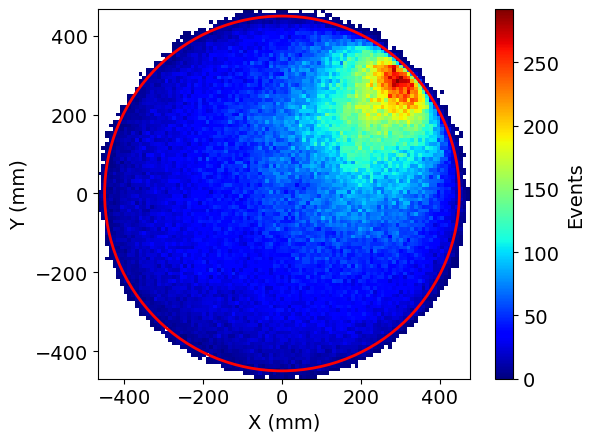

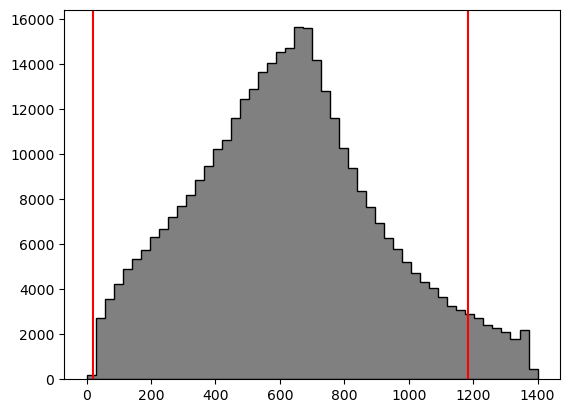

In [137]:
fig, ax = plt.subplots()
h = ax.hist2d(reco_nofid.X_bary, reco_nofid.Y_bary, (100, 100), cmap = cmap, vmin = 1e-10)
circle = plt.Circle((0, 0), 450, fill=False, linewidth=2, color = 'r')
ax.add_patch(circle)
ax.set_aspect('equal', adjustable='box')
cbar = fig.colorbar(h[3], ax=ax)
cbar.set_label("Events", size = 14)
cbar.ax.tick_params(labelsize = 14)
plt.xlabel('X (mm)', size = 14)
plt.ylabel('Y (mm)', size = 14)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.show()

plt.hist(reco_nofid.Z_bary, 50, (0, 1400), histtype='stepfilled', color = 'grey', edgecolor = 'k')
plt.axvline(20, color = 'r')
plt.axvline(1184, color = 'r')

In [126]:
h[3]

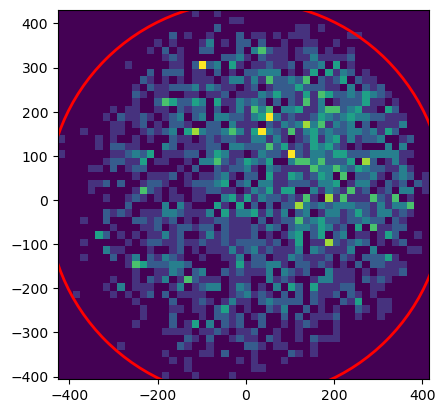

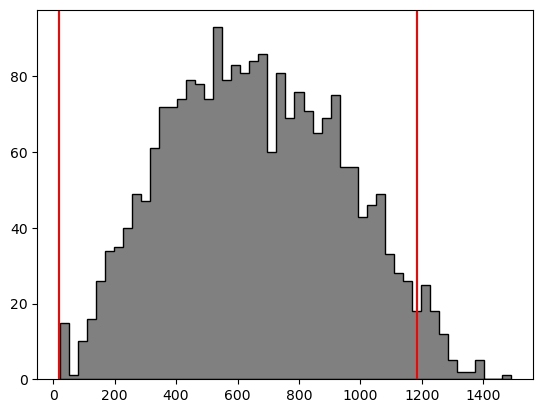

In [111]:
fig, ax = plt.subplots()
ax.hist2d(pp_events_nofid.X_bary, pp_events_nofid.Y_bary, (50, 50))
circle = plt.Circle((0, 0), 450, fill=False, linewidth=2, color = 'r')
ax.add_patch(circle)
ax.set_aspect('equal', adjustable='box')
plt.show()
plt.hist(pp_events_nofid.Z_bary, 50, histtype='stepfilled', color = 'grey', edgecolor = 'k')
plt.axvline(20, color = 'r')
plt.axvline(1184, color = 'r')

### Load data

Join all run DST, RECO and efficiency information. At this point, data is already:
* Clean from scatter hits
* Scatter hit energy distributed using Q per slice
* Energy corrected using Kr 3D map

In [5]:
dst_summ, reco_summ, eff_summ = pd.DataFrame([]), pd.DataFrame([]), pd.DataFrame([])
for run_n in run_numbers:
    save_path_summary = path.format(run_folder = run_folder, run_number = run_n) + run_summary_name.format(run_n) # meter aqui el nuevo nombre con q7 para los runes especiales
    run_dst  = pd.read_hdf(save_path_summary, 'DST/Events')
    run_dst['run_n'] = str(run_n)
    run_reco = pd.read_hdf(save_path_summary, 'RECO/Events_summary')
    eff = pd.read_hdf(save_path_summary, 'RUN/eff')
    eff['run_n'] = run_n

    dst_summ = dst_summ.append(run_dst)
    reco_summ = reco_summ.append(run_reco)
    eff_summ = eff_summ.append(eff)


### Time correction

In [6]:
from scipy.interpolate import interp1d
def smooth(y, n=4):
    m  = len(y)
    yf = np.flip(y)
    y = np.concatenate([yf, y, yf])
    z = np.ones(n) / n
    y = np.convolve(y, z, mode="same")
    return y[m:2*m]

time_data = pd.read_hdf("/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/HE_runs/energy_scale_he.h5", "/data")
smoothed  = smooth(time_data.e0, 4)
corr      = smoothed.min() / smoothed
time_correction = interp1d(time_data.time,  corr, "cubic", bounds_error=False, fill_value=(corr[0], corr[-1]))

dates = pd.to_datetime(time_data.ts.values).strftime('%d-%m %H:%M')

In [7]:
reco_summ.insert(reco_summ.shape[1], "Et", reco_summ.total_energy * time_correction(reco_summ.time))

In [29]:
# plt.figure(figsize=(15, 5))
# plt.errorbar(time_data.time, smoothed, yerr=time_data.e0u, marker = 'o', ls = '--', color = 'k', capsize=2)
# plt.xticks(time_data.time[::3], dates[::3], size = 14)
# plt.yticks(size = 14)
# plt.xlabel('Date', size = 14)
# plt.ylabel('E$_0$ (pe)', size = 14)
# plt.grid()
# # plt.axvline(reco_summ.time.min(), c='r')
# # plt.axvline(reco_summ.time.max(), c='r')

# plt.show()

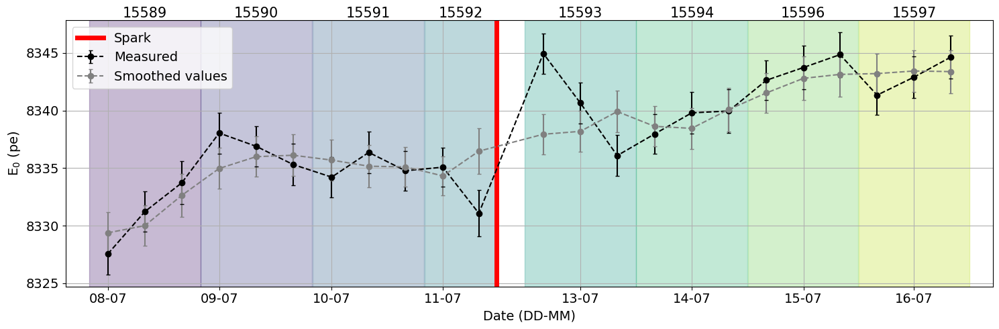

In [30]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


pltcol = get_plot_colors(run_numbers, cm.get_cmap('viridis'))
plt.figure(figsize=(15, 5))

# --- your original plot ---
plt.errorbar(
    time_data.time,
    time_data.e0,                      # your y-values
    yerr=time_data.e0u,
    marker='o',
    ls='--',
    color='k',
    capsize=2,
    label = 'Measured'
)
plt.errorbar(
    time_data.time,
    smoothed,                      # your y-values
    yerr=time_data.e0u,
    marker='o',
    ls='--',
    color='grey',
    capsize=2, 
    label = 'Smoothed values'
)

# --- highlight each run as a shaded band ---
ax = plt.gca()
for i, run in enumerate(time_data['run'].unique()):
    rdata = dst_summ[dst_summ['run_n'] == str(run)]
    x0 = rdata['time'].min()
    x1 = rdata['time'].max()

    # transparent vertical rectangle
    ax.add_patch(Rectangle(
        (x0, ax.get_ylim()[0]),     # lower-left corner
        x1 - x0,                    # width
        ax.get_ylim()[1] - ax.get_ylim()[0],  # full height
        color=pltcol[i],
        alpha=0.3,
        zorder=-1                   # draw behind the data
    ))

    # run label at the center of the band
    ax.text(
        (x0 + x1) / 2,
        ax.get_ylim()[1] * 1,     # a little above the plot
        f'{run}',
        ha='center', va='bottom', fontsize=15
    )

# --- same tick formatting you already had ---
plt.xticks(
    time_data.time[::3],
    time_data.ts[::3].dt.strftime('%d-%m'),
    size=14, rotation=0
)
plt.yticks(size=14)
plt.xlabel('Date (DD-MM)', size=14)
plt.ylabel('E$_0$ (pe)', size=14)
plt.axvline(dst_summ[dst_summ['run_n'] =='15592']['time'].max(), color = 'r', lw=5, label = 'Spark')
plt.legend(fontsize = 14)
plt.grid()
plt.tight_layout()
# plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/kr_t_evol.pdf', dpi=600, bbox_inches='tight', transparent = True) 
plt.show()

In [31]:
# import matplotlib.pyplot as plt
# from matplotlib.patches import Rectangle


# pltcol = get_plot_colors(run_numbers, cm.get_cmap('viridis'))
# plt.figure(figsize=(15, 5))

# # --- your original plot ---
# plt.errorbar(
#     time_data.time,
#     smoothed,                      # your y-values
#     yerr=time_data.e0u,
#     marker='o',
#     ls='--',
#     color='k',
#     capsize=2
# )

# # --- highlight each run as a shaded band ---
# ax = plt.gca()
# for i, run in enumerate(time_data['run'].unique()):
#     rdata = dst_summ[dst_summ['run_n'] == str(run)]
#     x0 = rdata['time'].min()
#     x1 = rdata['time'].max()

#     # transparent vertical rectangle
#     ax.add_patch(Rectangle(
#         (x0, ax.get_ylim()[0]),     # lower-left corner
#         x1 - x0,                    # width
#         ax.get_ylim()[1] - ax.get_ylim()[0],  # full height
#         color=pltcol[i],
#         alpha=0.3,
#         zorder=-1                   # draw behind the data
#     ))

#     # run label at the center of the band
#     ax.text(
#         (x0 + x1) / 2,
#         ax.get_ylim()[1] * 1,     # a little above the plot
#         f'{run}',
#         ha='center', va='bottom', fontsize=15
#     )

# # --- same tick formatting you already had ---
# plt.xticks(
#     time_data.time[::3],
#     time_data.ts[::3].dt.strftime('%d-%m'),
#     size=14, rotation=0
# )
# plt.yticks(size=14)
# plt.xlabel('Date (DD-MM)', size=14)
# plt.ylabel('E$_0$ (pe)', size=14)
# plt.grid()
# plt.tight_layout()
# # plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/kr_t_evol_smooth.pdf', dpi=600, bbox_inches='tight', transparent = True) 
# plt.show()



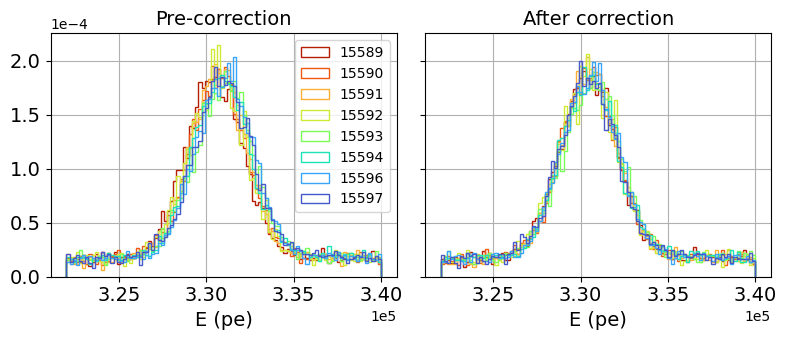

In [32]:
peak_ranges = [(1e5, 1.1e5), (1.125e5, 1.275e5), (1.44e5, 1.55e5), (1.72e5, 1.83e5), (3.22e5, 3.4e5), (5.3e5, 5.6e5)]

fig, (ax1, ax2) = plt.subplots(
    1, 2,                      # 1 row, 2 columns
    figsize=(8, 3.5),            # total figure size
    sharey=True
)
for i, run_n in enumerate(run_numbers):
    rdata = reco_summ[reco_summ.run_n == str(run_n)]
    ax1.hist(rdata['total_energy'], 100, peak_ranges[-2], histtype='step', color = plot_colors[i], density=True, label = run_n)
    ax2.hist(rdata['Et'], 100, peak_ranges[-2], histtype='step', color = plot_colors[i], density=True)
ax1.grid()
ax2.grid()
ax1.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
ax1.tick_params(axis='both', which='major', labelsize=14) 
ax2.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
ax2.tick_params(axis='both', which='major', labelsize=14) 

ax1.set_title('Pre-correction', size = 14)
ax2.set_title('After correction', size = 14)
ax1.set_xlabel('E (pe)', size = 14)
ax2.set_xlabel('E (pe)', size = 14)
ax1.legend()
fig.tight_layout()

## Efficiences

Check the efficiency of the cuts of each run

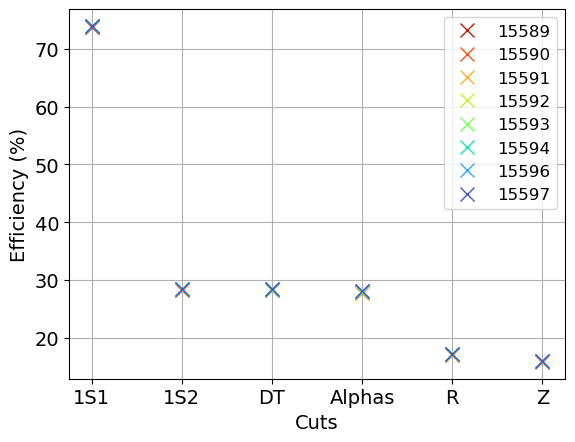

In [33]:
for run_n, c in zip(run_numbers, plot_colors):
    plt.plot(['1S1', '1S2', 'DT', 'Alphas', 'R', 'Z'], (eff_summ[eff_summ.run_n == run_n][['1S1', '1S2', 'DT', 'alphas', 'rad', 'z']] / eff_summ[eff_summ.run_n == run_n][['total']].values).T * 100, 'x', color = c, markersize = 10, label = run_n)
plt.grid()
plt.legend(fontsize = 12)
plt.xlabel('Cuts', size=14)
plt.ylabel('Efficiency (%)',size=14)
plt.xticks(size = 14)
plt.yticks(size=14)
plt.show()
# plt.savefig('/home/usc/ie/mpm/HE_plots/cut_eff.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [34]:
eff_ = eff_summ.copy()
eff_['time'] = np.round(((dst_summ.groupby('run_n').time.max() - dst_summ.groupby('run_n').time.min()) / 3600).values, 2)
eff_add = eff_.sum()
eff_add = pd.DataFrame(eff_add).T
eff_[['1S1', '1S2', 'DT', 'alphas', 'rad', 'z']] = (eff_[['1S1', '1S2', 'DT', 'alphas', 'rad', 'z']] * 100).div(eff_["total"], axis=0).round(2)
eff_add[['1S1', '1S2', 'DT', 'alphas', 'rad', 'z']] = (eff_add[['1S1', '1S2', 'DT', 'alphas', 'rad', 'z']] * 100).div(eff_add["total"], axis=0).round(2)
eff_ = eff_[['run_n', 'time','total', '1S1', '1S2', 'DT', 'alphas', 'rad', 'z']]
eff_add = eff_add[['run_n', 'time','total', '1S1', '1S2', 'DT', 'alphas', 'rad', 'z']]
# print(eff_.to_latex(index=False))

## Energy spectra

Plot the energy spectra, without and with correction + time correction

In [8]:
erange = (0.04e6, 0.6e6)

Text(0, 0.5, 'Counts')

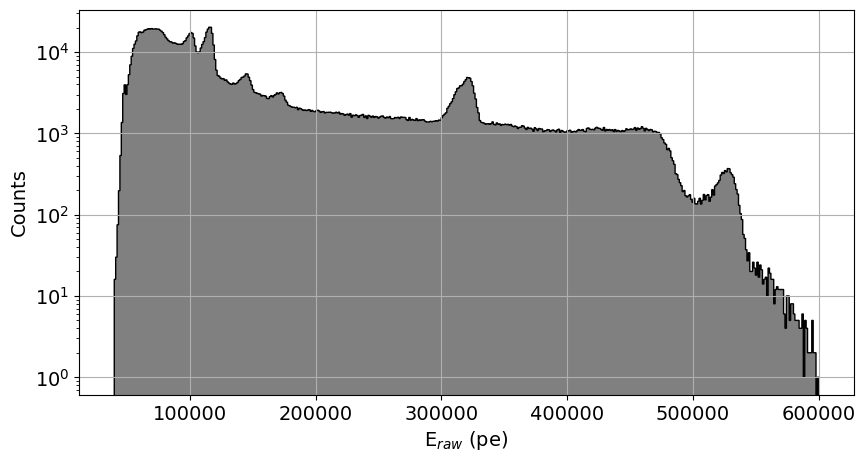

In [36]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.total_E, 500, erange, histtype='stepfilled', color = 'grey', edgecolor = 'k')

plt.grid()
plt.yscale('log')
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.xlabel('E$_{raw}$ (pe)', size = 14)
plt.ylabel('Counts', size = 14)
# plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/raw_spectra.pdf', dpi=600, bbox_inches='tight', transparent = True) 

Text(0, 0.5, 'Counts')

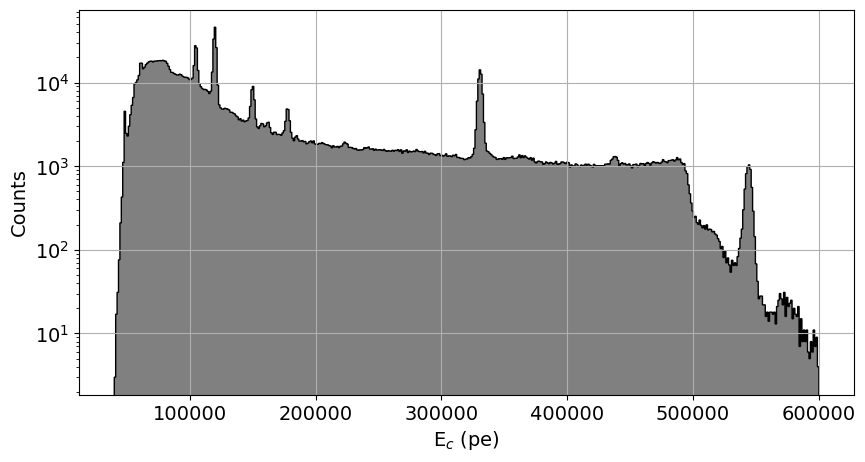

In [37]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.total_energy, 500, erange, histtype='stepfilled', color = 'grey', edgecolor = 'k')

plt.grid()
plt.yscale('log')
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.xlabel('E$_c$ (pe)', size = 14)
plt.ylabel('Counts', size = 14)

Text(0, 0.5, 'Counts')

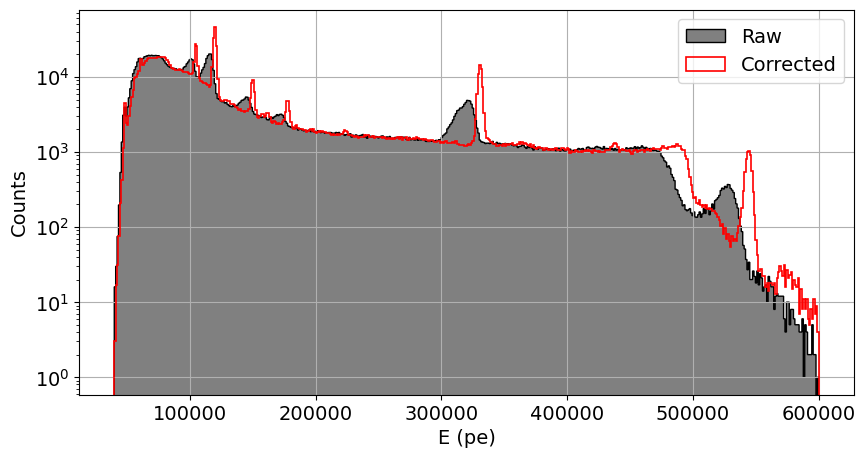

In [38]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.total_E, 500, erange, histtype='stepfilled', color = 'grey', edgecolor = 'k', alpha = 1, label='Raw')
plt.hist(reco_summ.total_energy, 500, erange, histtype='step', edgecolor = 'r', label='Corrected', lw = 1.2)

plt.grid()
plt.yscale('log')
plt.legend(fontsize=14)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.xlabel('E (pe)', size = 14)
plt.ylabel('Counts', size = 14)

Text(0, 0.5, 'Counts')

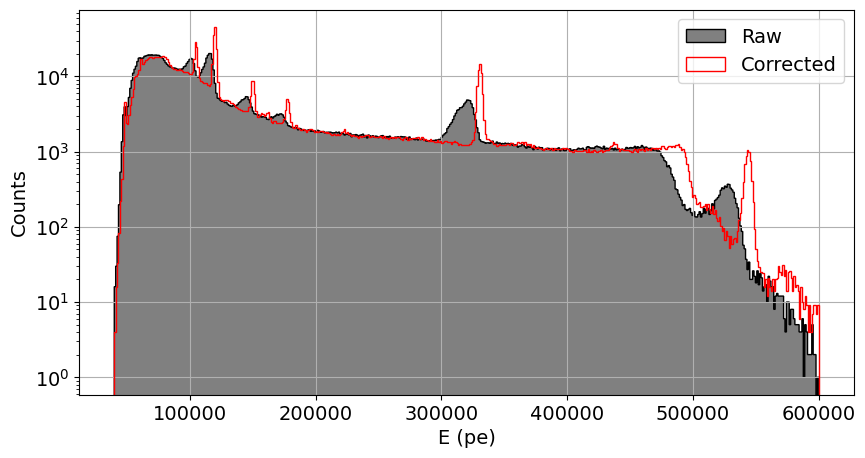

In [39]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.total_E, 500, erange, histtype='stepfilled', color = 'grey', edgecolor = 'k', label='Raw')
plt.hist(reco_summ.Et, 500, erange, histtype='step', color = 'grey', edgecolor = 'r', label='Corrected')

plt.grid()
plt.yscale('log')
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(fontsize=14)
plt.xlabel('E (pe)', size = 14)
plt.ylabel('Counts', size = 14)

In [286]:
# plt.figure(figsize=(10, 5))
# plt.hist(reco_summ.total_energy_d, 500, (0.14, 3), histtype='stepfilled', color = 'grey', edgecolor = 'k')

# plt.grid()
# plt.yscale('log')
# plt.axvline(0.511, c = 'r', label = '511 keV\ne+e- anihilation')
# plt.axvline(0.583, c = 'orange', label = '583 keV\n' + r'$^{208}$Tl $\rightarrow$ $^{208}$Pb')
# plt.axvline(0.727, c = 'y', label = '727 keV\n' + r'$^{212}$Bi $\rightarrow$ $^{212}$Po')
# plt.axvline(0.860, c = 'g', label = '860 keV\n' + r'$^{208}$Tl $\rightarrow$ $^{208}$Pb')
# plt.axvline(1.592, c = 'b', label = '1592 keV\nDEP')
# plt.axvline(2.615, c = 'm', label = '2615 keV\nPP')
# plt.legend(loc = 'lower left')
# plt.xticks(size = 14)
# plt.yticks(size = 14)
# plt.xlabel('E (MeV)', size = 14)
# plt.ylabel('Counts', size = 14)

# # plt.savefig('/home/usc/ie/mpm/HE_plots/energy_spectra_noshift.pdf', dpi=600, bbox_inches='tight', transparent = True) 


## Energy scale

To get a good resolution of the peaks when joining several runs, we should fix the energy scale run by run.

In this section, we get the peak centers (`get_peak_centers`) run by run. Then, we fit the Real vs Measured peak energy to a line with slope m and interceipt b (`energy_scale_fit`), and shift the whole spectra by it, using:

$$E_{shift} = E * m + b $$ 

In [9]:
def get_peak_centers(run_numbers, reco_summ, variable, peak_ranges, npeaks = 4, plot = True):
    peak_nbins = [100, 100, 60, 40, 100, 25]
    peak_names  = ['e+e- anihilation (511 keV)', r'$^{208}$Tl $\rightarrow$ $^{208}$Pb (583 keV)', r'$^{212}$Bi $\rightarrow$ $^{212}$Po (727 keV)', r'$^{208}$Tl $\rightarrow$ $^{208}$Pb (860 keV)', '1592 keV\nDEP', '2615 keV\nPP']

    ranges = peak_ranges[:npeaks]
    nbins  = peak_nbins[:npeaks]
    names  = peak_names[:npeaks]
    
    meas_peaks = {}
    for run_n in run_numbers:
        run_reco = reco_summ[reco_summ.run_n == str(run_n)]
        meas_val, meas_err = [], []
        for rang, nbin, name in zip(ranges, nbins, names):
            par, res = fit_whole_peaks(run_reco, variable, peak_fit, rang, nbin, title = 'Run {} - '.format(run_n) + name, plot = plot)
            meas_val.append(par[0][1])
            meas_err.append(par[1][1])
        meas_peaks[run_n] = [meas_val, meas_err]
    return meas_peaks

def get_peak_centers_whole(reco_summ, variable, peak_ranges, npeaks = 4, plot = True, eneunits = 'pe', peak_nbins = [200, 200, 200, 200, 200, 200]):
    peak_names  = ['e+e- anihilation (511 keV)', r'$^{208}$Tl $\rightarrow$ $^{208}$Pb (583 keV)', r'$^{212}$Bi $\rightarrow$ $^{212}$Po (727 keV)', r'$^{208}$Tl $\rightarrow$ $^{208}$Pb (860 keV)', '1592 keV\nDEP', '2615 keV\nPP']

    ranges = peak_ranges[:npeaks]
    nbins  = peak_nbins[:npeaks]
    names  = peak_names[:npeaks]
    
    meas_val, meas_err = [], []
    res_val, res_err = [], []
    for rang, nbin, name in zip(ranges, nbins, names):
        par, res = fit_whole_peaks(reco_summ, variable, peak_fit, rang, nbin, title = 'Run {} - '.format(run_n) + name, plot = plot, ene_units=eneunits)
        meas_val.append(par[0][1]) #second index to get center of gaussian
        meas_err.append(par[1][1])
        res_val.append(res[0])
        res_err.append(res[1])
    return (meas_val, meas_err), (res_val, res_err)

def energy_scale_fit(meas_peaks, run_numbers, plot_colors, npeaks = 4):
    real_peaks = [0.511, 0.583, 0.727, 0.86, 1.592, 2.615]
    color_peak = ['r', 'orange', 'y', 'g', 'b', 'm']
    real_peaks = real_peaks[:npeaks]
    color_peak = color_peak[:npeaks]
    
    parameters = {}
    for run_n, c in zip(run_numbers, plot_colors):
        if run_n not in meas_peaks.keys(): continue
        if len(meas_peaks[run_n][0]) == 0: continue
        for m_, e_, r_, c_ in zip(meas_peaks[run_n][0], meas_peaks[run_n][1], real_peaks, color_peak):
            # plt.plot(m_, r_, '.', color = c_)
            plt.errorbar(r_, m_, yerr = e_, color=c_, marker='.', capsize=2)
        par, err  = curve_fit(lineal, meas_peaks[run_n][0], real_peaks, p0 = (1, 0))
        plt.plot(lineal(np.array(meas_peaks[run_n][0]), *par),meas_peaks[run_n][0],  color = c, label = str(run_n) + '\n m = {:.2e}'.format(par[0]) + '\n n = {:.2e}'.format(par[1]))
        parameters[run_n] = par
    plt.legend(loc = 'center left', bbox_to_anchor = (1, 0.5), fontsize =12)
    plt.grid()
    plt.xlabel('Real peak energy (MeV)', size = 14)
    plt.ylabel('Measured peak energy (pe)', size = 14)
    plt.xticks(size = 14)
    plt.yticks(size = 14)
    return parameters

def energy_scale_fit_whole(meas_peaks, plot_colors, npeaks = 4):
    real_peaks = [0.511, 0.583, 0.727, 0.86, 1.592, 2.615]
    color_peak = ['r', 'orange', 'y', 'g', 'b', 'm']
    real_peaks = real_peaks[:npeaks]
    color_peak = color_peak[:npeaks]
    
    for m_, e_, r_, c_ in zip(meas_peaks[0], meas_peaks[1], real_peaks, color_peak):
        plt.errorbar(r_, m_, yerr = e_, color=c_, marker='o', capsize=2)
    par, err  = curve_fit(lineal, meas_peaks[0], real_peaks, p0 = (1, 0))
    err = np.sqrt(np.diag(err))

    plt.plot(lineal(np.array(meas_peaks[0]), *par),meas_peaks[0],  color = 'k', label = 'm$ = {:.2e} \pm {:.2e}$ MeV / pe'.format(par[0], err[0]) + '\n n$ = {:.2e} \pm {:.2e}$ MeV'.format(par[1], err[1]))
    plt.legend(fontsize =12)
    plt.grid()
    plt.xlabel('Real peak energy (MeV)', size = 14)
    plt.ylabel('Measured peak energy (pe)', size = 14)
    plt.xticks(size = 14)
    plt.yticks(size = 14)
    return par


def plot_real_vs_meas_peaks(meas_peaks, param, run_numbers, plot_colors, npeak = 4):
    real_peaks = [0.511, 0.583, 0.727, 0.86, 1.592, 2.615]
    real_peaks = real_peaks[:npeak]
    for run_n, c in zip(run_numbers, plot_colors):
        par = param[run_n]
        if run_n not in meas_peaks.keys(): continue
        if len(meas_peaks[run_n][0]) == 0: continue
        m_ = np.array(meas_peaks[run_n][0])
        # m_ = m_ * par[0] + par[1]
        e_ = np.array(meas_peaks[run_n][1])
        r_ = np.array(real_peaks)
        # e_ = (e_ * par[0] / r_) 
        # plt.errorbar(r_, ((m_ - r_) / r_) * 100, yerr = e_*100, color = c, markersize = 10, label = run_n, marker = '.', capsize=2)
        plt.errorbar(r_, ((m_ - r_) / r_) * 100, yerr = e_*100, color = c, markersize = 10, label = run_n, marker = '.', capsize=2)
    plt.legend(fontsize = 12)
    plt.grid()
    plt.xlabel('Real peak energy (MeV)', size = 14)
    plt.ylabel('(Measured - Real) / Real peak energy (%)', size = 14)
    plt.xticks(size = 14)
    plt.yticks(size = 14)

def plot_peak_variations(meas_peaks, param, run_numbers, plot_colors, npeak=4):
    """
    Plot % variation of measured peaks across runs, keeping original style.
    
    meas_peaks: dict {run_n: [[measured_peaks_PE], [errors_PE]]}
    param: not used here, kept for compatibility
    run_numbers: list of run names to plot
    plot_colors: list of colors for each run
    npeak: number of peaks to consider
    """
    # Keep real peaks for reference (MeV), truncated to npeak
    real_peaks = [0.511, 0.583, 0.727, 0.86, 1.592, 2.615][:npeak]
    
    # Collect measured PE for all runs for normalization
    all_peaks = []
    for run_n in run_numbers:
        if run_n not in meas_peaks or len(meas_peaks[run_n][0]) == 0:
            continue
        all_peaks.append(meas_peaks[run_n][0][:npeak])
    
    if len(all_peaks) == 0:
        print("No peak data available.")
        return
    
    all_peaks = np.array(all_peaks)  # shape: (n_runs_with_data, npeak)
    peak_means = all_peaks.mean(axis=0)  # mean per peak across runs
    
    # Plot each run
    for run_n, c in zip(run_numbers, plot_colors):
        if run_n not in meas_peaks or len(meas_peaks[run_n][0]) == 0:
            continue
        m_ = np.array(meas_peaks[run_n][0][:npeak])
        e_ = np.array(meas_peaks[run_n][1][:npeak])
        
        # % deviation from mean of that peak across runs
        percent_dev = (m_ - peak_means) / peak_means * 100
        percent_err = e_ / peak_means * 100
        
        plt.errorbar(
            real_peaks, percent_dev, yerr=percent_err,
            color=c, markersize=10, label=run_n,
            marker='.', capsize=2
        )
    
    plt.legend(fontsize=12)
    plt.grid()
    plt.xlabel('Real peak energy (MeV)', size=14)
    plt.ylabel('Deviation from mean (% of peak)', size=14)
    plt.xticks(size=14)
    plt.yticks(size=14)


In [10]:
real_peaks = [0.511, 0.583, 0.727, 0.86, 1.592, 2.615]
peak_ranges = [(1e5, 1.1e5), (1.125e5, 1.275e5), (1.44e5, 1.55e5), (1.72e5, 1.83e5), (3.22e5, 3.4e5), (5.3e5, 5.6e5)]
peak_ranges_t = [(1e5, 1.1e5), (1.125e5, 1.275e5), (1.44e5, 1.55e5), (1.72e5, 1.83e5), (3.22e5, 3.4e5), (5.3e5, 5.6e5)]

Obtaining the measured peaks (for both the regular spectra and the corrected by the outer dropped hits energy), and from them the shifting parameters

In [52]:
meas_peaks = get_peak_centers(run_numbers, reco_summ, 'total_energy', peak_ranges, npeaks=6, plot = False)
meas_peaks_t = get_peak_centers(run_numbers, reco_summ, 'Et', peak_ranges_t, npeaks = 6, plot = False)

/scratch/938598/ipykernel_4055245/4034393438.py:34: RuntimeWarning: overflow encountered in exp
  return m *np.exp(-x/c)


In [11]:
meas_peaks_whole, meas_peaks_R_whole = get_peak_centers_whole(reco_summ, 'Et', peak_ranges_t, npeaks=6, plot = False)

/scratch/963652/ipykernel_4144220/4034393438.py:34: RuntimeWarning: overflow encountered in exp
  return m *np.exp(-x/c)


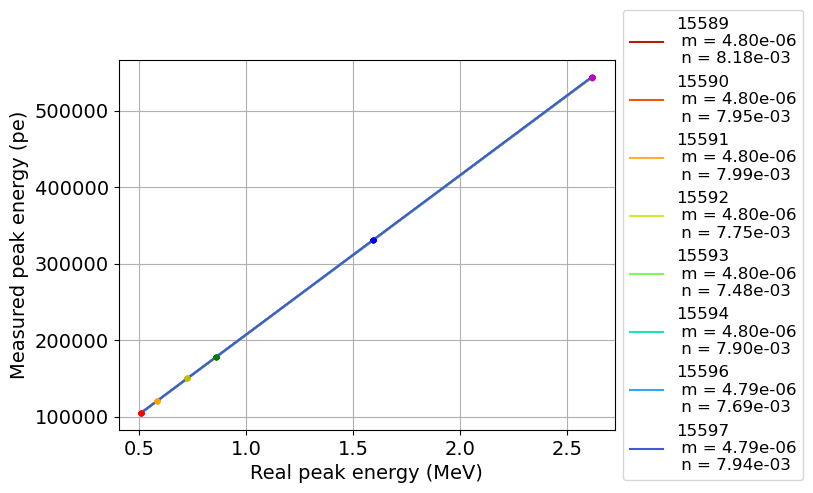

In [54]:
param = energy_scale_fit(meas_peaks, run_numbers, plot_colors, npeaks = 6)

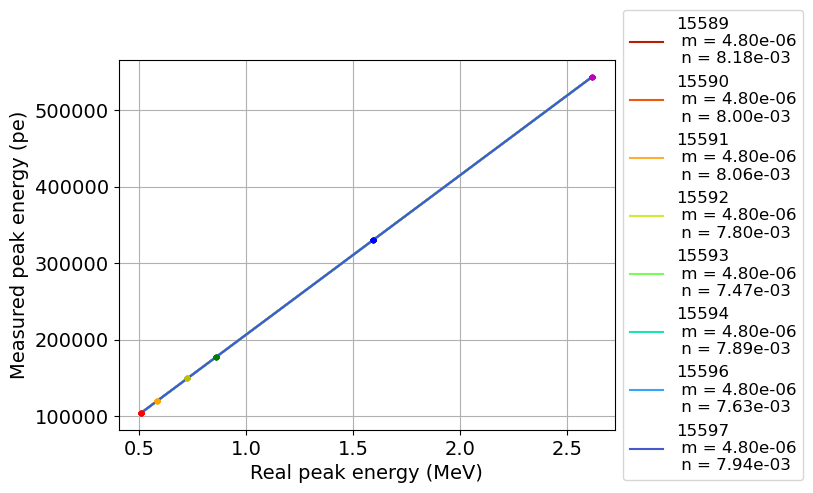

In [55]:
param_t = energy_scale_fit(meas_peaks_t, run_numbers, plot_colors, npeaks = 6)
# plt.savefig('/home/usc/ie/mpm/HE_plots/lin_calib.pdf', dpi=600, bbox_inches='tight', transparent = True) 

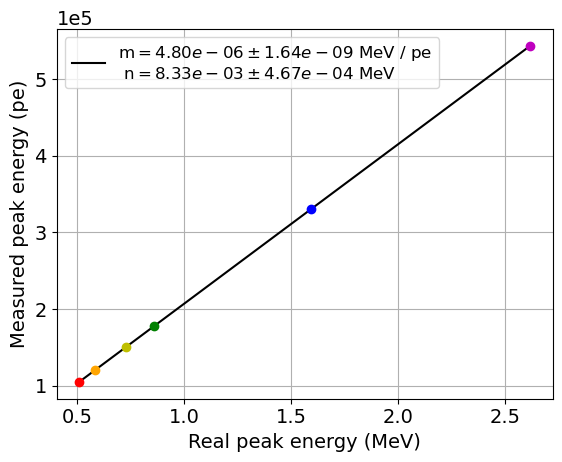

In [12]:
param_whole = energy_scale_fit_whole(meas_peaks_whole, plot_colors, npeaks = 6)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
plt.gca().yaxis.get_offset_text().set_fontsize(14) 
# plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/scale_fit.pdf', dpi=600, bbox_inches='tight', transparent = True) 


We can plot how much each peak differ from the real value

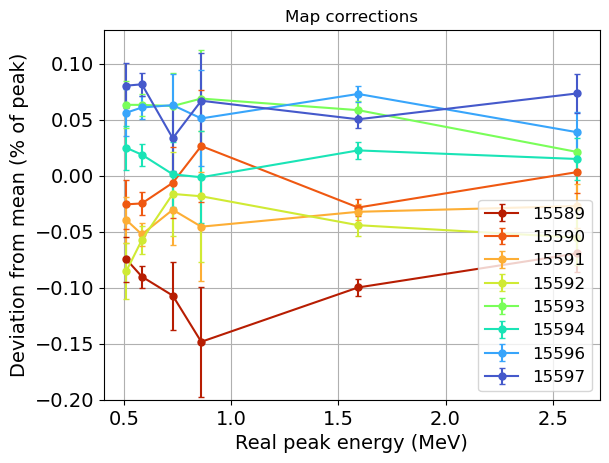

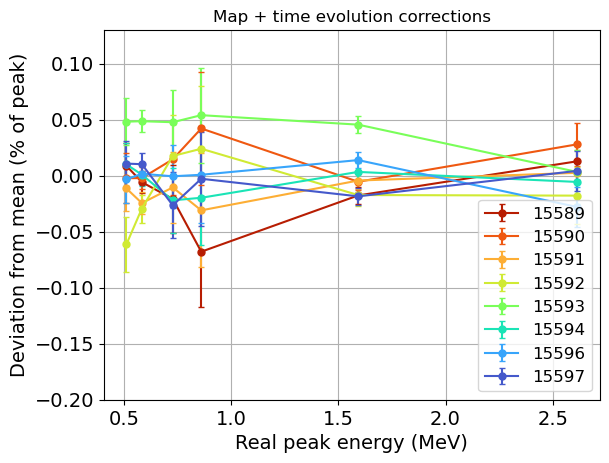

In [57]:
plot_peak_variations(meas_peaks, param, run_numbers, plot_colors, npeak = 6)
plt.title('Map corrections')
plt.ylim((-0.2, 0.13))
plt.show()
plot_peak_variations(meas_peaks_t, param_t, run_numbers, plot_colors, npeak = 6)
plt.title('Map + time evolution corrections')
plt.ylim((-0.2, 0.13))
plt.show()

Doing the correction using the obtained parameters

In [58]:
reco_summ['E_shifted']   = reco_summ['total_energy'] * reco_summ['run_n'].map(lambda r: param[int(r)][0]) + reco_summ['run_n'].map(lambda r: param[int(r)][1])
reco_summ['E_shifted_t'] = reco_summ['Et'] * reco_summ['run_n'].map(lambda r: param_t[int(r)][0]) + reco_summ['run_n'].map(lambda r: param_t[int(r)][1])

In [13]:
reco_summ['E_final']   = reco_summ['Et'] * param_whole[0] + param_whole[1]

Plotting the shifted spectras

Text(0, 0.5, 'Counts')

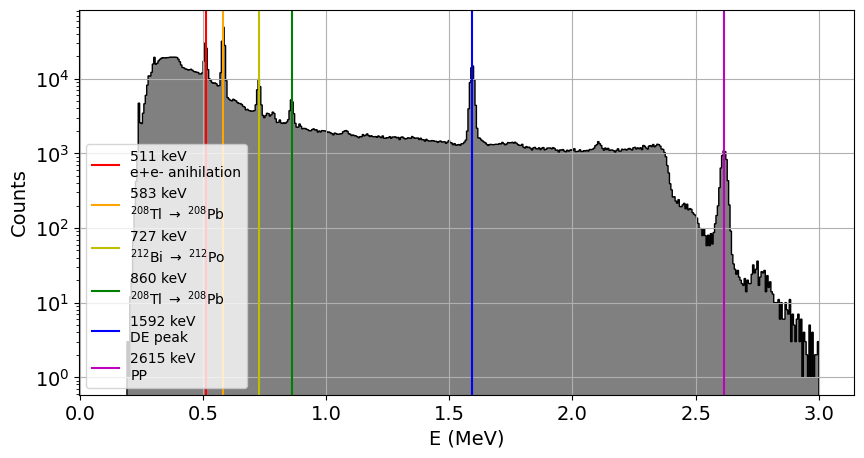

In [60]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.E_final, 500, (0.14, 3), histtype='stepfilled', color = 'grey', edgecolor = 'k')

plt.grid()
plt.yscale('log')
plt.axvline(0.511, c = 'r', label = '511 keV\ne+e- anihilation')
plt.axvline(0.583, c = 'orange', label = '583 keV\n' + r'$^{208}$Tl $\rightarrow$ $^{208}$Pb')
plt.axvline(0.727, c = 'y', label = '727 keV\n' + r'$^{212}$Bi $\rightarrow$ $^{212}$Po')
plt.axvline(0.860, c = 'g', label = '860 keV\n' + r'$^{208}$Tl $\rightarrow$ $^{208}$Pb')
plt.axvline(1.592, c = 'b', label = '1592 keV\nDE peak')
plt.axvline(2.615, c = 'm', label = '2615 keV\nPP')
plt.legend(loc = 'lower left')
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.xlabel('E (MeV)', size = 14)
plt.ylabel('Counts', size = 14)

# plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/scaled_spectra.pdf', dpi=600, bbox_inches='tight', transparent = True) 


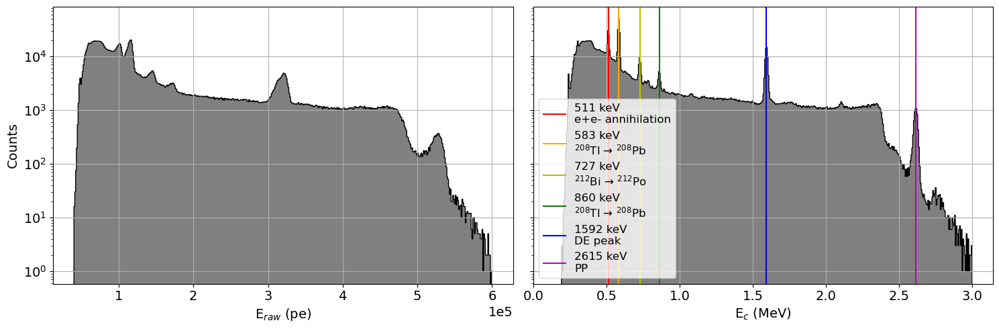

In [ ]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(
    1, 2,                      # 1 row, 2 columns
    figsize=(15, 5),            # total figure size
    sharey=True                 # <-- share the y axis
)

# --- Left plot ---------------------------------------------------
ax1.hist(
    reco_summ.total_E,
    bins=500,
    range=erange,
    histtype='stepfilled',
    color='grey',
    edgecolor='k'
)
ax1.grid()
ax1.set_yscale('log')
ax1.set_xlabel('E$_{raw}$ (pe)', fontsize=14)
ax1.set_ylabel('Counts', fontsize=14)
ax1.tick_params(labelsize=14)
ax1.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
ax1.xaxis.get_offset_text().set_fontsize(14)

# --- Right plot --------------------------------------------------
ax2.hist(
    reco_summ.E_final,
    bins=500,
    range=(0.14, 3),
    histtype='stepfilled',
    color='grey',
    edgecolor='k',
    alpha=1
)
ax2.grid()
ax2.set_yscale('log')
ax2.axvline(0.511, c='r',     label='511 keV\ne+e- annihilation')
ax2.axvline(0.583, c='orange', label='583 keV\n$^{208}$Tl → $^{208}$Pb')
ax2.axvline(0.727, c='y',      label='727 keV\n$^{212}$Bi → $^{212}$Po')
ax2.axvline(0.860, c='g',      label='860 keV\n$^{208}$Tl → $^{208}$Pb')
ax2.axvline(1.592, c='b',      label='1592 keV\nDE peak')
ax2.axvline(2.615, c='m',      label='2615 keV\nPP')
ax2.legend(loc='lower left', fontsize=12)
ax2.set_xlabel('E$_c$ (MeV)', fontsize=14)
ax2.tick_params(labelsize=14)

plt.tight_layout()
# plt.savefig('/home/usc/ie/mpm/HE_plots/final_ana/raw_fin_spec.pdf', dpi=600, bbox_inches='tight', transparent = True) 

We can get again the peak centers, now for the shifted spectras, to check how much they still differ from the original values

In [35]:
peak_ranges_shift = [(0.48, 0.55), (0.55, 0.61), (0.7, 0.76), (0.83, 0.89), (1.52, 1.67), (2.55, 2.67)]

In [36]:
meas_peaks_shift = get_peak_centers(run_numbers, reco_summ, 'E_shifted', peak_ranges_shift, npeaks=6, plot = False)
meas_peaks_shift_t = get_peak_centers(run_numbers, reco_summ, 'E_shifted_t', peak_ranges_shift, npeaks=6, plot = False)

/scratch/919082/ipykernel_4015566/4034393438.py:34: RuntimeWarning: overflow encountered in exp
  return m *np.exp(-x/c)
/scratch/919082/ipykernel_4015566/4034393438.py:34: RuntimeWarning: overflow encountered in multiply
  return m *np.exp(-x/c)


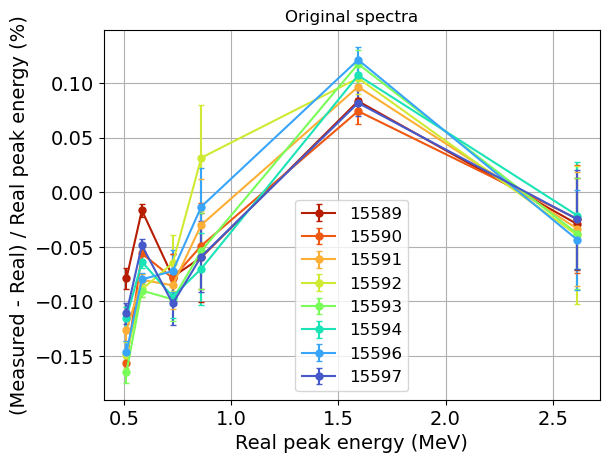

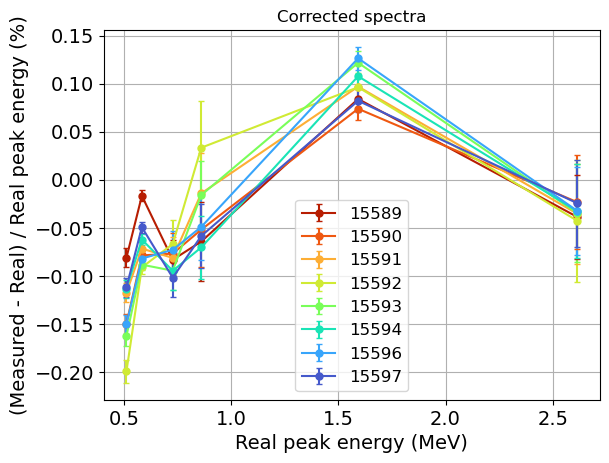

In [37]:
plot_real_vs_meas_peaks(meas_peaks_shift, param, run_numbers, plot_colors, npeak=6)
plt.title('Original spectra')
plt.show()
plot_real_vs_meas_peaks(meas_peaks_shift_t, param_t, run_numbers, plot_colors, npeak=6)
plt.title('Corrected spectra')
plt.show()

## Energy resolution

We can do a first estimation of the energy resolution now that the energy scale has been fixed run by run. In this case I'm doing it for the corrected spectra by the outer dropped energy hits.

I'm doing it for all peaks to check how each one of them extrapolates.

In [14]:
def reso_func(x, a, b, c):
    return np.sqrt(a / x**2 + b / x + c)

def sq_lin(x, a, b, c):
    return a*x**2+b*x+c

def reso_peak_fit(x, y, yerr, factor = 1000, p0 = (4e5, 1e3, 7e-2), bounds = [(0, 0, 0), (np.inf, np.inf, np.inf)]):
    xplotvals = np.array(x) * factor
    plt.errorbar(xplotvals, y, yerr=yerr, marker = '.', color = 'k', markersize = 8, linestyle='')
    par, err  = curve_fit(reso_func, xplotvals, y, p0 = p0, bounds=bounds)
    xfit = np.linspace(0.2, 3, 100) * factor
    expr = "{:.2e} / x^2 + {:.2e} / x + {:.2e}".format(*par)
    plt.plot(xfit, reso_func(np.array(xfit), *par),  color = 'r', label = r"$\sqrt{" + expr + r"}$")
    plt.xlabel('E (MeV)', size = 14)
    plt.ylabel('R (% FWHM)', size = 14)
    plt.xticks(size = 14)
    plt.yticks(size = 14)
    plt.legend(fontsize = 12)
    plt.grid()
    return par

def reso_peak_fit_lin(x, y, yerr, bounds = [(0, 0), (np.inf, np.inf)]):
    e_inv = 1 / (np.array(x))
    r_sq = np.array(y)**2
    r_sq_s = 2 * np.array(y) * np.array(yerr)

    plt.errorbar(e_inv, r_sq, yerr= r_sq_s, marker = '.', color = 'k', markersize = 8, linestyle='')

    p, e = curve_fit(lineal, e_inv, r_sq, p0 = (1, 1), bounds = bounds)
    plt.plot(e_inv, lineal(e_inv, *p), color = 'r', label = "{:.2e} x + {:.2e}".format(*p))
    plt.xticks(size = 14)
    plt.yticks(size = 14)
    plt.legend(fontsize = 12)
    plt.xlabel('1/E (MeV$^{-1}$)', size = 14)
    plt.ylabel('R$^2$ (%FWHM)$^2$', size = 14)
    plt.grid()
    return p

In [15]:
def extrapol_energy(R_0, E_0, s_R_0, s_E_0, E_1):
    R_1 = R_0 * np.sqrt(E_0 / E_1)
    s_R_1 = np.sqrt((E_0 / E_1) * s_R_0 **2 + (1/4) * R_0 **2 * (E_1 / E_0) * s_E_0 ** 2)
    return R_1, s_R_1

In [16]:
ene_var_corr = 'E_final'

fit_ranges = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.84, 0.88),  (1.57, 1.62), (2.58, 2.645)]
fit_nbins  = [100, 100, 100, 60, 120, 60]
fit_names  = ['511', '583', '727', '860', '1592', '2615']

In [41]:
# peaks = []
# resol = []
# for rng, nbin, name in zip(fit_ranges, fit_nbins, fit_names):
#     par, R = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, rng, nbin, title = 'Run {} - '.format(run_numbers) + name, plot = False, ene_units='MeV')
#     plt.show()
#     peaks.append([par[0][1], par[1][1]])
#     resol.append(R)
# for R, name in zip(resol, fit_names):
#     print('Energy resolution {}: {:.3f} ± {:.3f} %'.format(name, R[0], R[1]))

In [66]:
peaks, resol = get_peak_centers_whole(reco_summ[reco_summ.Rmax < 400], ene_var_corr, fit_ranges, npeaks=6, plot = False, eneunits='MeV', peak_nbins=fit_nbins)
for R, sR, name in zip(resol[0], resol[1], fit_names):
    print('Energy resolution {}: {:.3f} ± {:.3f} %'.format(name, R, sR))

Energy resolution 511: 2.079 ± 0.023 %
Energy resolution 583: 2.012 ± 0.010 %
Energy resolution 727: 1.853 ± 0.029 %
Energy resolution 860: 1.644 ± 0.057 %
Energy resolution 1592: 1.132 ± 0.009 %
Energy resolution 2615: 0.934 ± 0.023 %


# Probar una reso func que dentro de la raiz haya solo una recta, no un termino x^2

In [102]:
qbb = 2.4578

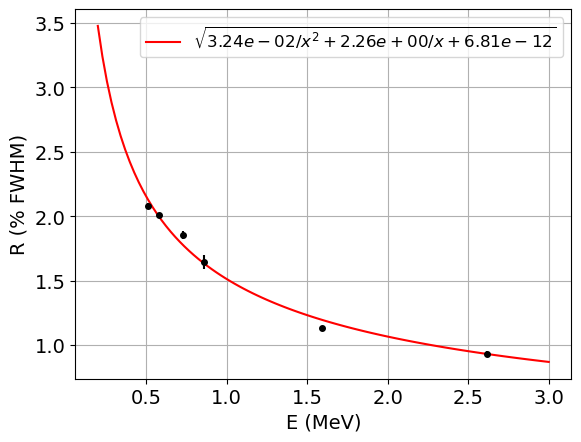

In [86]:
R_sq_par = reso_peak_fit(peaks[0], resol[0], resol[1], factor = 1, p0 = (1, 1, 1))

In [103]:
reso_func(qbb, *R_sq_par)

0.9610566214741424

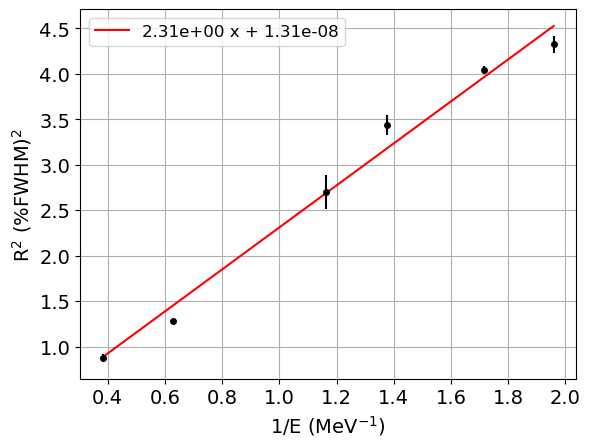

In [88]:
R_par = reso_peak_fit_lin(peaks[0], resol[0], resol[1])

In [104]:
np.sqrt(lineal(1 / qbb, *R_par))

0.969577202396798

In [106]:
E_1 = 2.4578 #2.615 #2.4578
extrapol, extrapol_s = extrapol_energy(np.array(resol[0]), np.array(peaks[0]), np.array(resol[1]), np.array(peaks[1]), E_1)

In [107]:
for ext, ext_s, name in zip(extrapol, extrapol_s, fit_names):
    print('Extrapolated E res {} to {}: {:.3f} ± {:.3f} %'.format(name, E_1, ext, ext_s))

Extrapolated E res 511 to 2.4578: 0.948 ± 0.011 %
Extrapolated E res 583 to 2.4578: 0.979 ± 0.005 %
Extrapolated E res 727 to 2.4578: 1.008 ± 0.016 %
Extrapolated E res 860 to 2.4578: 0.973 ± 0.034 %
Extrapolated E res 1592 to 2.4578: 0.911 ± 0.007 %
Extrapolated E res 2615 to 2.4578: 0.963 ± 0.024 %


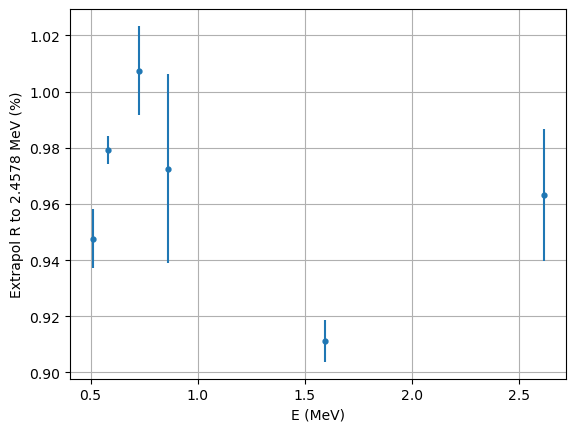

In [108]:
plt.errorbar(peaks[0], extrapol, yerr = extrapol_s, ls = 'none', marker = '.', markersize = 7)
plt.xlabel('E (MeV)')
plt.ylabel('Extrapol R to {} MeV (%)'.format(E_1))
plt.grid()

In [17]:
dep_range = fit_ranges[-2]
pp_range = fit_ranges[-1]

dep_nbins = fit_nbins[-2]
pp_nbins = fit_nbins[-1]

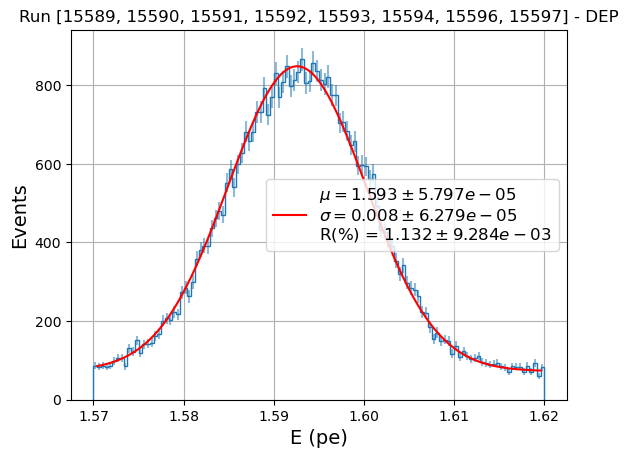

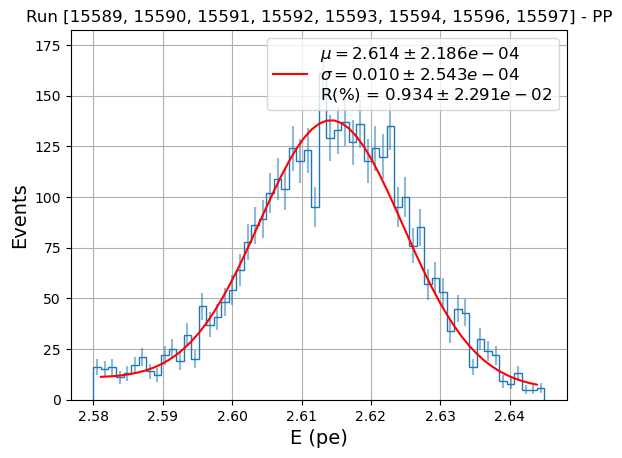

Energy resolution DEP: 1.132 ± 0.009 %
Energy resolution PP: 0.934 ± 0.023 %


In [110]:
_, r_dep = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, dep_range, dep_nbins, title = 'Run {} - '.format(run_numbers) + 'DEP', plot = True, ene_units='MeV')
plt.show()
_, r_pp  = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, pp_range, pp_nbins, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV')
plt.show()
print('Energy resolution DEP: {:.3f} ± {:.3f} %'.format(r_dep[0], r_dep[1]))
print('Energy resolution PP: {:.3f} ± {:.3f} %'.format(r_pp[0], r_pp[1]))

In [111]:
# Tried to modify the functions to be more paper-like plots
def fit_and_plot_peaks_resolution_paper(data_fit, data_plot, fun, nbins, plotrange, fitrange, initial_params, bounds, title, density = True, plot = False):
    y, x = np.histogram(data_fit, nbins, range = plotrange, density = density)

    total_counts = len(data_fit)
    bin_width = x[1] - x[0]

    if density:
        yerr = np.sqrt(y) / (bin_width * total_counts)
    else:
        yerr = np.sqrt(y)
    
    # Prevent zero errors
    yerr[yerr == 0] = np.min(yerr[yerr > 0]) if np.any(yerr > 0) else 1.0
    
    # from the xbins we select the range to plot, otherwise things don't match
    fit_mask = (x > fitrange[0]) & (x < fitrange[1])
    fit_x, fit_y, fit_yerr = x[fit_mask], y[fit_mask[:-1]], yerr[fit_mask[:-1]]
    params, cov = curve_fit(fun, fit_x, fit_y, p0=initial_params, sigma=fit_yerr, bounds = bounds, maxfev = 2000, absolute_sigma = True)
    err = np.sqrt(np.diag(cov))
    a, mu, sigma, m, c = params[0], params[1], params[2], params[3], params[4]
    yfit = fun(fit_x, a, mu, sigma, m, c)

    R = 2 * np.sqrt(2 * np.log(2)) * sigma * 100 / mu
    sR = R * np.sqrt((err[2] / sigma) **2 + (err[1]/mu)**2)

    if plot:
        legend_string = r'$\mu={:.3f} \pm {:.3e}$'.format(mu, err[1]) + '\n' + \
                        r'$\sigma={:.3f} \pm {:.3e}$'.format(sigma, err[2]) + '\n' + \
                        r'R(%) = ${:.3f} \pm {:.3e}$'.format(R, sR)
        plt.hist(data_plot, nbins, range = plotrange, histtype='stepfilled', edgecolor = 'k', color = 'grey', density = density)
        plt.errorbar(0.5 * (x[:-1] + x[1:]), y, yerr=yerr, fmt = ' ', c='darkgrey', alpha = 0.5, elinewidth=0.8)
        plt.plot(fit_x, yfit, 'r-', label = legend_string)
        plt.legend(fontsize = 12)
        plt.xlabel('E (MeV)', size = 14)
        if density:
            plt.ylabel('Probability density (1 / MeV)', size = 14)
        else:
            plt.ylabel('Events', size = 14)
        plt.xticks(size = 14)
        plt.yticks(size = 14)
        plt.title(title)
        plt.grid()
        # plt.show()
    return [params, err], [R, sR]

def fit_whole_peaks_paper(df, var, model, plotrange, fitrange, nbins, initial_params = None, bounds = ([0, 0, 0, -np.inf, -np.inf], [np.inf, np.inf, np.inf, np.inf, np.inf]), density = False, title = '', plot = False):
    data_fit  = df[in_range(df[var], fitrange)][var]
    data_plot = df[in_range(df[var], plotrange)][var]

    y, x = np.histogram(data_fit, nbins)
    if initial_params is None:
        A0 = max(y) - min(y)
        mu0 = x[np.argmax(y)]

        half_max = np.max(y) / 2
        indices = np.where(y > half_max)[0]
        fwhm = x[indices[-1]] - x[indices[0]]

        sig0 = fwhm / (2 * np.sqrt(2 * np.log(2)))  # FWHM = 2.355 * sigma
        m0 = np.min(y)

        initial_params = [A0, mu0, sig0, m0, 1]

    par, res = fit_and_plot_peaks_resolution_paper(data_fit,
                                             data_plot, 
                                            model,
                                            nbins, 
                                            plotrange, 
                                            fitrange, 
                                            initial_params, 
                                            bounds, 
                                            title, 
                                            density=density, 
                                            plot = plot)
    return par, res

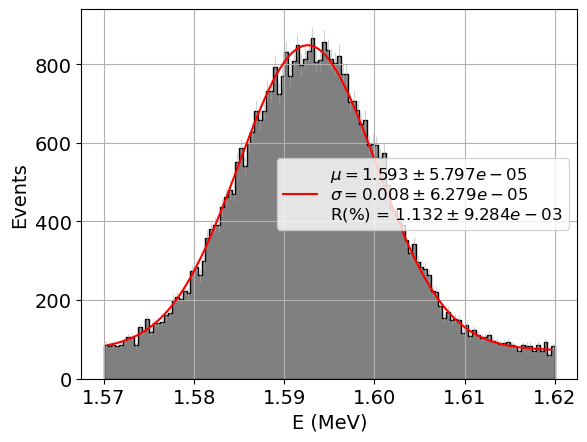

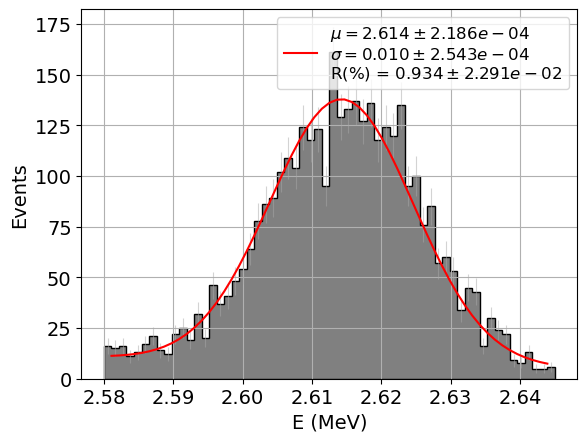

In [112]:
_, r_dep = fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, dep_range, dep_range, dep_nbins, plot = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/dep.pdf', dpi=600, bbox_inches='tight', transparent = True) 
plt.show()
_, r_pp  = fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, pp_range, pp_range, pp_nbins, plot = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/pp.pdf', dpi=600, bbox_inches='tight', transparent = True) 


## Energy dependencies

In [18]:
from invisible_cities.core.fit_functions import expo
from invisible_cities.core.fit_functions import profileX
from scipy.optimize                      import curve_fit

def quad(x, a, b, c):
    return a*x**2 + b*x + c

def fit_profile(df, xvar, yvar, fitfun, initial_values=None, fitbins=20, fitrange=(None, None), band_width=None):
    """
    Two-step fitting:
      1. Fit all data binned (used only to define band).
      2. If band_width is given, select points within band around first fit
         and redo the fit. This second fit is the final result.
    Returns final fit parameters, errors, and (x, y, sy).
    """
    # First binning
    x, y, sy = profileX(df[xvar], df[yvar], std=True, nbins=fitbins, xrange=fitrange[0], yrange=fitrange[1])

    # First fit (estimator)
    par_est, _ = curve_fit(fitfun, x, y, sigma=sy, p0=initial_values)

    if band_width is not None:
        # Compute band from first fit
        y_pred = fitfun(df[xvar], *par_est)
        mask = (df[yvar] >= y_pred - band_width) & (df[yvar] <= y_pred + band_width)
        df_band = df[mask]

        # Redo profile with band-limited data
        x, y, sy = profileX(df_band[xvar], df_band[yvar], std=True, nbins=fitbins, xrange=fitrange[0], yrange=fitrange[1])

        # Final fit (this one is returned)
        par, cov = curve_fit(fitfun, x, y, sigma=sy, p0=par_est)
    else:
        # If no band is defined, just return the first fit
        par, cov = curve_fit(fitfun, x, y, sigma=sy, p0=initial_values)

    err = np.sqrt(np.diag(cov))
    return par, err, (x, y, sy)


def plot_profile(df, xvar, yvar, fitfun=None, initial_values=None, std=False, 
                 fitbins=20, plotbins=(50, 50), fitrange=(None, None), plotrange=(None, None), 
                 axlabel=['', ''], units=['mm', 'MeV'], title='', cmap='viridis', 
                 save=False, band_width=None):
    """
    Plot histogram, profile, and final fit results.
    """

    par, err, (x, y, sy) = (None, None, (None, None, None))
    if fitfun:
        par, err, (x, y, sy) = fit_profile(
            df, xvar, yvar, fitfun, 
            initial_values=initial_values, 
            fitbins=fitbins, fitrange=fitrange, 
            band_width=band_width
        )

        # Labels for parameters
        # label_lines = [
        #     f'$x_{{{i}}}$ = {p:.2e} ' + r'$\mathrm{' + units[1] + r'}/\mathrm{' + units[0] + r'}^{{' + f'{i}' + '}}$' 
        #     for i, p in enumerate(par[::-1])
        # ]
        label_lines = [f'$x_{0}$ = {par[1]:.2e} ' + units[1], f'$x_{1}$ = {par[0]:.2e} ' + units[1]  + '/' + units[0] ]

        label = "\n".join(label_lines)
        
        # Final fit curve
        x_fit = np.linspace(df[xvar].min(), df[xvar].max(), 500)
        plt.plot(x_fit, fitfun(x_fit, *par), 'r-', label=label)

        # Draw band lines around final fit
        if band_width:
            y_fit = fitfun(x_fit, *par)
            plt.plot(x_fit, y_fit + band_width, 'r--', alpha=0.7)
            plt.plot(x_fit, y_fit - band_width, 'r--', alpha=0.7)

    # Profile with error bars
    if x is not None:
        plt.errorbar(x, y, yerr=sy, fmt='r.')

    # 2D histogram (all data shown)
    plt.hist2d(df[xvar], df[yvar], bins=plotbins, range=plotrange, cmap=cmap, vmin=1e-3)

    # Formatting
    plt.xlabel(axlabel[0] + f' ({units[0]})', size=14)
    plt.ylabel(axlabel[1] + f' ({units[1]})', size=14)
    plt.xticks(size=14)
    plt.yticks(size=14)
    plt.legend(loc='upper left', fontsize=14)
    plt.title(title)

    if not save:
        plt.show()

    return par, err
    
def plot_hist2d(df, xvar, yvar, plotbins = (50, 50), plotrange = (None, None), axlabel = ['', ''], units = ['mm', 'MeV'], title = '', cmap = 'viridis'):
    plt.hist2d(df[xvar], df[yvar], bins = plotbins, range = plotrange, cmap = cmap, vmin = 1e-3)
    plt.xlabel(axlabel[0] + ' ({})'.format(units[0]), size = 14)
    plt.ylabel(axlabel[1] + ' ({})'.format(units[1]), size = 14)
    plt.title(title)
    plt.xticks(size = 14)
    plt.yticks(size = 14)
    plt.show()

Lets look mainly to the dependencies in Z, and how they change with energy

In [114]:
# for rng, name, dzrng in zip(fit_ranges[-2:], fit_names[-2:], dz_range):
#     df = reco_summ[in_range(reco_summ[ene_var_corr], rng)]
#     plot_profile(df, 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=15, plotbins=(15, 20), fitrange=(dzrng, None), plotrange=(dzrng, None), axlabel = ['dZ', 'E'], title='Runs {} - {}'.format(run_numbers, name), cmap=cmap)
#     plot_profile(df, 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=20, plotbins=(20, 20), fitrange=((200, 1000), None), plotrange=((200, 1000), None), axlabel = ['Z_bary', 'E'], title='Runs {} - {}'.format(run_numbers, name), cmap=cmap)
#     dzbins = np.linspace(dzrng[0], dzrng[1], 5)
#     print('***************************************')
#     for i, val in enumerate(dzbins[:-1]):
#         plot_profile(df[in_range(df['dZ'], (dzbins[i], dzbins[i+1]))], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=20, plotbins=(20, 20), fitrange=((200, 1000), None), plotrange=((200, 1000), None), axlabel = ['Z_bary', 'E'], title='Runs {} - {} - {}'.format(run_numbers, name, (dzbins[i], dzbins[i+1])), cmap=cmap)
#         plt.show()
#     print('***************************************')


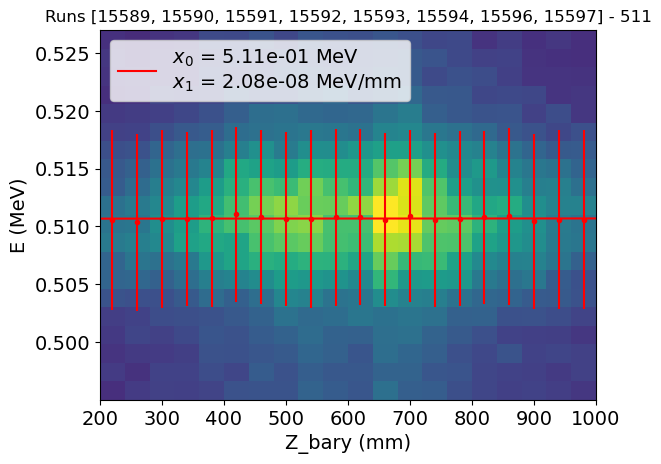

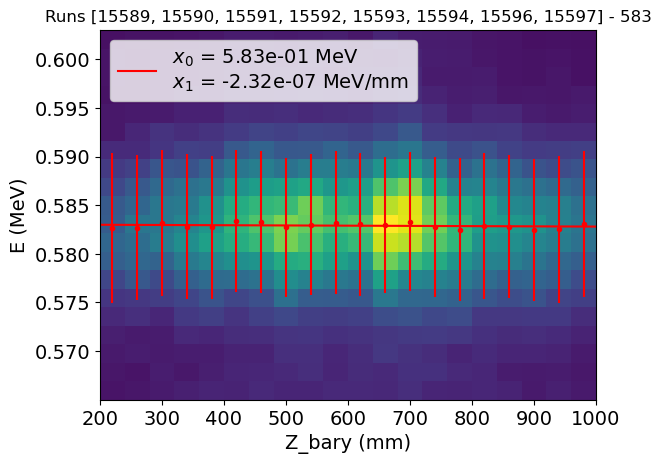

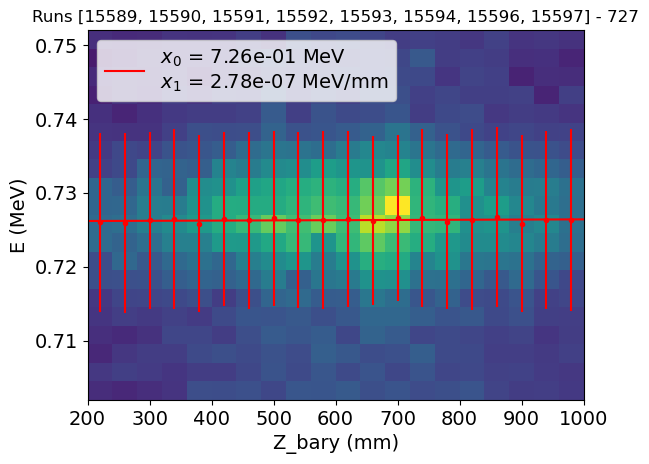

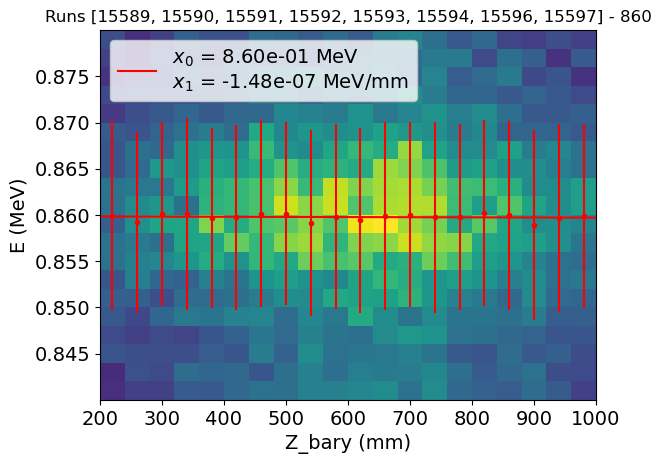

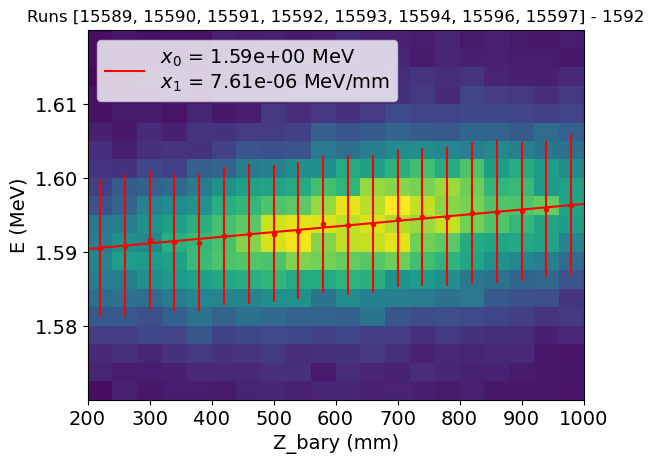

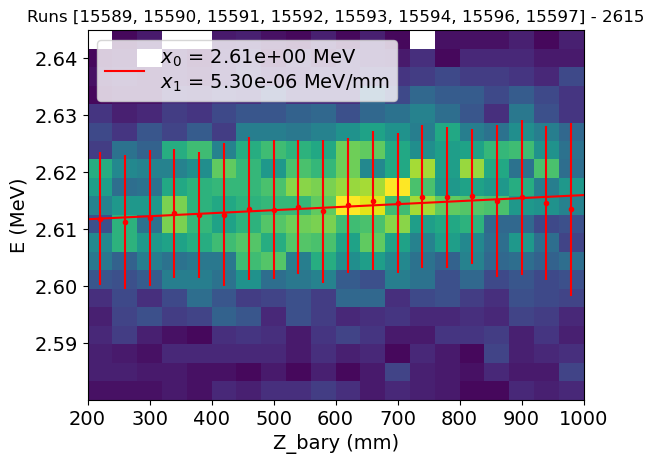

In [115]:
Zcorr, Zcorr_err = [], []
for rng, name in zip(fit_ranges, fit_names):
    par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], rng)], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=20, plotbins=(20, 20), fitrange=((200, 1000), None), plotrange=((200, 1000), None), axlabel = ['Z_bary', 'E'], title='Runs {} - {}'.format(run_numbers, name), cmap=cmap)
    plt.show()
    Zcorr.append(par_Z)
    Zcorr_err.append(err_Z)

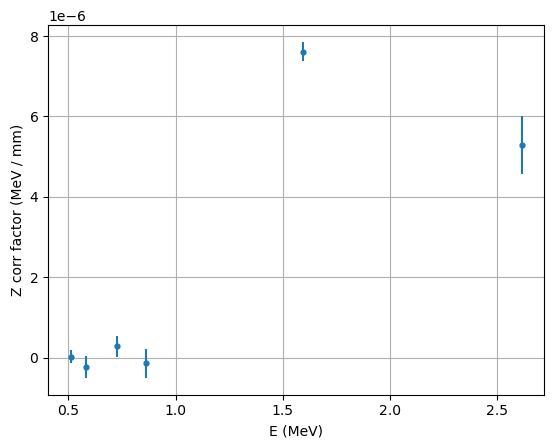

In [116]:
plt.errorbar(np.array(peaks[0]), np.array(Zcorr)[:, 0], yerr = np.array(Zcorr_err)[:, 0], ls = 'none', marker = '.', markersize = 7)
plt.xlabel('E (MeV)')
plt.ylabel('Z corr factor (MeV / mm)')
plt.grid()

In [117]:
reco_summ = reco_summ.merge(dst_summ[['event', 'run_n', 'S1e', 'S2e']], on = ['event', 'run_n'])

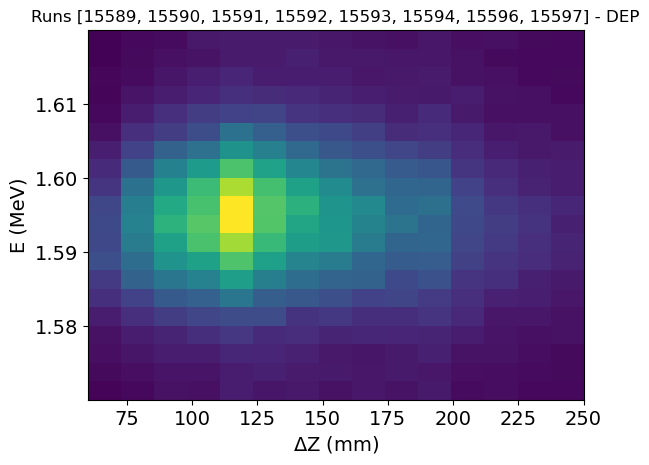

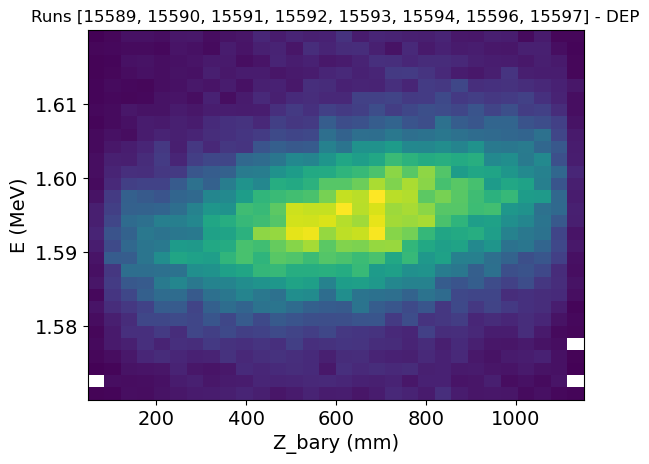

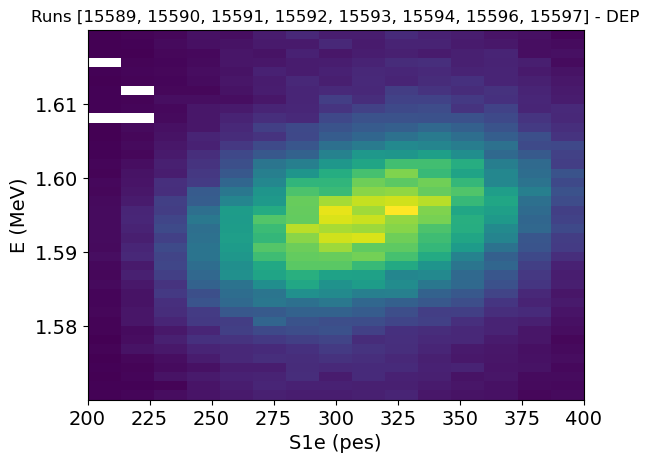

In [118]:
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], dep_range)], 'dZ', 'E_shifted', plotbins=(15, 20), plotrange=((60, 250), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], dep_range)], 'Z_bary', 'E_shifted', plotbins=(30, 30), plotrange=(None, None), axlabel = ['Z_bary', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], dep_range)], 'S1e', 'E_shifted', plotbins=(15, 40), plotrange=((200, 400), None), axlabel = ['S1e', 'E'], units = ['pes', 'MeV'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)

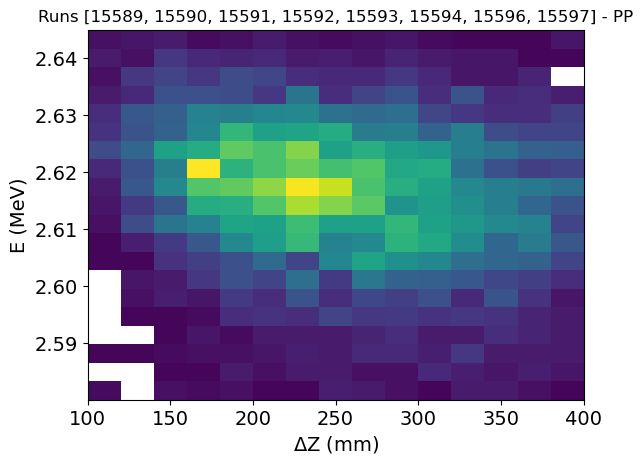

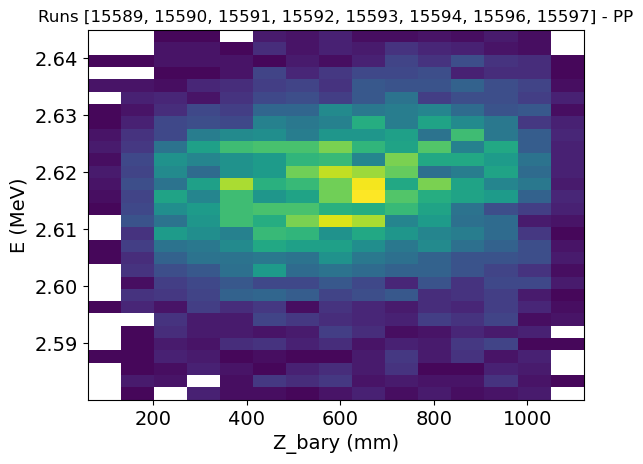

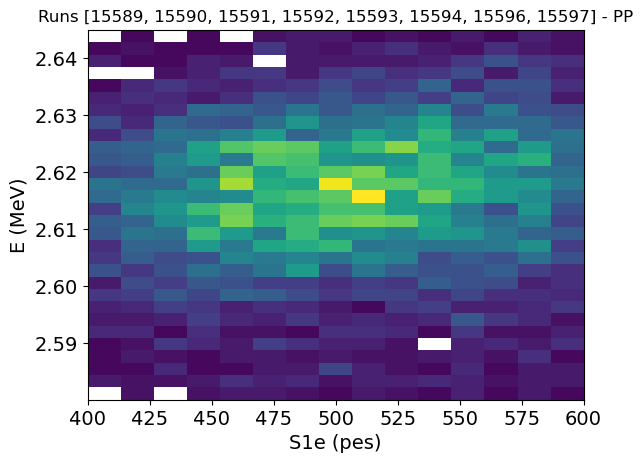

In [119]:
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], pp_range)], 'dZ', 'E_shifted', plotbins=(15, 20), plotrange=((100, 400), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], pp_range)], 'Z_bary', 'E_shifted', plotbins=(15, 30), plotrange=(None, None), axlabel = [r'Z_bary', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
plot_hist2d(reco_summ[in_range(reco_summ['E_shifted'], pp_range)], 'S1e', 'E_shifted', plotbins=(15, 30), plotrange=((400, 600), None), axlabel = [r'S1e', 'E'], units = ['pes', 'MeV'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)

We see that:
* **$\Delta$ Z** was solved for DEP after the dropping out hits energy correction, but not for PP
* **Z_bary** is still an issue for now
* **S1e** gets mainly solved after correcting **Z_bary**, so we will not correct by it


## Energy dependencies correction

Following [JHEP 2019:230 (2019)](https://arxiv.org/abs/1905.13110), we will do a profile on the desired variable, and perform a linear fit:

$$E = x_0 + x * x_1$$

To correct the energy, we do:

$$E_{corr} = \frac{E_0}{1 + \frac{x_1}{x_0} * x}$$

### $\Delta$ Z

As I said before, I will correct just the PP by $\Delta$ Z

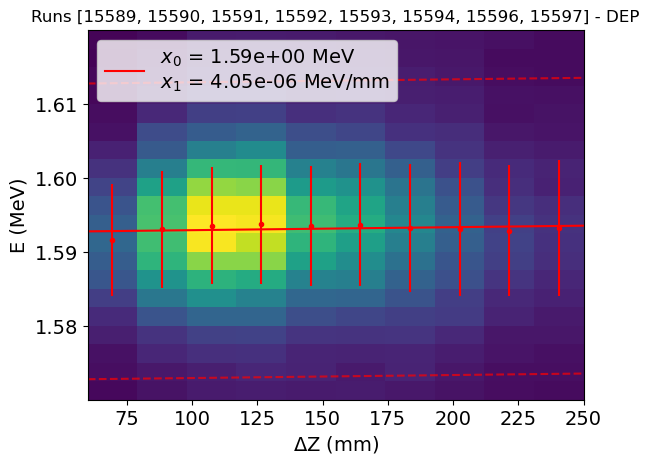

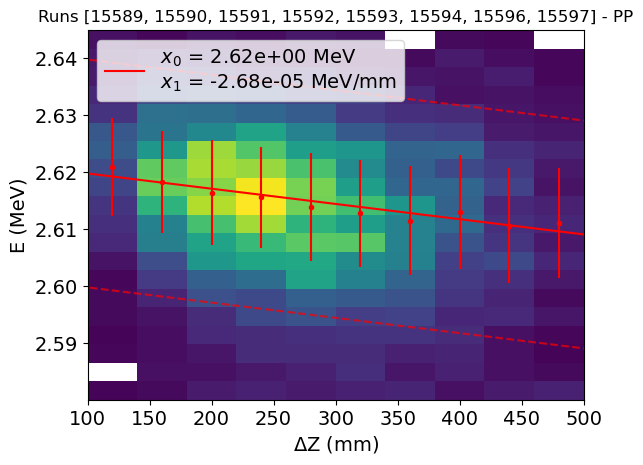

In [120]:
par_DEP_dZ = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], dep_range)], 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=((60, 250), None), plotrange=((60, 250), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
par_PP_dZ = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], pp_range)], 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=((100, 500), None), plotrange=((100, 500), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap, band_width = 0.02)

In [121]:
dep_range = fit_ranges[-2]
pp_range = fit_ranges[-1]

dep_nbins = fit_nbins[-2]
pp_nbins = fit_nbins[-1]

(array([-2.97455029e-05,  2.62278296e+00]),
 array([3.14307671e-06, 9.85173139e-04]))

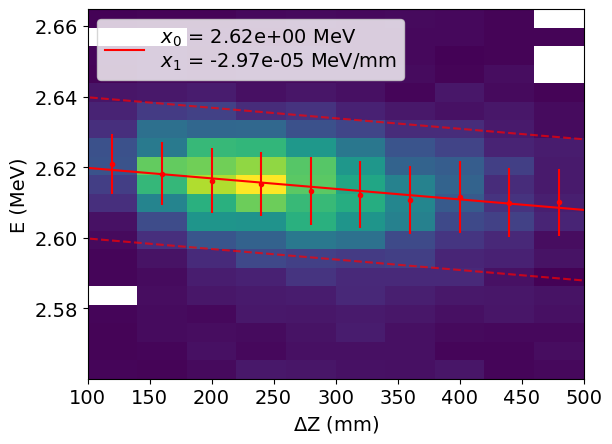

In [123]:
plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], pp_range)], 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=((100, 500), None), plotrange=((100, 500), None), axlabel = [r'$\Delta$Z', 'E'], cmap=cmap, band_width = 0.02, save = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/PP_dz_effect.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [124]:
dp_correct = reco_summ[in_range(reco_summ[ene_var_corr], dep_range)].copy()
pp_correct = reco_summ[in_range(reco_summ[ene_var_corr], pp_range)].copy()

# NO CORRECT IN DZ FOR DEP
dp_correct['E_dZ'] =  dp_correct[ene_var_corr] #/ (1 + (par_DEP_dZ[0][0] / par_DEP_dZ[0][1]) * dp_correct.dZ)
pp_correct['E_dZ'] =  pp_correct[ene_var_corr] / (1 + (par_PP_dZ[0][0] / par_PP_dZ[0][1]) * pp_correct.dZ)

Let's check how the other dependencies would have changed (just for PP)

The corrected variable:


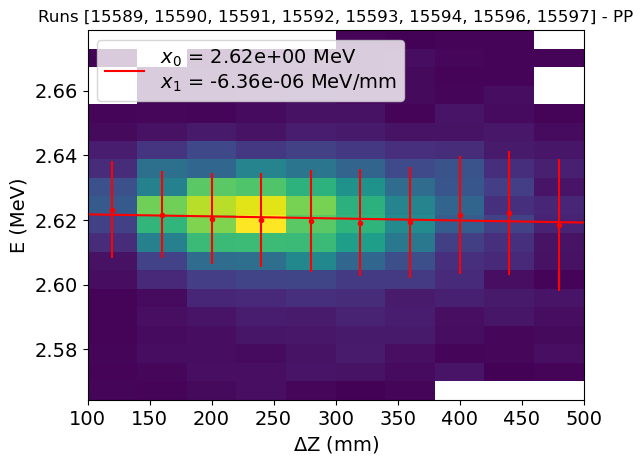

The other variables:


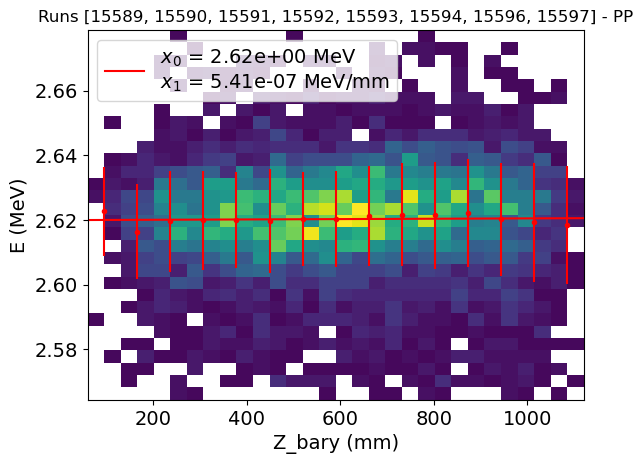

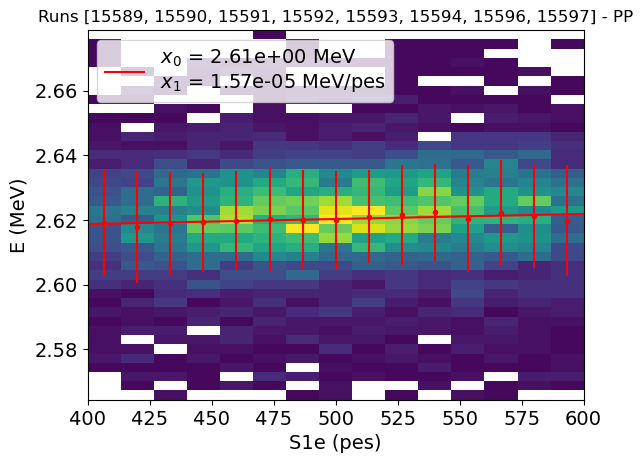

(array([1.56645168e-05, 2.61244513e+00]),
 array([3.95086209e-06, 1.98663398e-03]))

In [125]:
print('The corrected variable:')
plot_profile(pp_correct, 'dZ', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=((100, 500), None), plotrange=((100, 500), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
print('The other variables:')
plot_profile(pp_correct, 'Z_bary', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=15, plotbins=(30, 30), fitrange=(None, None), plotrange=(None, None), axlabel = [r'Z_bary', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
plot_profile(pp_correct, 'S1e', 'E_dZ', fitfun=lineal, initial_values=(1.67, 0), std = True, fitbins=15, plotbins=(15, 40), fitrange=((400, 600), None), plotrange=((400, 600), None), axlabel = [r'S1e', 'E'], units = ['pes', 'MeV'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)

And now the resulting resolution:

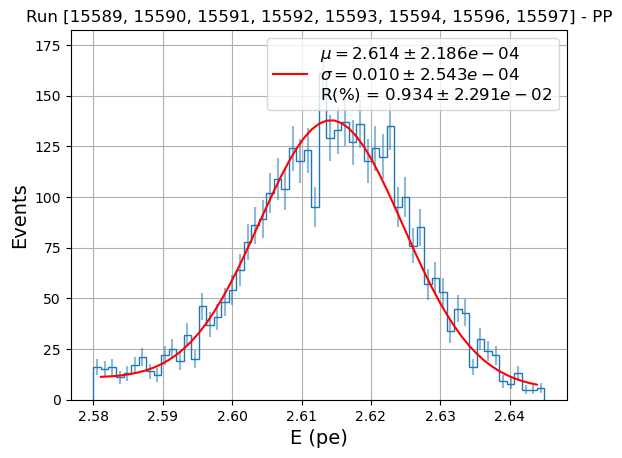

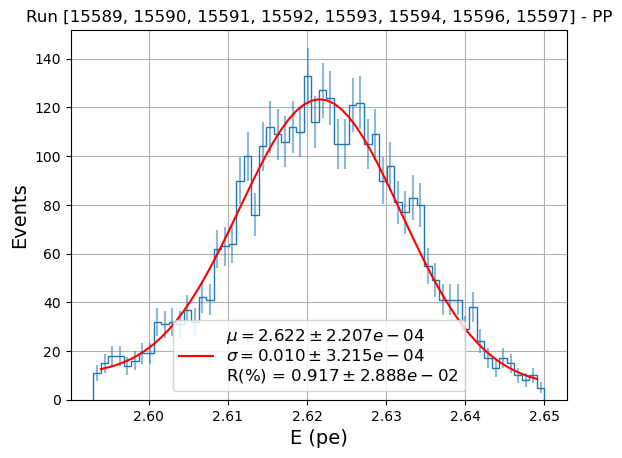

Energy resolution PP: 0.934 ± 0.023 %
Energy resolution PP (dZ corr): 0.917 ± 0.029 %


In [126]:
_, r_pp = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, fit_ranges[-1], 60, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV')
plt.show()
_, r_pp_dZ = fit_whole_peaks(pp_correct[pp_correct.Rmax < 400], 'E_dZ', peak_fit, (2.593, 2.65), 60, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV') #(2.59, 2.65) for no band in profile
plt.show()


print('Energy resolution PP: {:.3f} ± {:.3f} %'.format(r_pp[0], r_pp[1]))
print('Energy resolution PP (dZ corr): {:.3f} ± {:.3f} %'.format(r_pp_dZ[0], r_pp_dZ[1]))

Not significant improve

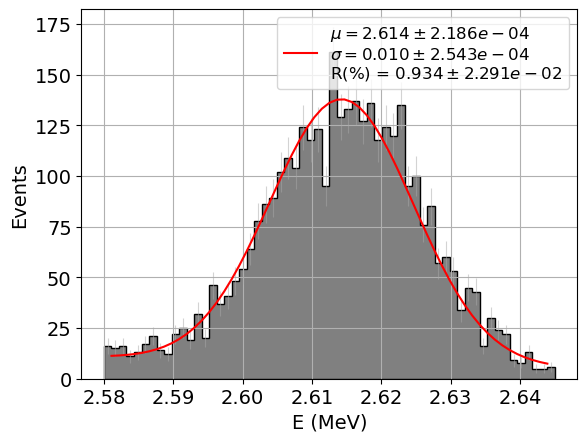

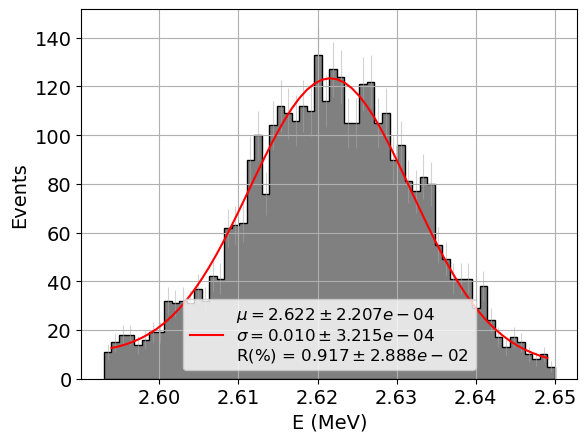

In [127]:
_, r_pp  = fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, fit_ranges[-1], fit_ranges[-1], pp_nbins, plot = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/pp.pdf', dpi=600, bbox_inches='tight', transparent = True) 
plt.show()
_, r_pp  = fit_whole_peaks_paper(pp_correct[pp_correct.Rmax < 400], 'E_dZ', peak_fit, (2.593, 2.65), (2.593, 2.65), 60, plot = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/pp.pdf', dpi=600, bbox_inches='tight', transparent = True) 


### Z_bary

Now we correct in the Z barycenter for both peaks

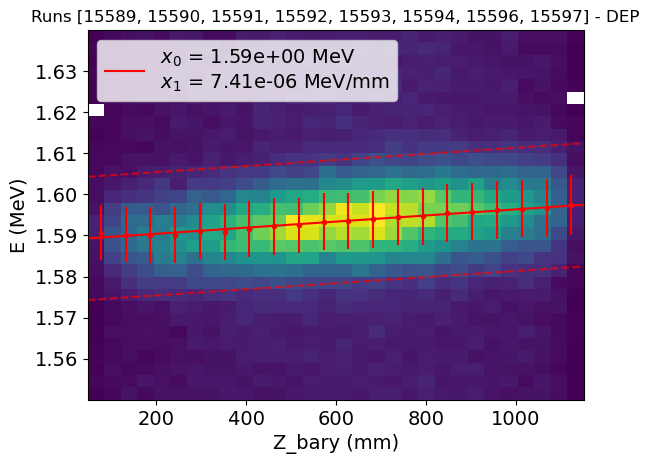

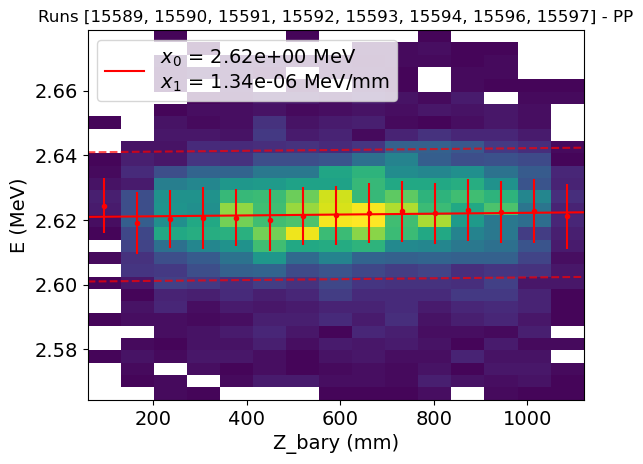

In [128]:
par_DEP_Z = plot_profile(dp_correct, 'Z_bary', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=20, plotbins=(30, 30), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z_bary', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width=0.015)
par_PP_Z = plot_profile(pp_correct, 'Z_bary', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=15, plotbins=(15, 30), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z_bary', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap, band_width = 0.02)


(array([7.41177233e-06, 1.58893057e+00]),
 array([2.89901980e-07, 1.94051114e-04]))

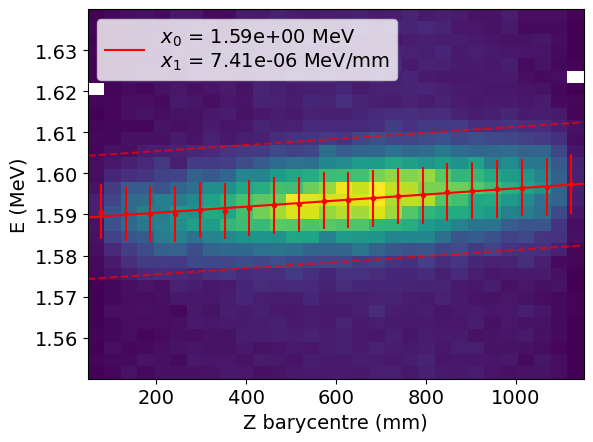

In [89]:
plot_profile(dp_correct, 'Z_bary', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=20, plotbins=(30, 30), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z barycentre', 'E'], cmap=cmap, band_width=0.015, save = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/DEP_z_effect.pdf', dpi=600, bbox_inches='tight', transparent = True) 

(array([1.33812778e-06, 2.62085582e+00]),
 array([1.19411232e-06, 7.73313551e-04]))

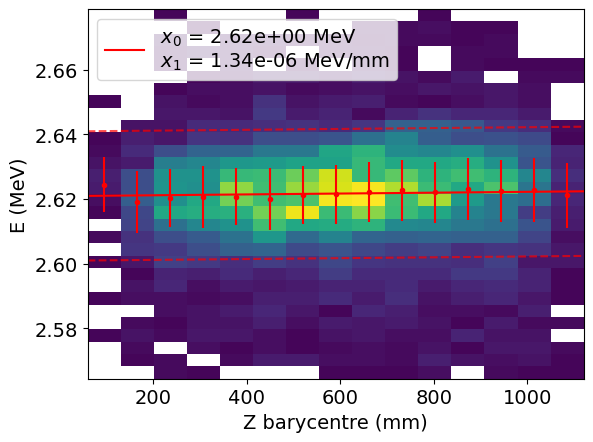

In [90]:
plot_profile(pp_correct, 'Z_bary', 'E_dZ', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=15, plotbins=(15, 30), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z barycentre', 'E'], cmap=cmap, band_width = 0.02, save = True)
# plt.savefig('/home/usc/ie/mpm/HE_plots/PP_z_effect.pdf', dpi=600, bbox_inches='tight', transparent = True) 

In [129]:
dp_correct['E_Z'] =  dp_correct['E_dZ'] / (1 + (par_DEP_Z[0][0] / par_DEP_Z[0][1]) * dp_correct.Z_bary)
pp_correct['E_Z'] =  pp_correct['E_dZ'] / (1 + (par_PP_Z[0][0] / par_PP_Z[0][1]) * pp_correct.Z_bary)

Now check other dependencies:

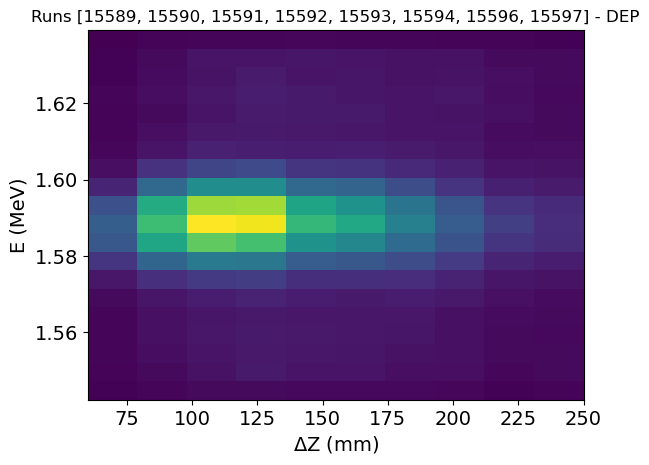

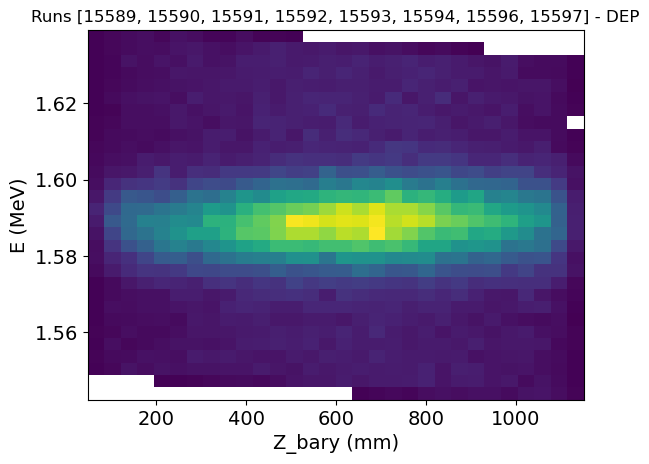

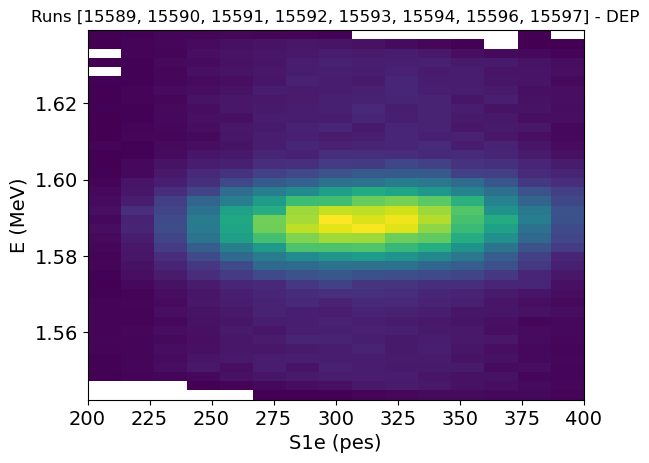

In [130]:
plot_hist2d(dp_correct, 'dZ', 'E_Z', plotbins=(10, 20), plotrange=((60, 250), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)
plot_hist2d(dp_correct, 'Z_bary', 'E_Z', plotbins=(30, 30), plotrange=(None, None), axlabel = [r'Z_bary', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)
plot_hist2d(dp_correct, 'S1e', 'E_Z', plotbins=(15, 40), plotrange=((200, 400), None), axlabel = ['S1e', 'E'], units = ['pes', 'MeV'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap)


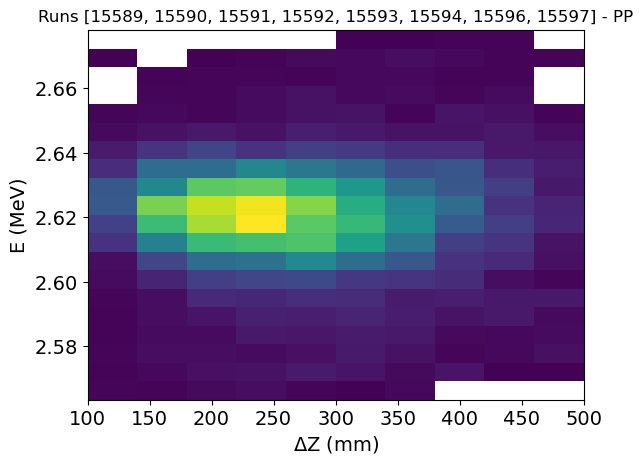

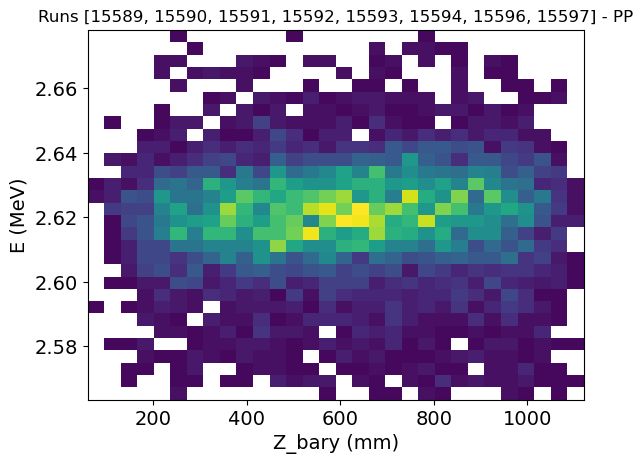

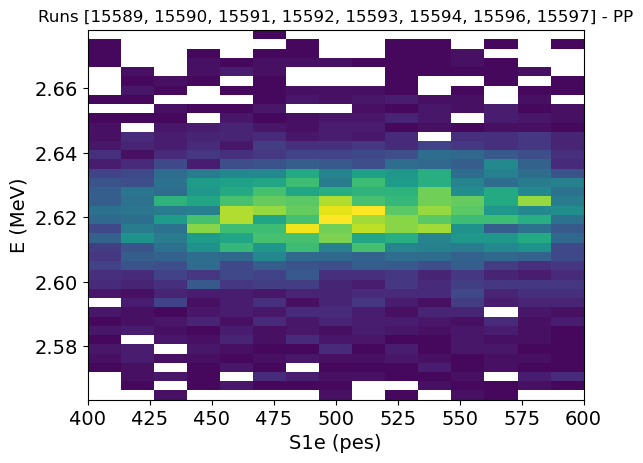

In [131]:
plot_hist2d(pp_correct, 'dZ', 'E_Z', plotbins=(10, 20), plotrange=((100, 500), None), axlabel = [r'$\Delta$Z', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
plot_hist2d(pp_correct, 'Z_bary', 'E_Z', plotbins=(30, 30), plotrange=(None, None), axlabel = [r'Z_bary', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)
plot_hist2d(pp_correct, 'S1e', 'E_Z', plotbins=(15, 40), plotrange=((400, 600), None), axlabel = [r'S1e', 'E'], units = ['pes', 'MeV'], title='Runs {} - PP'.format(run_numbers), cmap=cmap)


Most of them are gone now!

And how the resolution has improved for both:

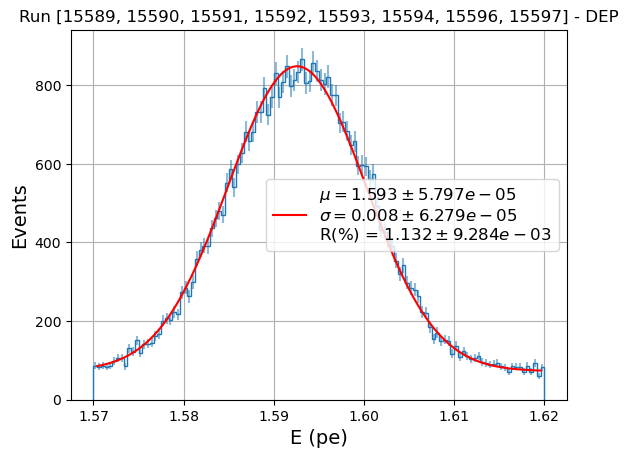

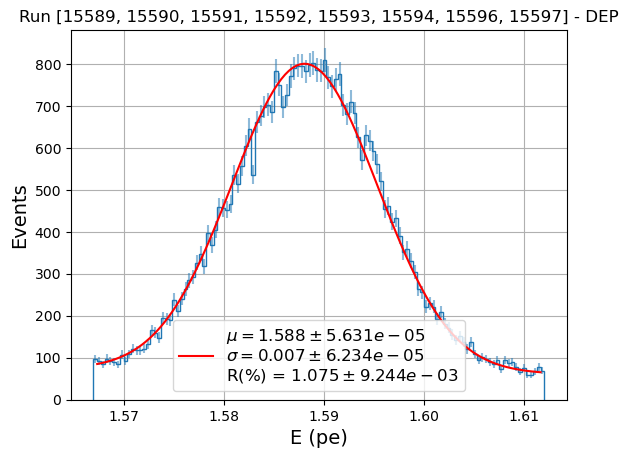

Energy resolution DEP: 1.132 ± 0.009 %
Energy resolution DEP (Z corr): 1.075 ± 0.009 %


In [132]:
_, r_dep = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, fit_ranges[-2], 120, title = 'Run {} - '.format(run_numbers) + 'DEP', plot = True, ene_units='MeV')
plt.show()
_, r_dep_Z = fit_whole_peaks(dp_correct[dp_correct.Rmax < 400], 'E_Z', peak_fit, (1.567, 1.612), 120, title = 'Run {} - '.format(run_numbers) + 'DEP', plot = True, ene_units='MeV') # (1.567, 1.612) no band
plt.show()

print('Energy resolution DEP: {:.3f} ± {:.3f} %'.format(r_dep[0], r_dep[1]))
print('Energy resolution DEP (Z corr): {:.3f} ± {:.3f} %'.format(r_dep_Z[0], r_dep_Z[1]))

In [133]:
dep_nbins

120

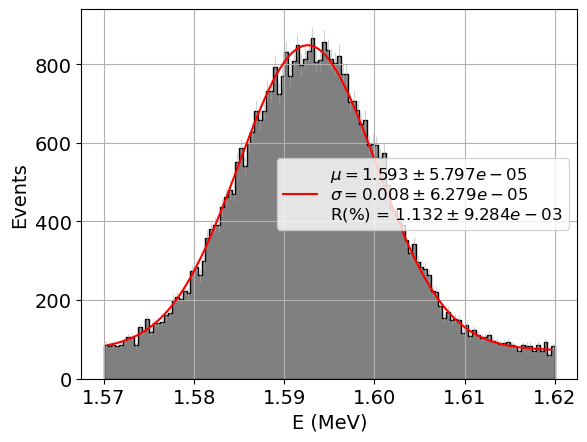

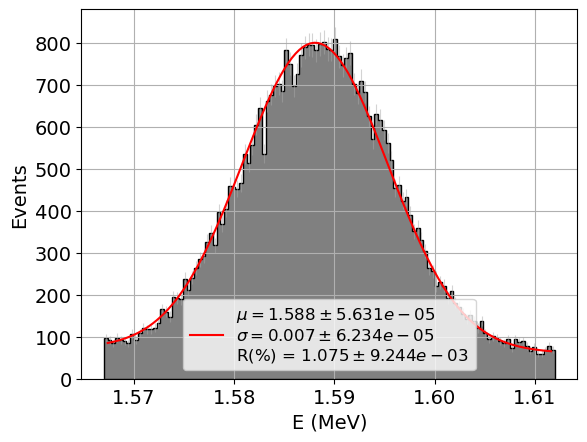

In [135]:
_, r_dep  = fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, fit_ranges[-2], fit_ranges[-2], dep_nbins, plot = True)
plt.show()
_, r_dep_Z  = fit_whole_peaks_paper(dp_correct[dp_correct.Rmax < 400], 'E_Z', peak_fit,  (1.567, 1.612),  (1.567, 1.612), dep_nbins, plot = True)


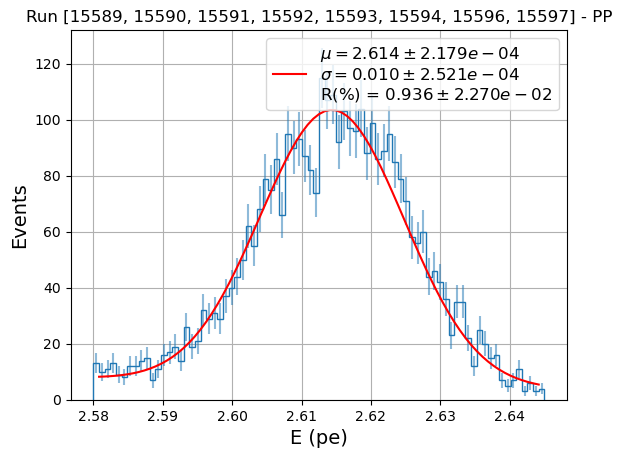

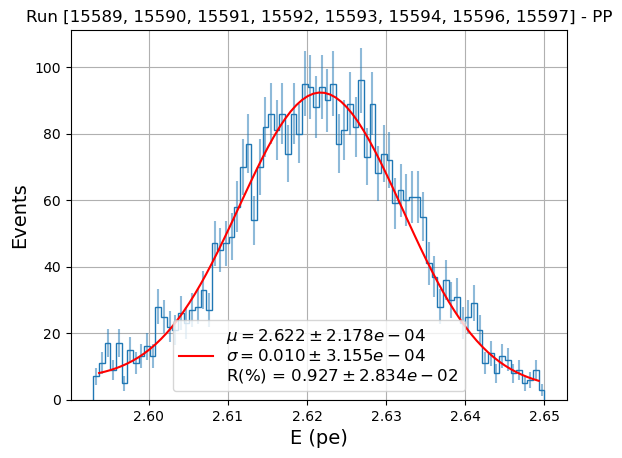

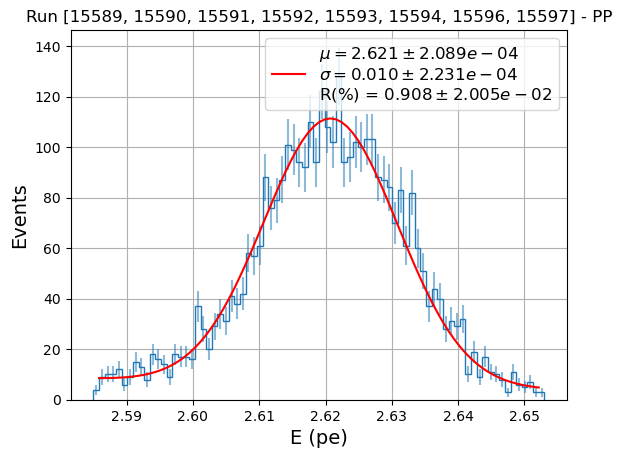

Energy resolution PP: 0.936 ± 0.023 %
Energy resolution PP (dZ corr): 0.927 ± 0.028 %
Energy resolution PP (dZ + Z corr): 0.908 ± 0.020 %


In [98]:
_, r_pp = fit_whole_peaks(reco_summ[reco_summ.Rmax < 400], ene_var_corr, peak_fit, fit_ranges[-1], 80, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV')
plt.show()
_, r_pp_dZ = fit_whole_peaks(pp_correct[pp_correct.Rmax < 400], 'E_dZ', peak_fit, (2.593, 2.65), 80, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV') #(2.59, 2.65) no band
plt.show()
_, r_pp_Z = fit_whole_peaks(pp_correct[pp_correct.Rmax < 400], 'E_Z', peak_fit, (2.585, 2.653), 80, title = 'Run {} - '.format(run_numbers) + 'PP', plot = True, ene_units='MeV') #(2.59, 2.65) no band
plt.show()


print('Energy resolution PP: {:.3f} ± {:.3f} %'.format(r_pp[0], r_pp[1]))
print('Energy resolution PP (dZ corr): {:.3f} ± {:.3f} %'.format(r_pp_dZ[0], r_pp_dZ[1]))
print('Energy resolution PP (dZ + Z corr): {:.3f} ± {:.3f} %'.format(r_pp_Z[0], r_pp_Z[1]))

We only seem to improve in DEP, in PP the improvement is not statistically significant. Is it worth the correction??? Talk to JA and Gonzalo...

## New proposal for correction given that:

* DEP only depends on Z bary
* PP depends on both DeltaZ and Z bary
* Corrections on DEP improve the resolution
* Corrections on PP improve but not statistically significantly

So: we are going to correct only by Z bary and GLOBALLY

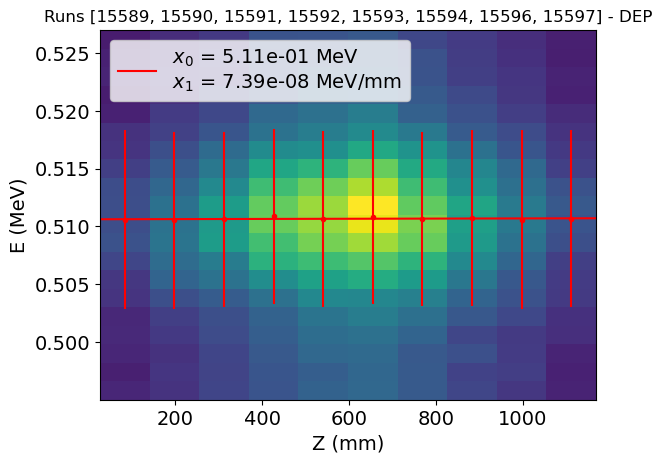

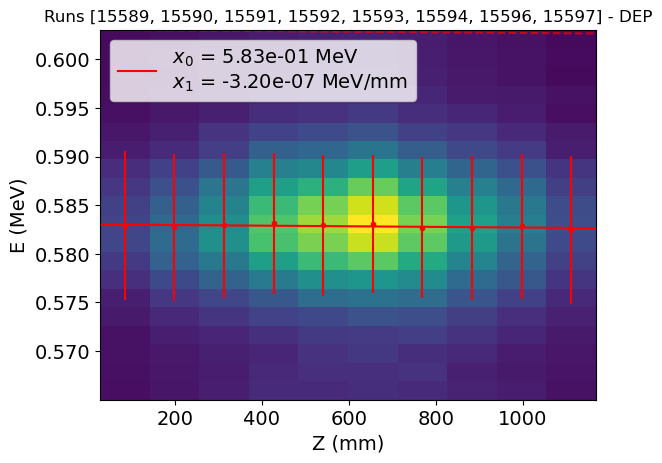

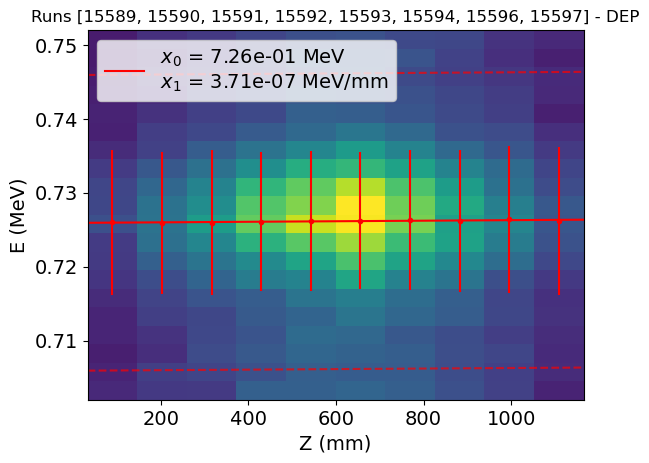

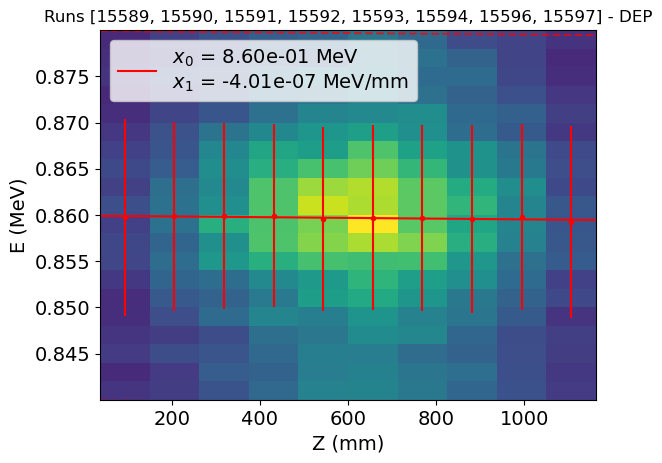

In [150]:
par_e1_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], fit_ranges[0])], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
par_e2_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], fit_ranges[1])], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
par_e3_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], fit_ranges[2])], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
par_e4_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], fit_ranges[3])], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)


In [156]:
par_e1_Z[0][0] / par_e1_Z[0][1], par_e2_Z[0][0] / par_e2_Z[0][1], par_e3_Z[0][0] / par_e3_Z[0][1], par_e4_Z[0][0] / par_e4_Z[0][1]

(1.4469585530590845e-07,
 -5.48932009207603e-07,
 5.111892165710246e-07,
 -4.6620842238601683e-07)

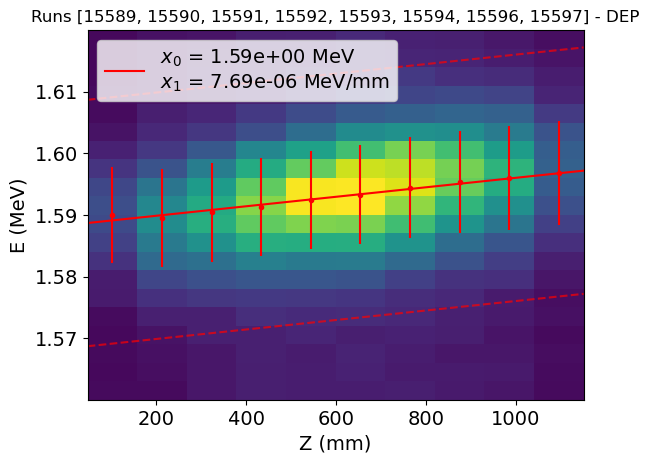

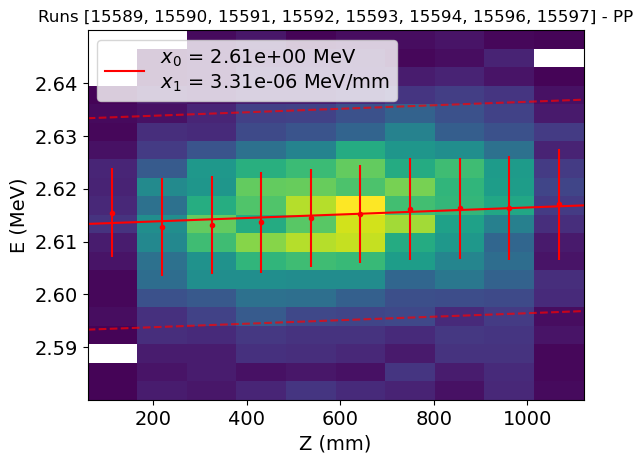

In [148]:
par_DEP_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], (1.56, 1.62))], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
par_PP_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], (2.58, 2.65))], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='Runs {} - PP'.format(run_numbers), cmap=cmap, band_width = 0.02)

In [177]:
factor = ((par_DEP_Z[0][0] / par_DEP_Z[0][1]) + (par_PP_Z[0][0] / par_PP_Z[0][1])) / 2

In [180]:
reco_summ['E_Z_corr'] =  reco_summ[ene_var_corr] / (1 + factor * reco_summ.Z_bary)


In [178]:
par_DEP_Z[0][0] / par_DEP_Z[0][1]

4.842083127221066e-06

In [179]:
factor

3.054965648802343e-06

In [201]:
fit_ranges_Z = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.84, 0.88), (1.56, 1.62), (2.575, 2.64)]

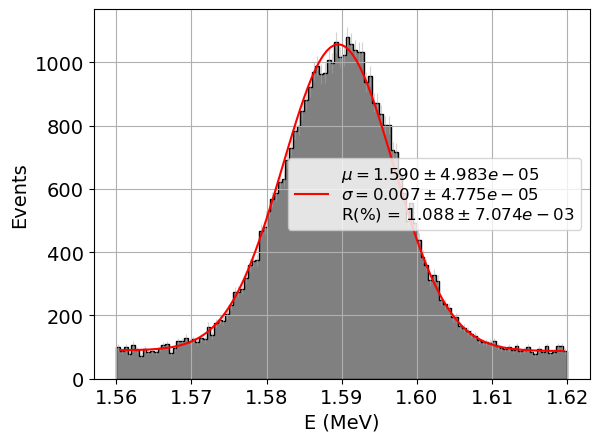

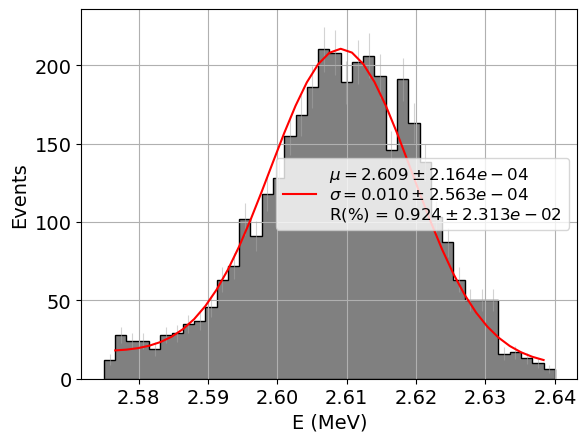

In [202]:

fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], 'E_Z_corr', peak_fit, fit_ranges_Z[-2], fit_ranges_Z[-2], dep_nbins, plot = True)
plt.show()


fit_whole_peaks_paper(reco_summ[reco_summ.Rmax < 400], 'E_Z_corr', peak_fit, fit_ranges_Z[-1], fit_ranges_Z[-1], 40, plot = True)
plt.show()

Text(0, 0.5, 'Counts')

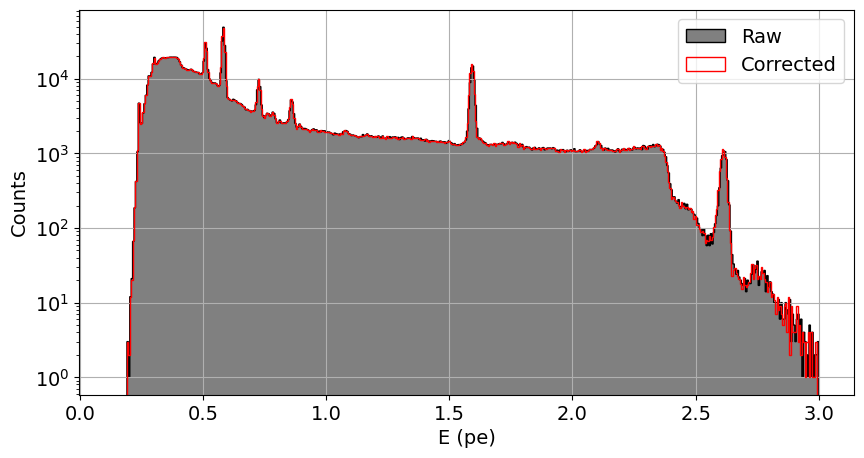

In [205]:
plt.figure(figsize=(10, 5))
plt.hist(reco_summ.E_final, 500, (0.14, 3), histtype='stepfilled', color = 'grey', edgecolor = 'k', label='Raw')
plt.hist(reco_summ.E_Z_corr, 500, (0.14, 3), histtype='step', color = 'grey', edgecolor = 'r', label='Corrected')

plt.grid()
plt.yscale('log')
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.legend(fontsize=14)
plt.xlabel('E (pe)', size = 14)
plt.ylabel('Counts', size = 14)

### Check the dependencies run by run, peak by peak

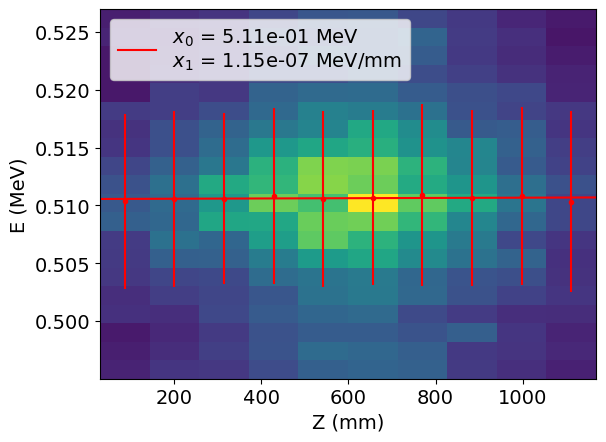

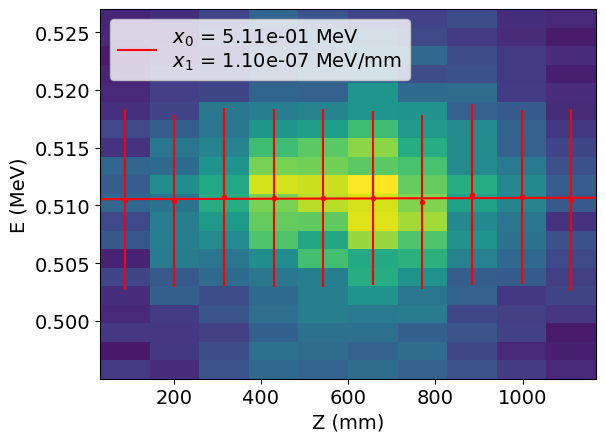

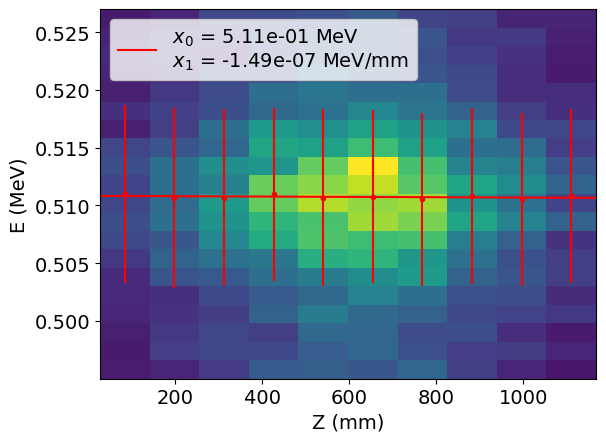

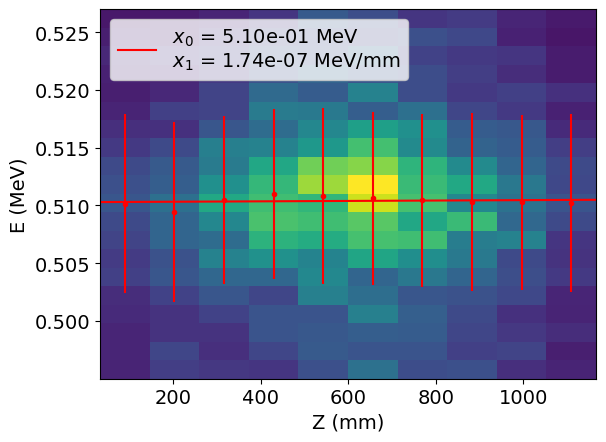

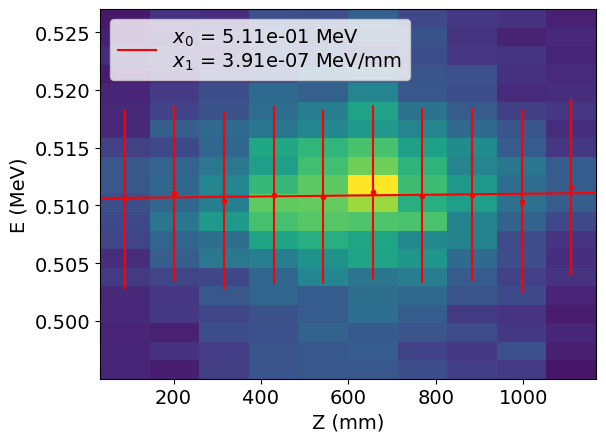

...

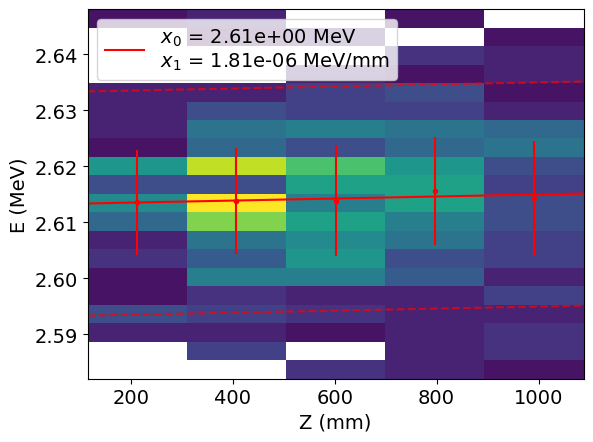

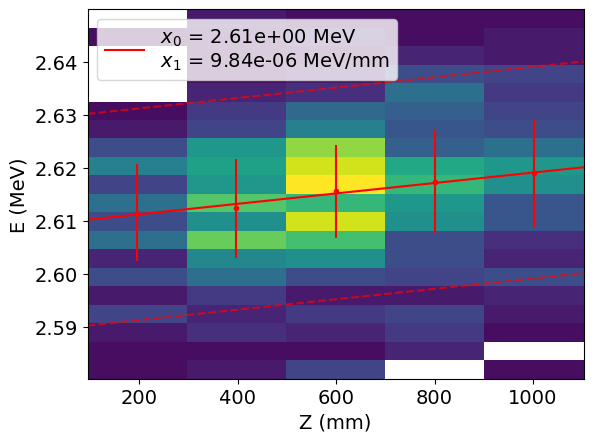

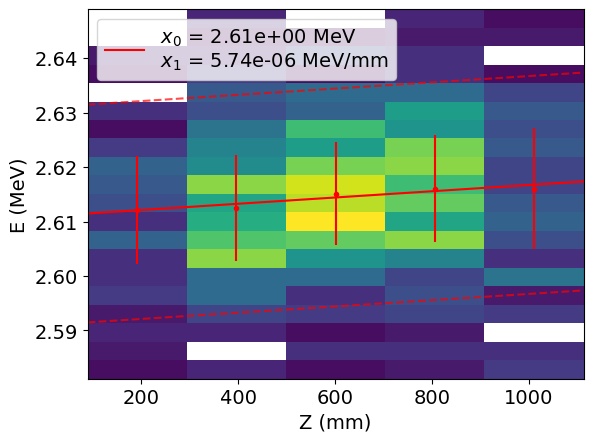

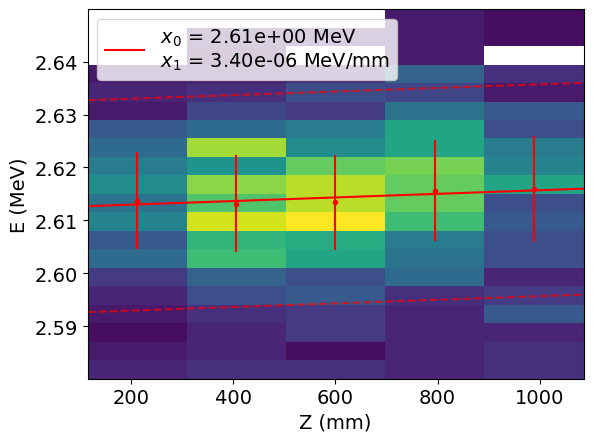

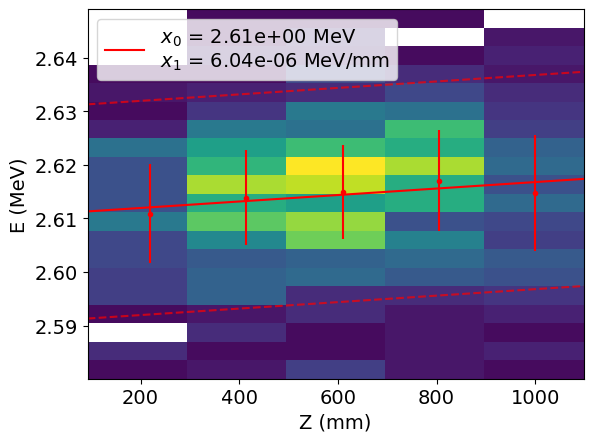

In [19]:
corr_par, corr_err = [], []

def get_corr_factor(par, err):
    f = par[0] / par[1]
    sf = np.sqrt(err[0]**2 + (par[0] * err[1] / par[1])**2) / par[1]
    return f, sf
ene_ranges = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.85, 0.87), (1.56, 1.62), (2.58, 2.65)]
ene_nbins = [10, 10, 10, 10, 10, 5]

for ene_rng, ene_bin in zip(ene_ranges, ene_nbins):
    f_, sf_ = [], []
    for run_n in run_numbers:
        par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], ene_rng) & (reco_summ.run_n == str(run_n))], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='', cmap=cmap, band_width = 0.02)
        f, sf = get_corr_factor(par_Z, err_Z)
        f_.append(f)
        sf_.append(sf)
    corr_par.append(f_)
    corr_err.append(sf_)


Text(0.5, 1.0, 'Z dependency')

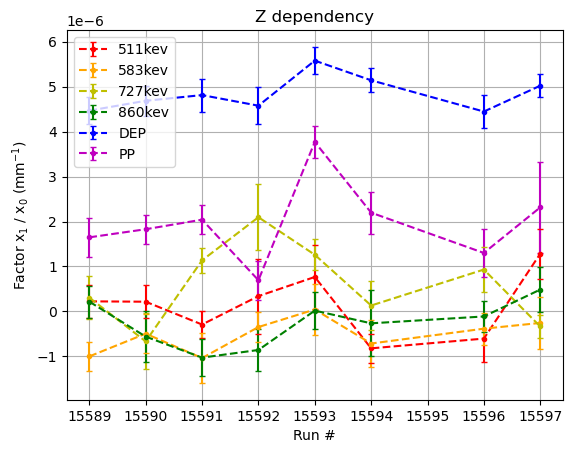

In [20]:
clrs = ['r', 'orange', 'y', 'g', 'b', 'm']
lbls = ['511kev', '583kev', '727kev', '860kev', 'DEP', 'PP']
for p_, e_, c_, l_ in zip(corr_par, corr_err, clrs, lbls):
    plt.errorbar(run_numbers, p_, yerr=e_, color = c_, marker='.', ls = '--', label = l_, capsize=2)
plt.legend(loc='upper left')
plt.grid()
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.xlabel('Run #')
plt.title('Z dependency')

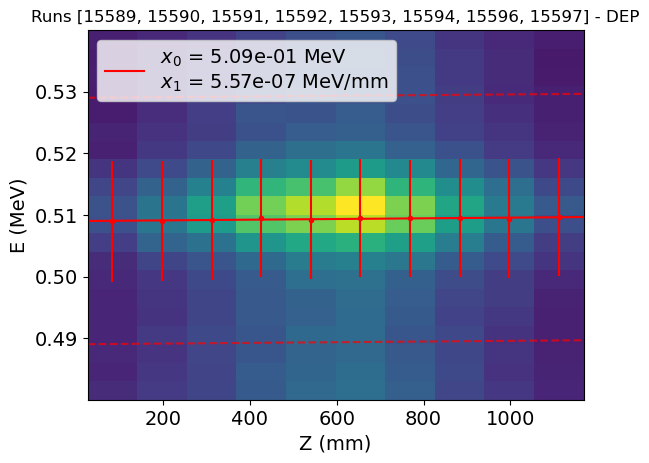

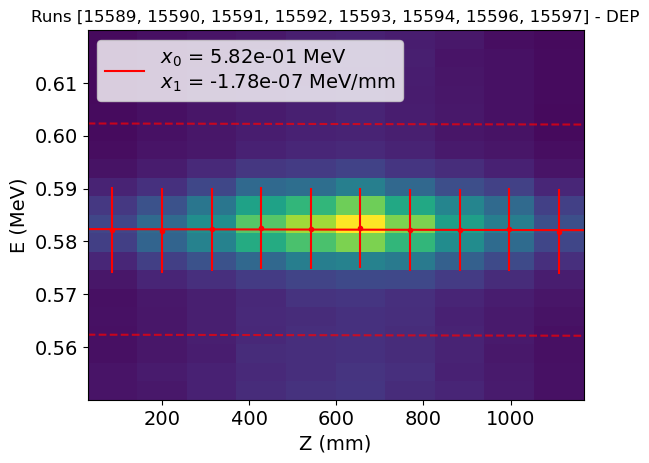

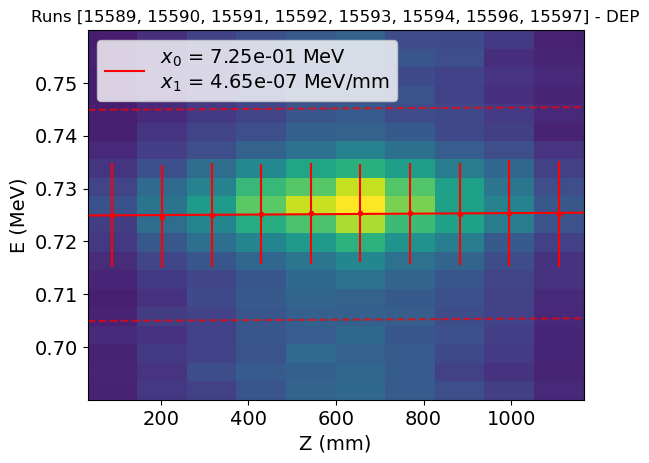

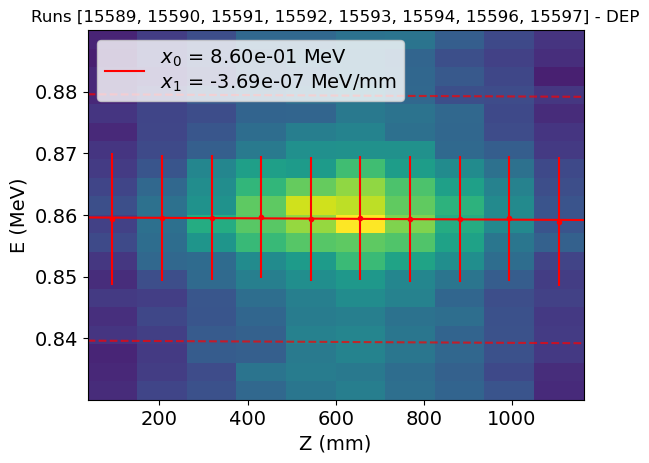

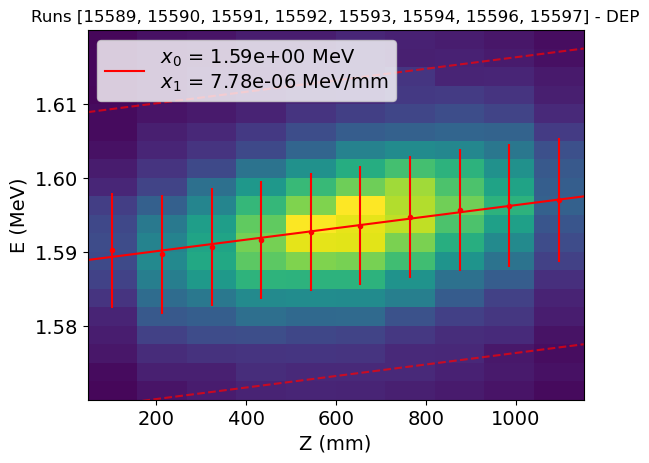

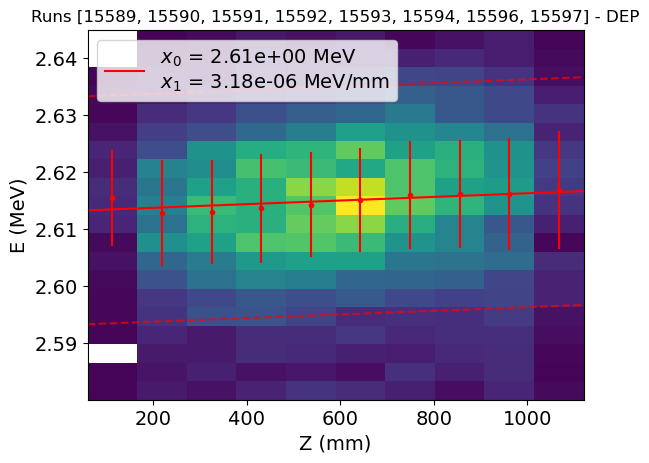

In [21]:
fit_ranges_corr = [(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

z_ranges_corr = [None, None, None, None, None, None]

corr_glob_par = []
corr_glob_err = []
for rang, zrng in zip(fit_ranges_corr, z_ranges_corr):
    par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], rang)], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(zrng, None), plotrange=(zrng, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
    corr_glob_par.append(par_Z) #.append(par_Z[0] / par_Z[1])
    corr_glob_err.append(err_Z) #.append(np.sqrt(err_Z[0]**2 + (par_Z[0] * err_Z[1] / par_Z[1])**2) / par_Z[1])

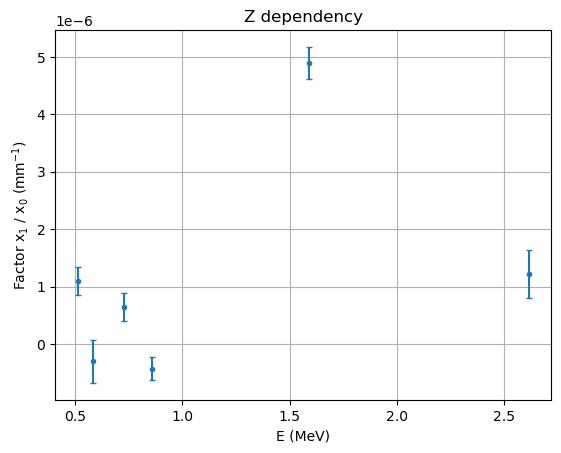

In [ ]:
m = np.array(corr_glob_par)[:, 0]
b = np.array(corr_glob_par)[:, 1]
sm = np.array(corr_glob_err)[:, 0]
sb = np.array(corr_glob_err)[:, 1]


fac = m / b
sfac = np.sqrt(sm**2 + (m * sb / b)**2) / b
plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)

plt.xlabel('E (MeV)')
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.title('Z dependency')
plt.grid()

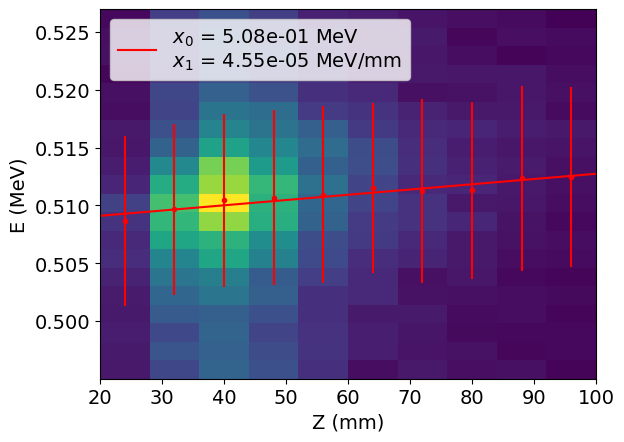

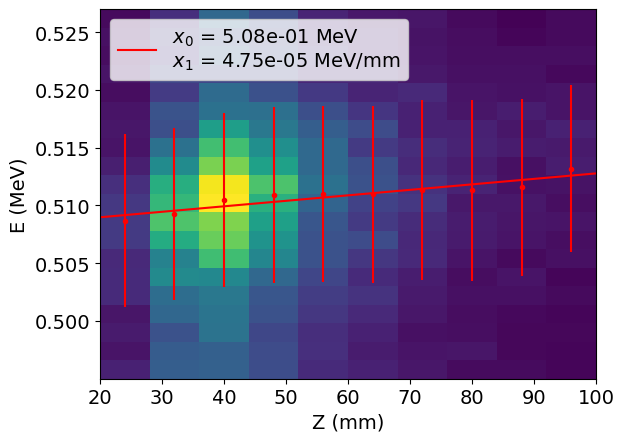

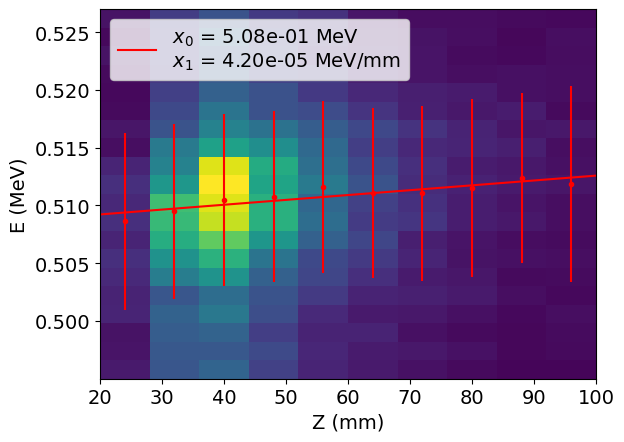

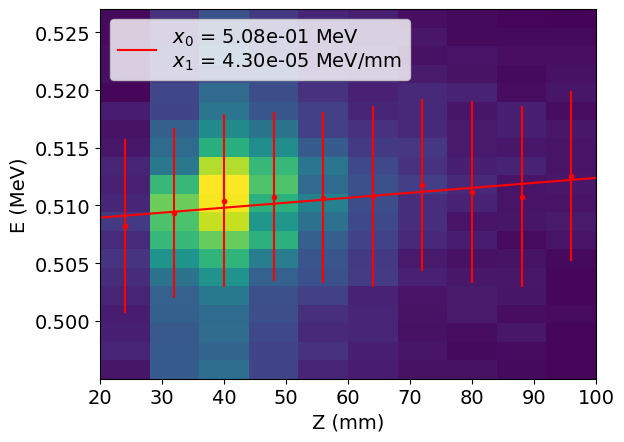

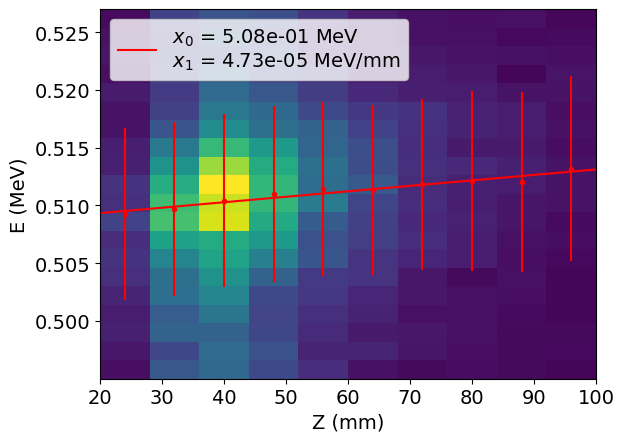

...

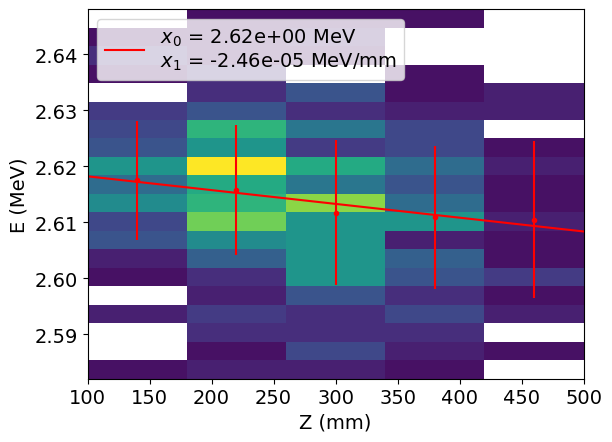

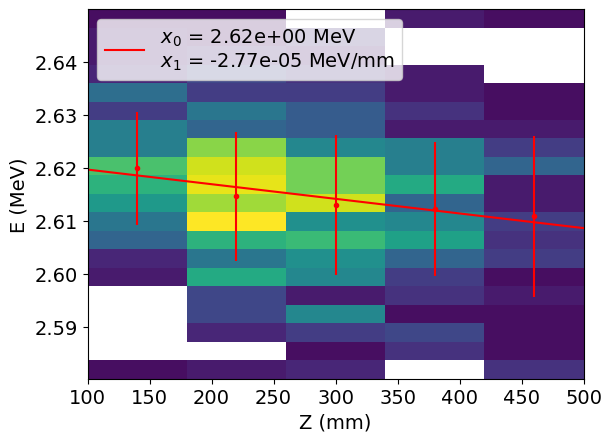

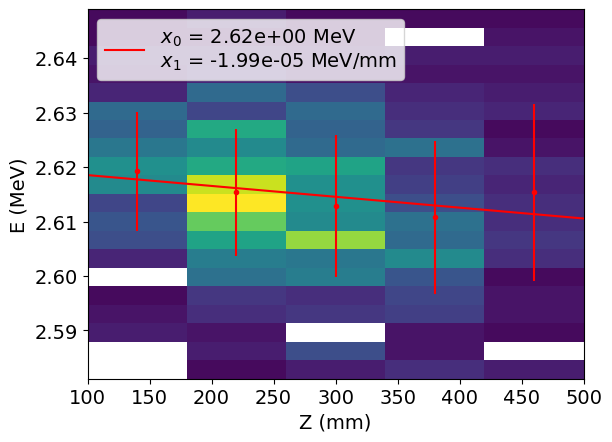

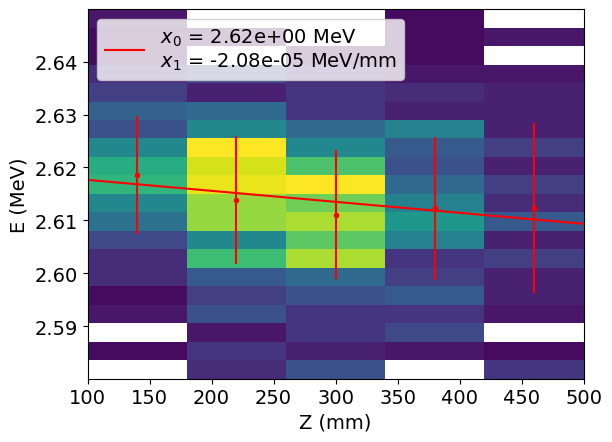

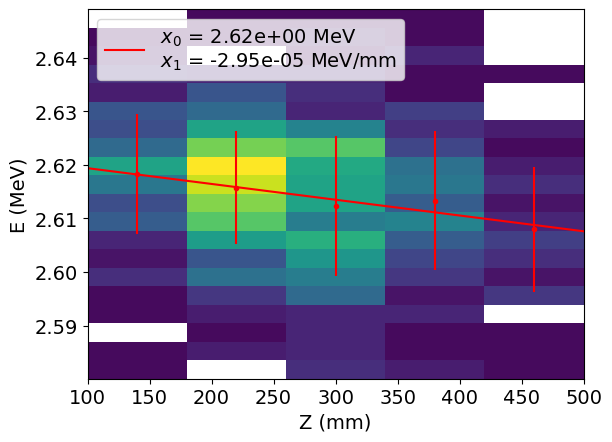

In [23]:
corr_par_dZ, corr_err_dZ = [], []

ene_ranges = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.85, 0.87), (1.56, 1.62), (2.58, 2.65)]
dz_ranges = [(20, 100), (20, 120), (25, 140), (30, 200), (60, 250), (100, 500)]
ene_nbins = [10, 10, 10, 10, 10, 5]

for ene_rng, ene_bin, dz_rng in zip(ene_ranges, ene_nbins, dz_ranges):
    f_, sf_ = [], []
    for run_n in run_numbers:
        df = reco_summ[in_range(reco_summ[ene_var_corr], ene_rng) & (reco_summ.run_n == str(run_n))]
        # mean = df['dZ'].mean() 
        # std = df['dZ'].std()
        # dzrange = (max(0, mean - 1.5*std), mean + 1.5*std)
        # print(dzrange)
        par_Z, err_Z = plot_profile(df, 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(dz_rng, None), plotrange=(dz_rng, None), axlabel = ['Z', 'E'], title='', cmap=cmap)
        f, sf = get_corr_factor(par_Z, err_Z)
        f_.append(f)
        sf_.append(sf)
    corr_par_dZ.append(f_)
    corr_err_dZ.append(sf_)

Text(0.5, 1.0, '$\\Delta$Z dependency')

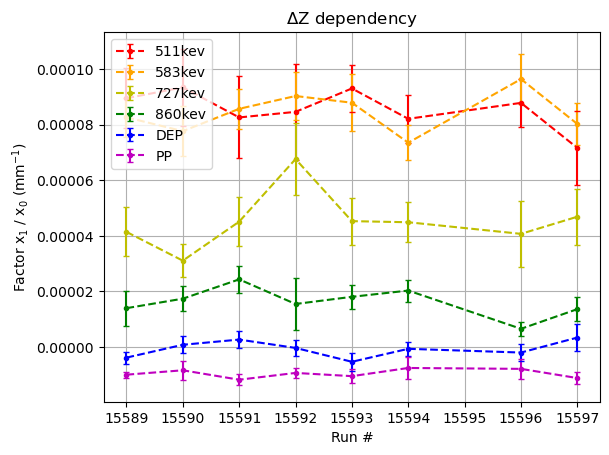

In [24]:
clrs = ['r', 'orange', 'y', 'g', 'b', 'm']
lbls = ['511kev', '583kev', '727kev', '860kev', 'DEP', 'PP']
for p_, e_, c_, l_ in zip(corr_par_dZ, corr_err_dZ, clrs, lbls):
    plt.errorbar(run_numbers, p_, yerr=e_, color = c_, marker='.', ls = '--', label = l_, capsize=2)
plt.legend(loc='upper left')
plt.grid()

plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.xlabel('Run #')
plt.title('$\Delta$Z dependency')

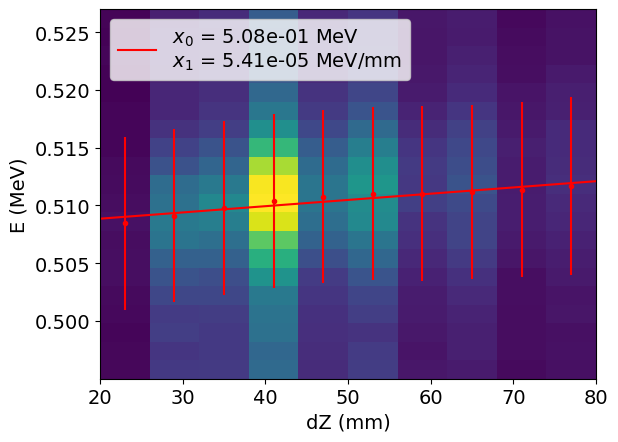

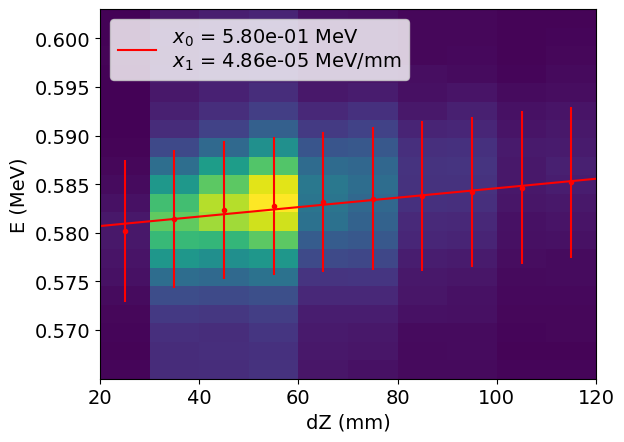

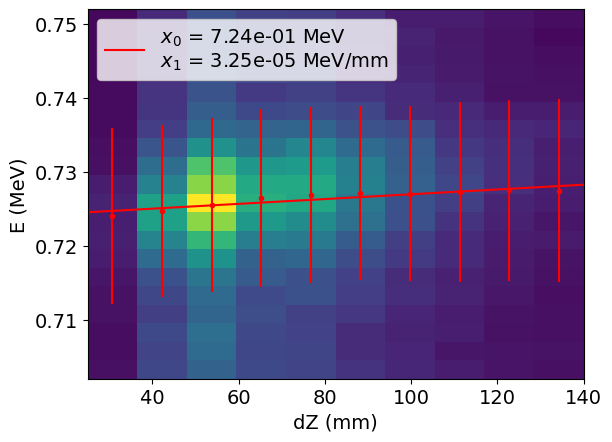

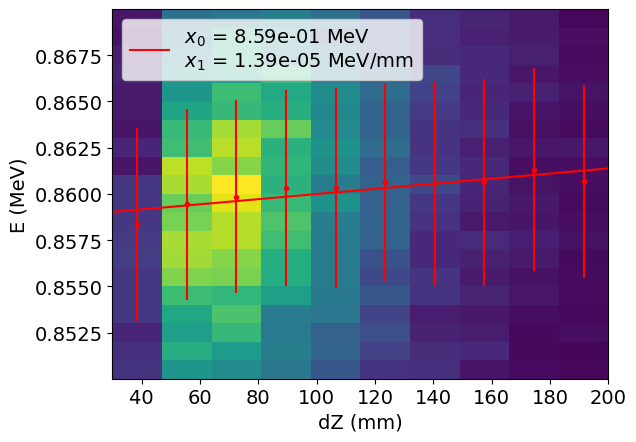

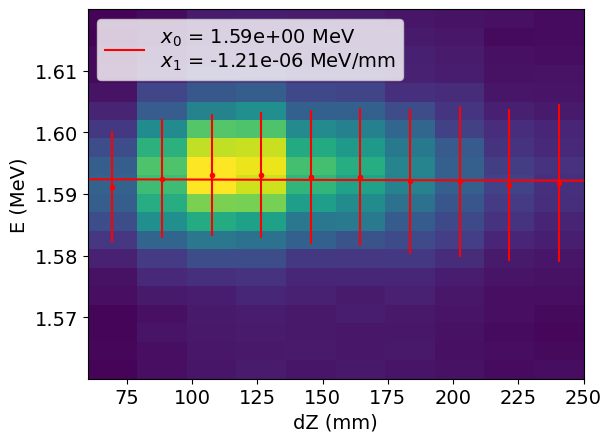

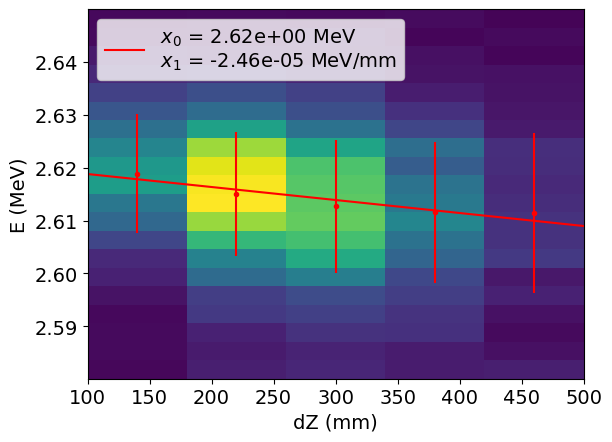

In [25]:
fit_ranges_corr = [(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

dz_ranges = [(20, 80), (20, 120), (25, 140), (30, 200), (60, 250), (100, 500)]

corr_glob_par_dz = []
corr_glob_err_dz = []
for rang, ene_bin, zrng in zip(ene_ranges, ene_nbins, dz_ranges):
    par_dZ, err_dZ = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], rang)], 'dZ', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(zrng, None), plotrange=(zrng, None), axlabel = ['dZ', 'E'], cmap=cmap)
    corr_glob_par_dz.append(par_dZ) #.append(par_Z[0] / par_Z[1])
    corr_glob_err_dz.append(err_dZ) #.append(np.sqrt(err_Z[0]**2 + (par_Z[0] * err_Z[1] / par_Z[1])**2) / par_Z[1])

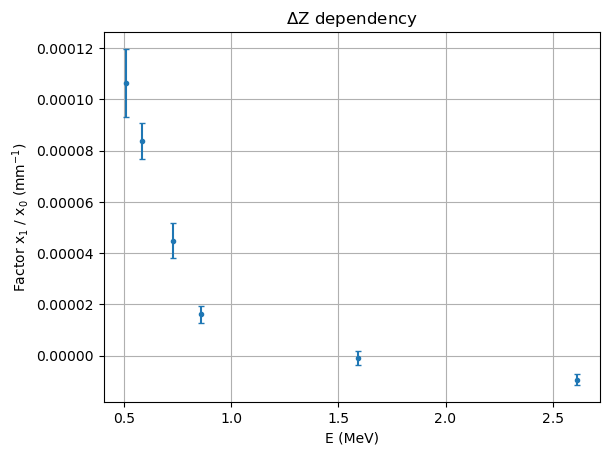

In [32]:
m = np.array(corr_glob_par_dz)[:, 0]
b = np.array(corr_glob_par_dz)[:, 1]
sm = np.array(corr_glob_err_dz)[:, 0]
sb = np.array(corr_glob_err_dz)[:, 1]


fac = m / b
sfac = np.sqrt(sm**2 + (m * sb / b)**2) / b
plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)

plt.xlabel('E (MeV)')
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.title('$\Delta$Z dependency')
plt.grid()

In [27]:
print(real_peaks)
print(fac)

[0.511, 0.583, 0.727, 0.86, 1.592, 2.615]
[ 1.06535647e-04  8.38643291e-05  4.48448663e-05  1.61330106e-05
 -7.58882771e-07 -9.37974054e-06]


In [28]:
print(sfac)

[1.32067500e-05 6.93019252e-06 6.76919483e-06 3.26077810e-06
 2.73990630e-06 2.05392556e-06]


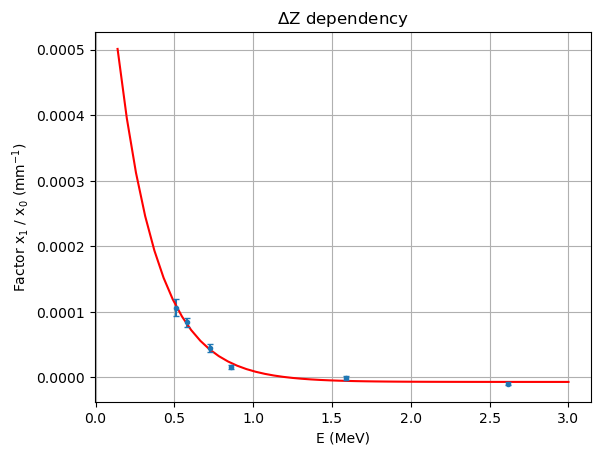

In [33]:
def expon(x, A, k, C):
    return A * np.exp(-k * x) + C

par, err  = curve_fit(expon, real_peaks, fac)
err = np.sqrt(np.diag(err))

plotx = np.linspace(0.14, 3, 50)
plt.plot(plotx, expon(plotx, *par), color = 'r') #, label = 'm$ = {:.2e} \pm {:.2e}$ MeV / pe'.format(par[0], err[0]) + '\n n$ = {:.2e} \pm {:.2e}$ MeV'.format(par[1], err[1]))

plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)

plt.xlabel('E (MeV)')
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.title('$\Delta$Z dependency')
plt.grid()

In [40]:
reco_summ['E_dZfit_corr'] =  reco_summ[ene_var_corr] / (1 + expon(reco_summ[ene_var_corr], *par) * reco_summ.dZ)


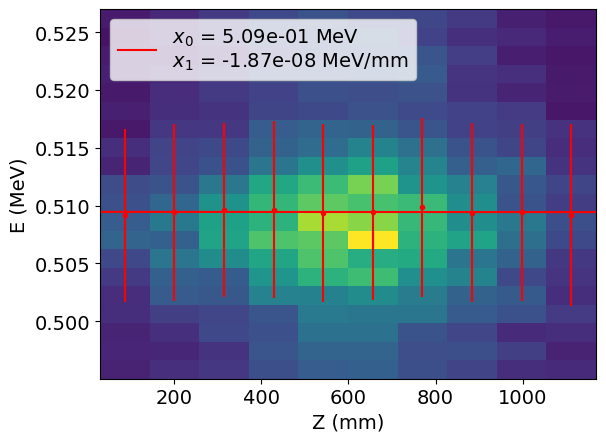

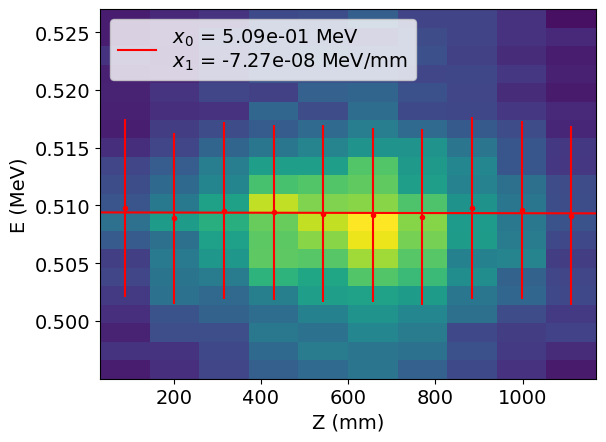

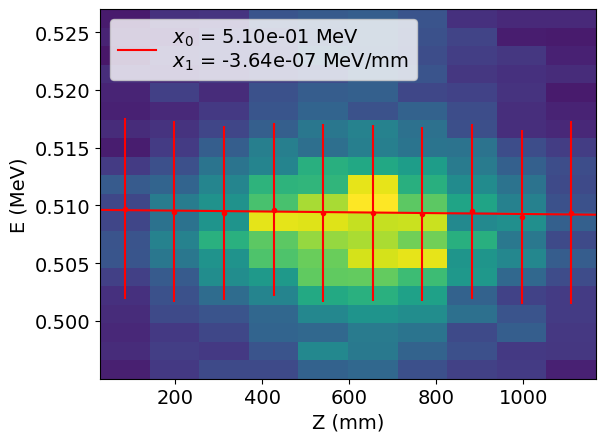

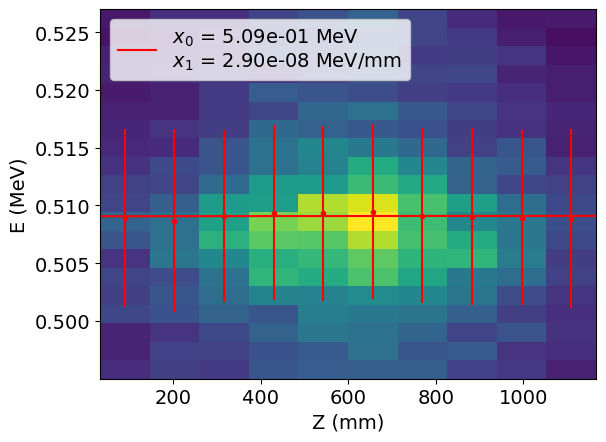

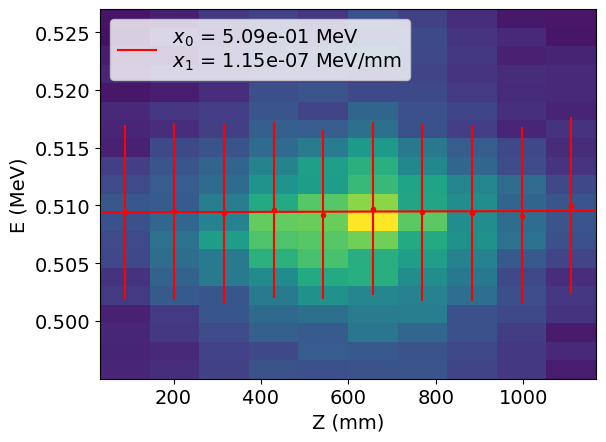

...

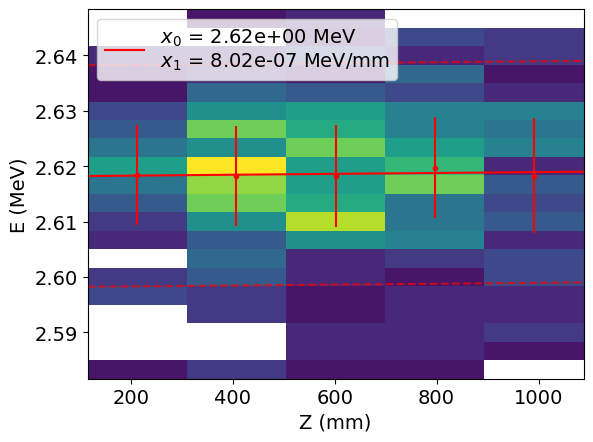

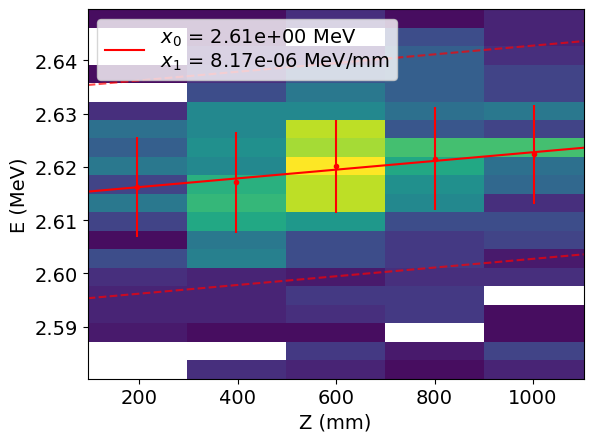

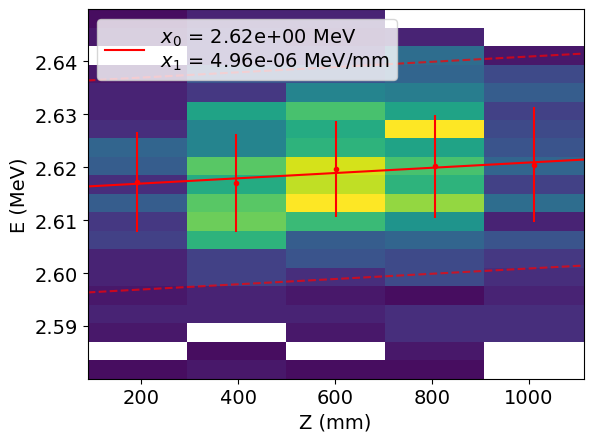

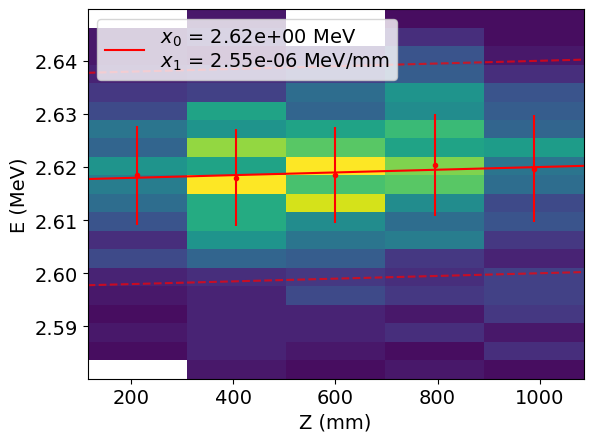

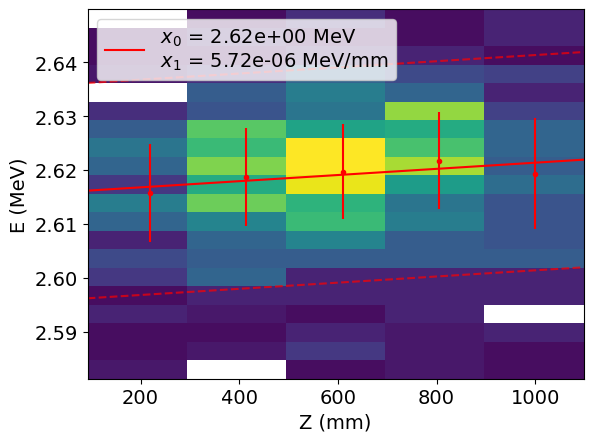

In [42]:
corr_par, corr_err = [], []

def get_corr_factor(par, err):
    f = par[0] / par[1]
    sf = np.sqrt(err[0]**2 + (par[0] * err[1] / par[1])**2) / par[1]
    return f, sf
ene_ranges = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.85, 0.87), (1.56, 1.62), (2.58, 2.65)]
ene_nbins = [10, 10, 10, 10, 10, 5]

for ene_rng, ene_bin in zip(ene_ranges, ene_nbins):
    f_, sf_ = [], []
    for run_n in run_numbers:
        par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ['E_dZfit_corr'], ene_rng) & (reco_summ.run_n == str(run_n))], 'Z_bary', 'E_dZfit_corr', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(None, None), plotrange=(None, None), axlabel = ['Z', 'E'], title='', cmap=cmap, band_width = 0.02)
        f, sf = get_corr_factor(par_Z, err_Z)
        f_.append(f)
        sf_.append(sf)
    corr_par.append(f_)
    corr_err.append(sf_)

Text(0.5, 1.0, 'Z dependency')

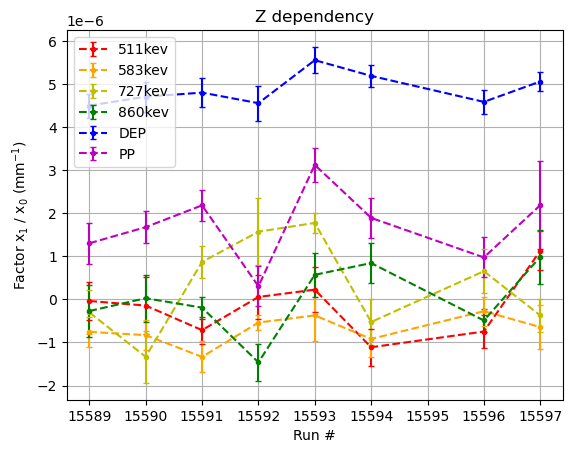

In [43]:
clrs = ['r', 'orange', 'y', 'g', 'b', 'm']
lbls = ['511kev', '583kev', '727kev', '860kev', 'DEP', 'PP']
for p_, e_, c_, l_ in zip(corr_par, corr_err, clrs, lbls):
    plt.errorbar(run_numbers, p_, yerr=e_, color = c_, marker='.', ls = '--', label = l_, capsize=2)
plt.legend(loc='upper left')
plt.grid()
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.xlabel('Run #')
plt.title('Z dependency')

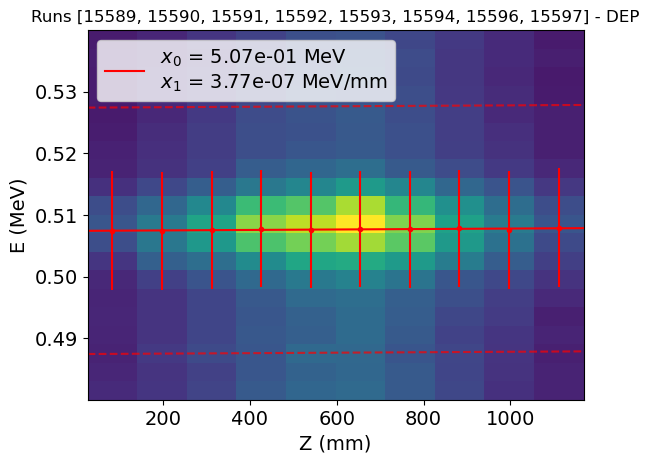

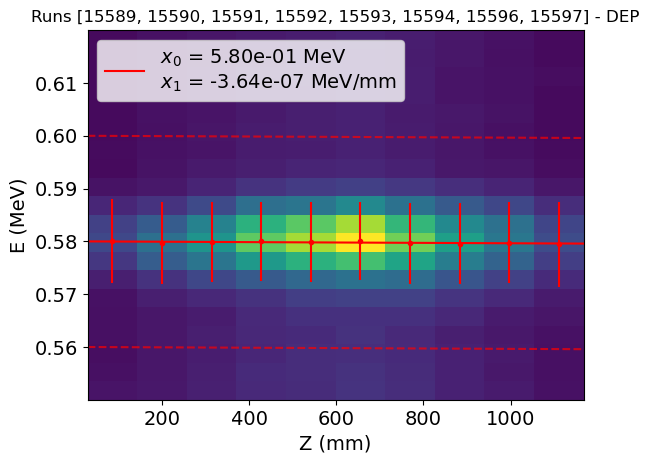

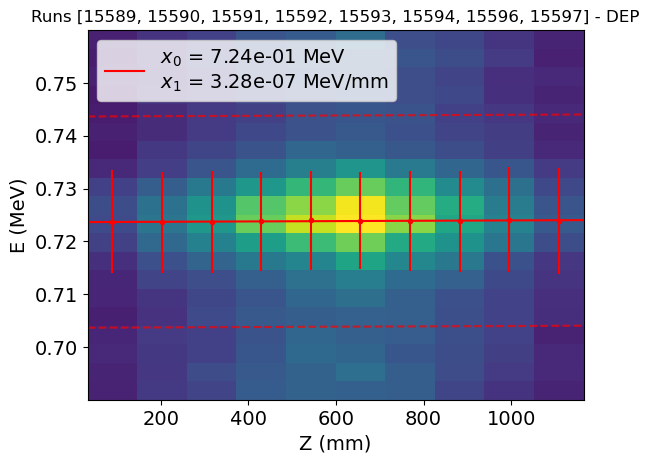

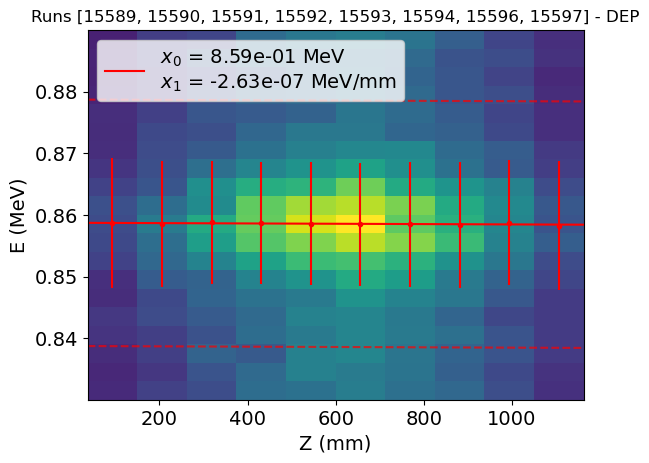

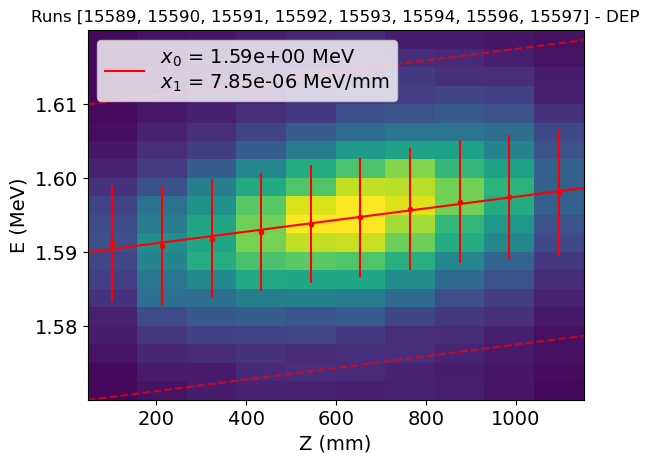

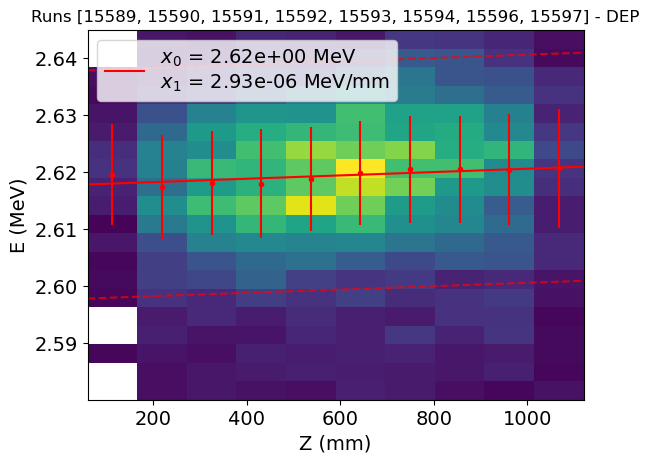

In [44]:
fit_ranges_corr = [(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

z_ranges_corr = [None, None, None, None, None, None]

corr_glob_par = []
corr_glob_err = []
for rang, zrng in zip(fit_ranges_corr, z_ranges_corr):
    par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ['E_dZfit_corr'], rang)], 'Z_bary', 'E_dZfit_corr', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(zrng, None), plotrange=(zrng, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
    corr_glob_par.append(par_Z) #.append(par_Z[0] / par_Z[1])
    corr_glob_err.append(err_Z) #.append(np.sqrt(err_Z[0]**2 + (par_Z[0] * err_Z[1] / par_Z[1])**2) / par_Z[1])

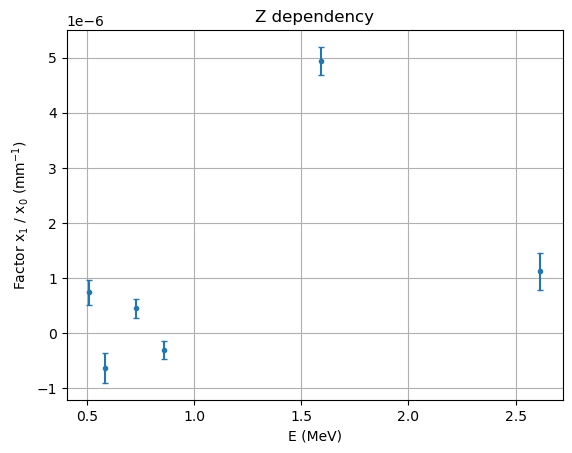

In [45]:
m = np.array(corr_glob_par)[:, 0]
b = np.array(corr_glob_par)[:, 1]
sm = np.array(corr_glob_err)[:, 0]
sb = np.array(corr_glob_err)[:, 1]


fac = m / b
sfac = np.sqrt(sm**2 + (m * sb / b)**2) / b
plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)

plt.xlabel('E (MeV)')
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.title('Z dependency')
plt.grid()

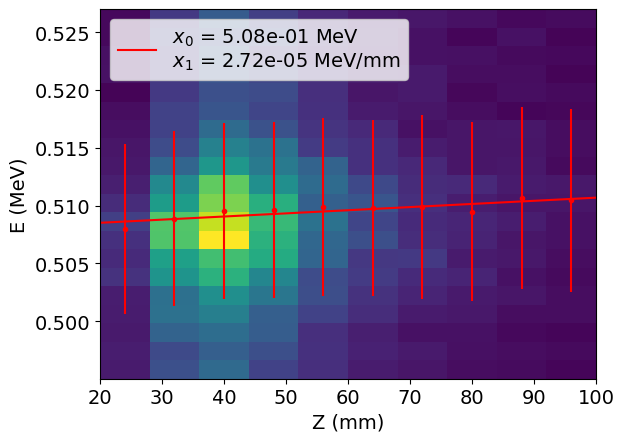

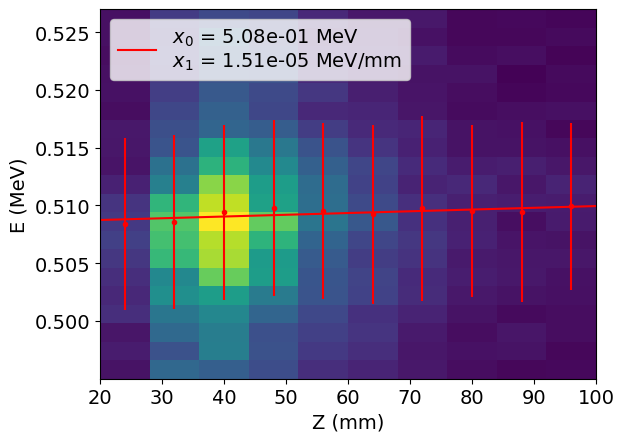

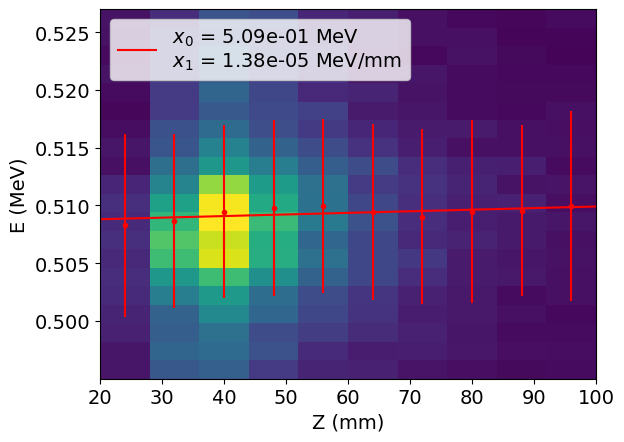

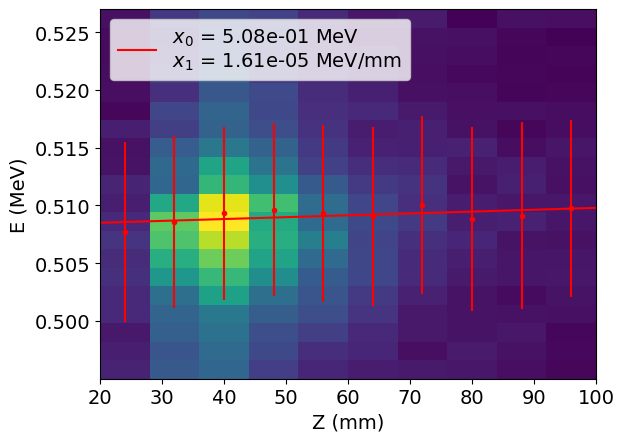

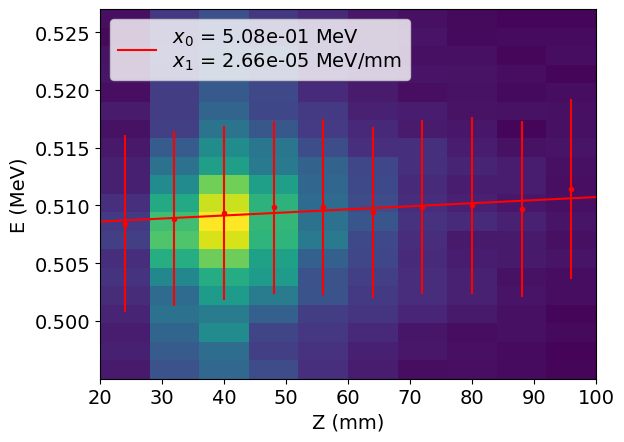

...

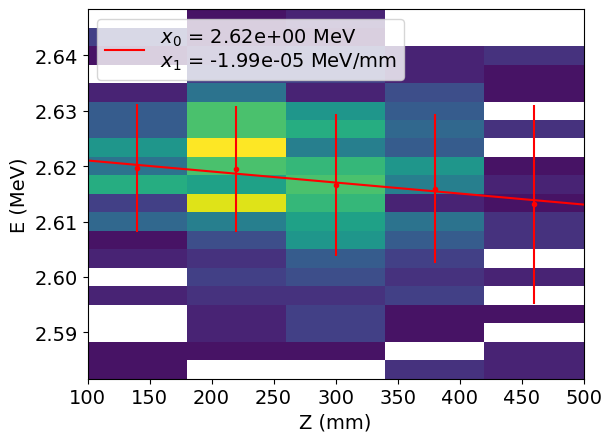

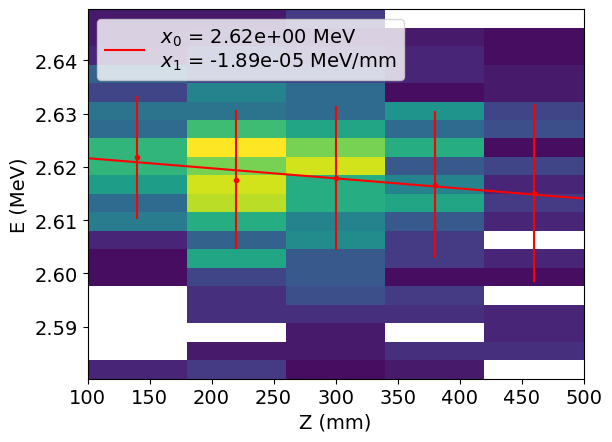

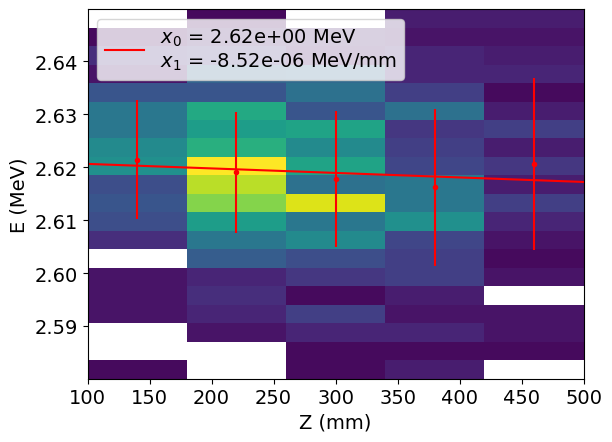

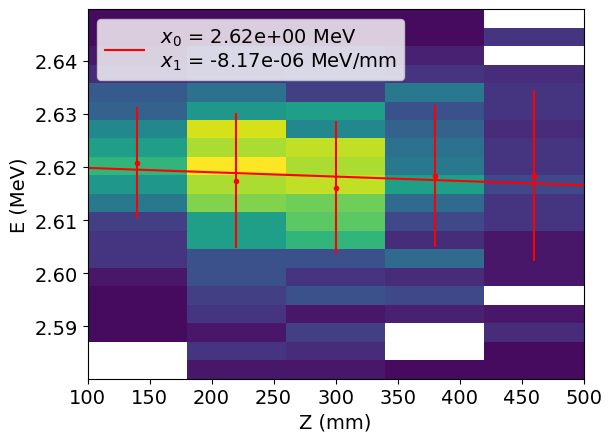

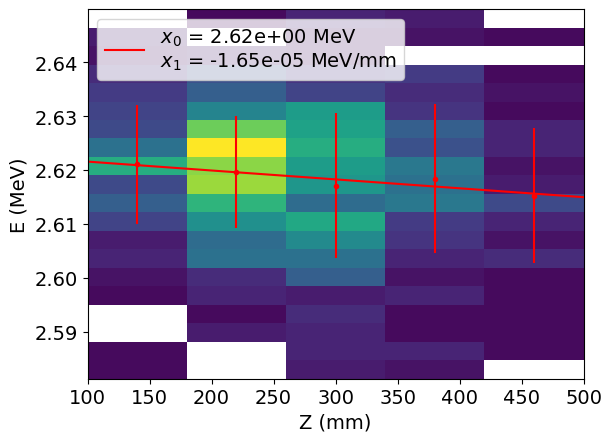

In [46]:
corr_par_dZ, corr_err_dZ = [], []

ene_ranges = [(0.495, 0.527), (0.565, 0.603), (0.702, 0.752), (0.85, 0.87), (1.56, 1.62), (2.58, 2.65)]
dz_ranges = [(20, 100), (20, 120), (25, 140), (30, 200), (60, 250), (100, 500)]
ene_nbins = [10, 10, 10, 10, 10, 5]

for ene_rng, ene_bin, dz_rng in zip(ene_ranges, ene_nbins, dz_ranges):
    f_, sf_ = [], []
    for run_n in run_numbers:
        df = reco_summ[in_range(reco_summ['E_dZfit_corr'], ene_rng) & (reco_summ.run_n == str(run_n))]
        # mean = df['dZ'].mean() 
        # std = df['dZ'].std()
        # dzrange = (max(0, mean - 1.5*std), mean + 1.5*std)
        # print(dzrange)
        par_Z, err_Z = plot_profile(df, 'dZ', 'E_dZfit_corr', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(dz_rng, None), plotrange=(dz_rng, None), axlabel = ['Z', 'E'], title='', cmap=cmap)
        f, sf = get_corr_factor(par_Z, err_Z)
        f_.append(f)
        sf_.append(sf)
    corr_par_dZ.append(f_)
    corr_err_dZ.append(sf_)

Text(0.5, 1.0, '$\\Delta$Z dependency')

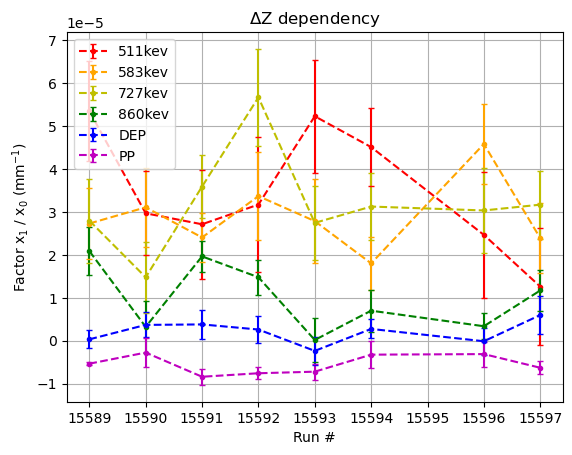

In [47]:
clrs = ['r', 'orange', 'y', 'g', 'b', 'm']
lbls = ['511kev', '583kev', '727kev', '860kev', 'DEP', 'PP']
for p_, e_, c_, l_ in zip(corr_par_dZ, corr_err_dZ, clrs, lbls):
    plt.errorbar(run_numbers, p_, yerr=e_, color = c_, marker='.', ls = '--', label = l_, capsize=2)
plt.legend(loc='upper left')
plt.grid()

plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.xlabel('Run #')
plt.title('$\Delta$Z dependency')

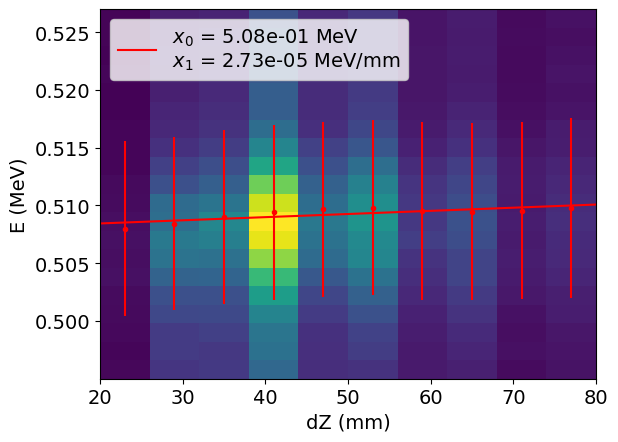

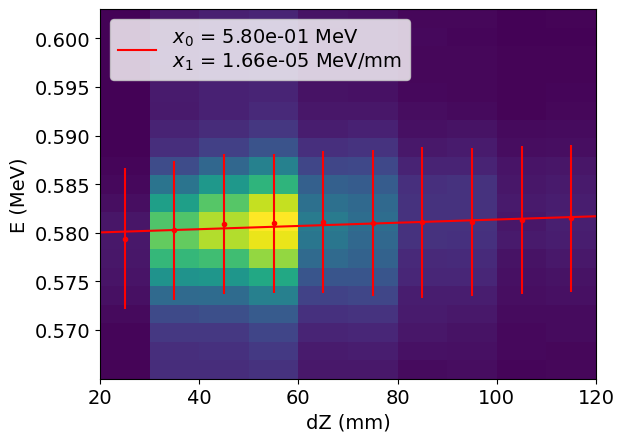

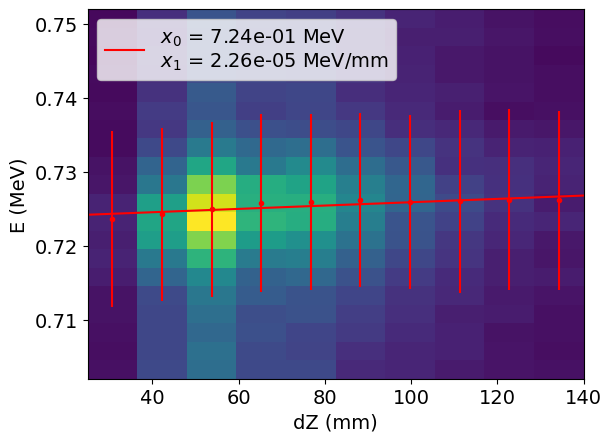

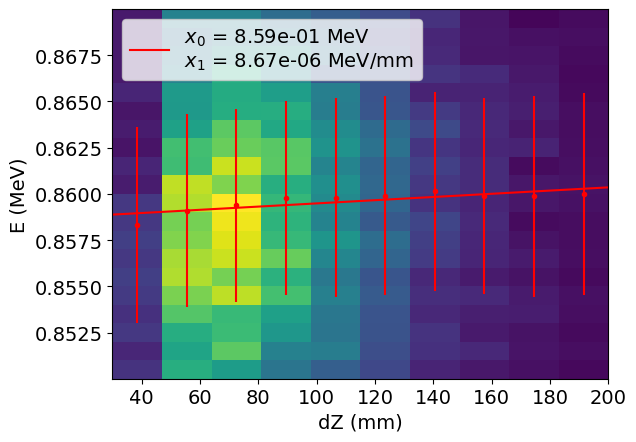

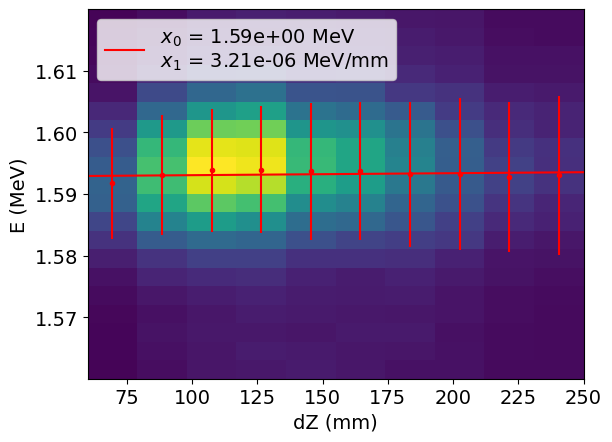

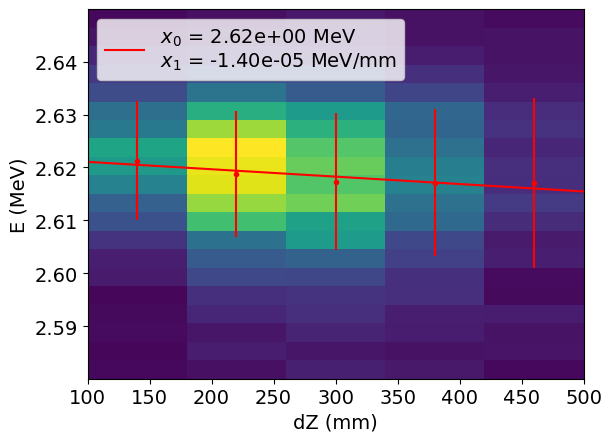

In [49]:
fit_ranges_corr = [(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

dz_ranges = [(20, 80), (20, 120), (25, 140), (30, 200), (60, 250), (100, 500)]

corr_glob_par_dz = []
corr_glob_err_dz = []
for rang, ene_bin, zrng in zip(ene_ranges, ene_nbins, dz_ranges):
    par_dZ, err_dZ = plot_profile(reco_summ[in_range(reco_summ['E_dZfit_corr'], rang)], 'dZ', 'E_dZfit_corr', fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=ene_bin, plotbins=(ene_bin, 20), fitrange=(zrng, None), plotrange=(zrng, None), axlabel = ['dZ', 'E'], cmap=cmap)
    corr_glob_par_dz.append(par_dZ) #.append(par_Z[0] / par_Z[1])
    corr_glob_err_dz.append(err_dZ) #.append(np.sqrt(err_Z[0]**2 + (par_Z[0] * err_Z[1] / par_Z[1])**2) / par_Z[1])

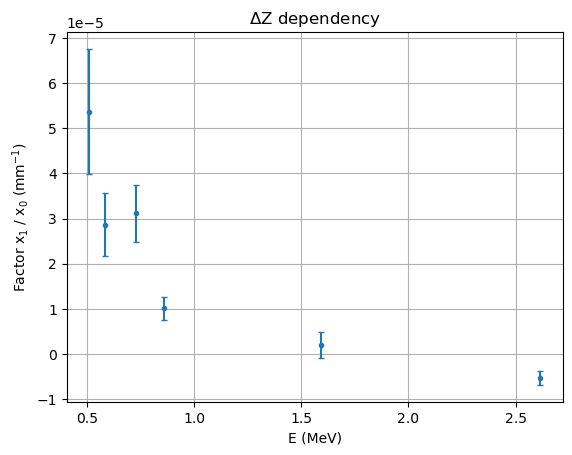

In [50]:
m = np.array(corr_glob_par_dz)[:, 0]
b = np.array(corr_glob_par_dz)[:, 1]
sm = np.array(corr_glob_err_dz)[:, 0]
sb = np.array(corr_glob_err_dz)[:, 1]


fac = m / b
sfac = np.sqrt(sm**2 + (m * sb / b)**2) / b
plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)

plt.xlabel('E (MeV)')
plt.ylabel('Factor x$_1$ / x$_0$ (mm$^{-1}$)')
plt.title('$\Delta$Z dependency')
plt.grid()

### Testing:

Trying fitting to all runs except from one, and apply to that one

In [361]:
test_run = '15597'

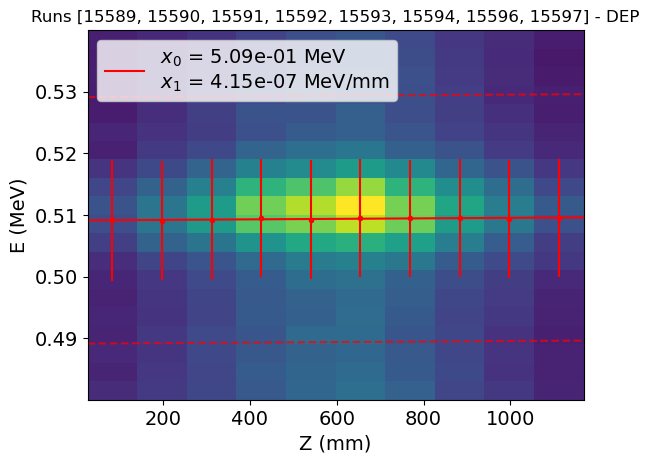

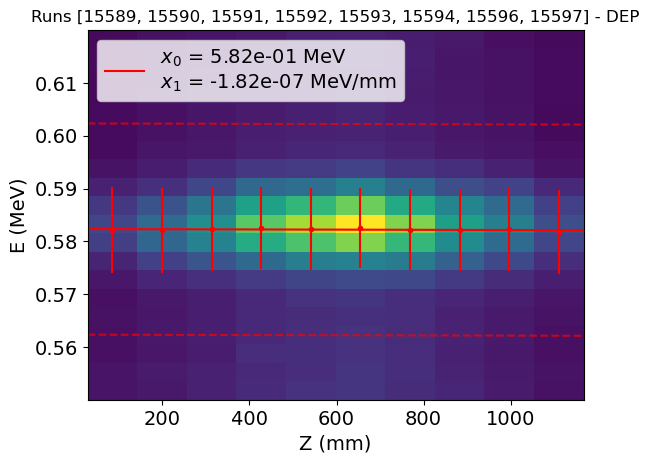

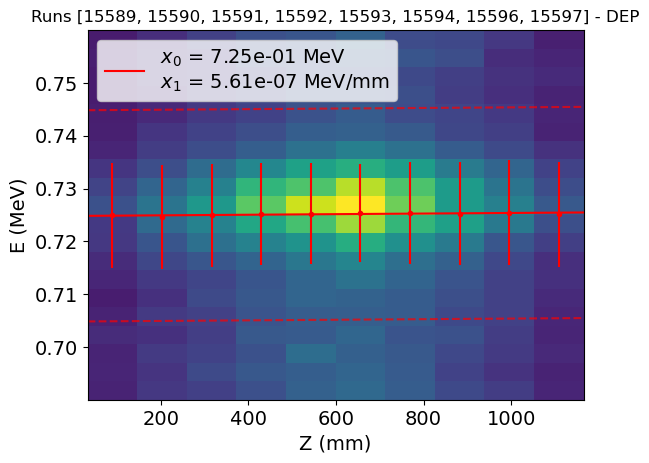

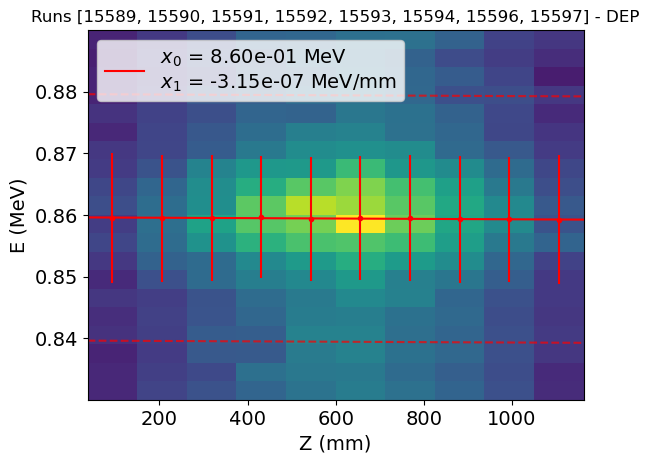

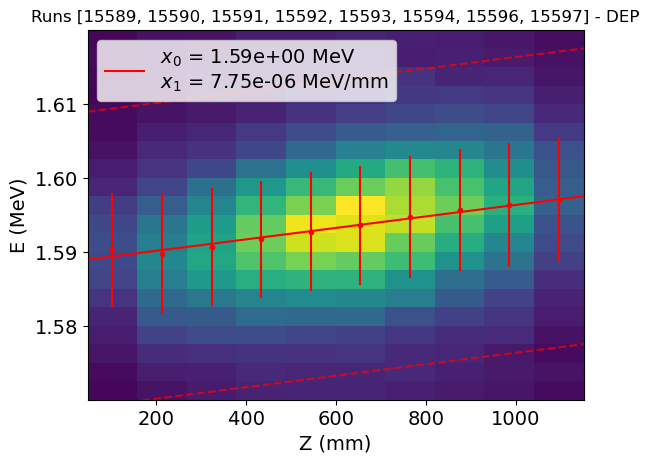

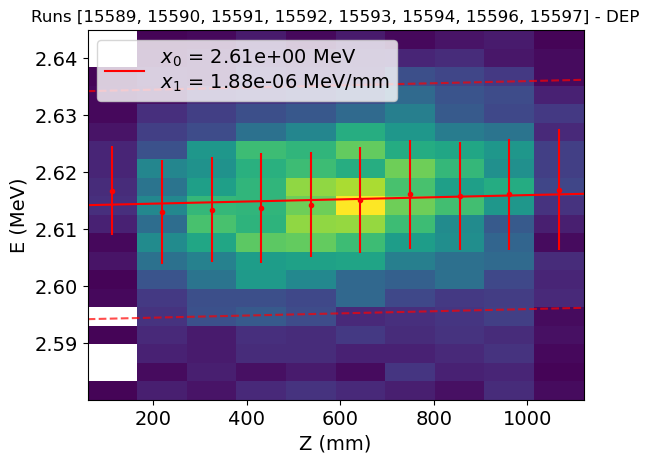

In [ ]:
fit_ranges_corr = [(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

z_ranges_corr = [None, None, None, None, None, None]

corr_glob_par = []
corr_glob_err = []
for rang, zrng in zip(fit_ranges_corr, z_ranges_corr):
    par_Z, err_Z = plot_profile(reco_summ[in_range(reco_summ[ene_var_corr], rang) & (reco_summ.run_n != test_run)], 'Z_bary', ene_var_corr, fitfun=lineal, initial_values=(0, 1.67), std = True, fitbins=10, plotbins=(10, 20), fitrange=(zrng, None), plotrange=(zrng, None), axlabel = ['Z', 'E'], title='Runs {} - DEP'.format(run_numbers), cmap=cmap, band_width = 0.02)
    corr_glob_par.append(par_Z) #.append(par_Z[0] / par_Z[1])
    corr_glob_err.append(err_Z) #.append(np.sqrt(err_Z[0]**2 + (par_Z[0] * err_Z[1] / par_Z[1])**2) / par_Z[1])

In [367]:
factor

3.054965648802343e-06

In [368]:
np.mean(fac)

1.0851462827152712e-06

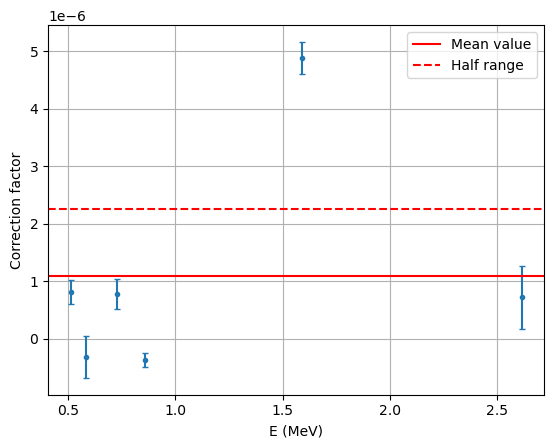

In [386]:
m = np.array(corr_glob_par)[:, 0]
b = np.array(corr_glob_par)[:, 1]
sm = np.array(corr_glob_err)[:, 0]
sb = np.array(corr_glob_err)[:, 1]


fac = m / b
sfac = np.sqrt(sm**2 + (m * sb / b)**2) / b
plt.errorbar(real_peaks, fac, yerr=sfac, marker='.', ls = '', capsize=2)
plt.axhline(np.mean(fac), c = 'r', label = 'Mean value')
plt.axhline((fac.min() + fac.max())/ 2, c = 'r', ls = '--', label = 'Half range')
plt.legend()
plt.ylabel('Correction factor')
plt.xlabel('E (MeV)')
plt.grid()

In [387]:
test_data = reco_summ[reco_summ.run_n == test_run].copy()

In [388]:
fctor = (fac.min() + fac.max())/ 2

In [389]:
test_data['E_Z_corr'] =  test_data[ene_var_corr] / (1 + np.mean(fac) * test_data.Z_bary)


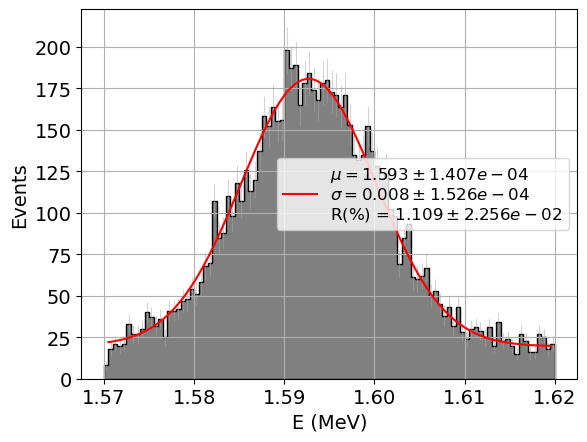

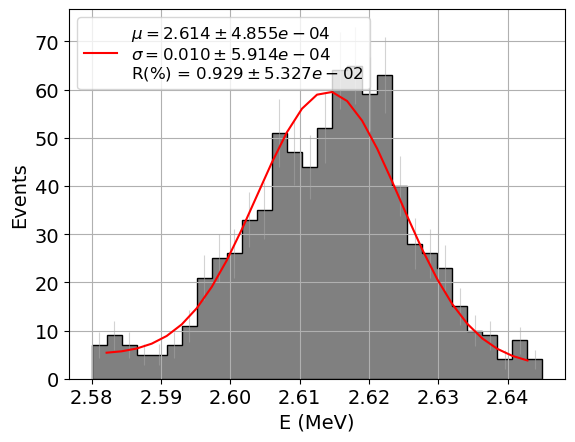

In [390]:
fit_whole_peaks_paper(test_data, ene_var_corr, peak_fit, fit_ranges[-2], fit_ranges[-2], 100, plot = True)
plt.show()


fit_whole_peaks_paper(test_data, ene_var_corr, peak_fit, fit_ranges[-1], fit_ranges[-1], 30, plot = True)
plt.show()

In [393]:
fit_ranges

[(0.48, 0.54),
 (0.55, 0.62),
 (0.69, 0.76),
 (0.83, 0.89),
 (1.57, 1.62),
 (2.58, 2.645)]

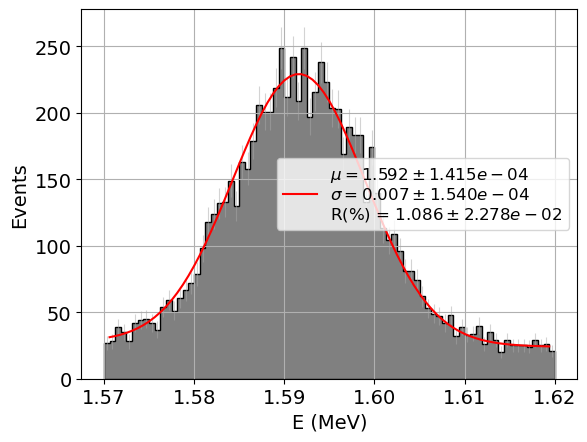

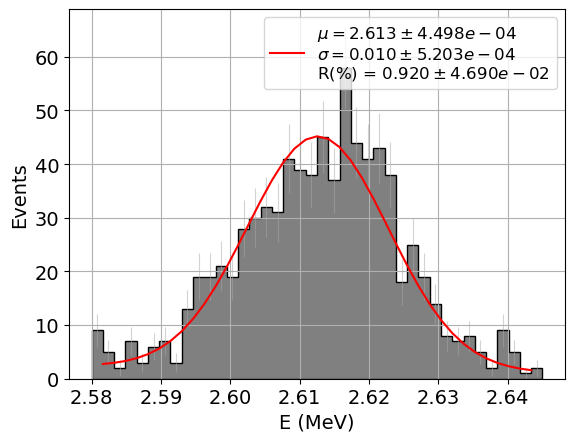

In [392]:
fit_whole_peaks_paper(test_data, 'E_Z_corr', peak_fit, fit_ranges[-2], fit_ranges[-2], 80, plot = True)
plt.show()


fit_whole_peaks_paper(test_data, 'E_Z_corr', peak_fit, fit_ranges[-1], fit_ranges[-1], 40, plot = True)
plt.show()

In [ ]:
test_data['E']

,event,npeak,run_n,file_n,ldc_n,time,dX,dY,dZ,Xmin,...,Ymax,Zmax,X_bary,Y_bary,Z_bary,total_E,total_energy,num_hits,Et,E_final
7,134,30,15597,0000,ldc1,1.752588e+09,401.30,262.35,110.750000,-235.825,...,29.225,416.061000,-135.719475,-106.050158,358.089611,334590.469634,339724.785058,1019,339163.691503,1.634954
8,141,26,15597,0000,ldc1,1.752588e+09,123.40,170.05,63.271250,10.975,...,-31.975,559.147250,85.483914,-136.039304,540.963762,80583.898156,81736.959697,268,81601.961944,0.399695
28,344,3,15597,0000,ldc1,1.752588e+09,509.15,246.80,122.533375,-220.275,...,230.375,724.976625,177.821259,77.094812,644.520990,218222.968665,225612.882709,749,225240.257558,1.088580
43,456,26,15597,0000,ldc1,1.752588e+09,123.40,138.95,67.249000,212.125,...,-78.125,329.546375,266.983934,-148.020241,286.108823,109592.078230,114297.176568,329,114108.401823,0.555595
44,463,24,15597,0000,ldc1,1.752588e+09,92.30,123.40,22.927250,227.675,...,137.575,401.379125,267.350430,83.009315,390.844721,57510.154466,60285.136229,155,60185.568489,0.296982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,3828076,18,15597,5370,ldc7,1.752674e+09,185.60,262.35,127.080500,-96.875,...,322.675,756.670750,-15.589238,159.308605,693.238208,114223.100682,118017.455263,456,117819.449059,0.573393
13,3828230,22,15597,5370,ldc7,1.752674e+09,138.95,138.95,26.769250,288.875,...,60.825,590.777750,355.499240,-6.786320,577.540461,65896.743470,71528.076182,223,71408.068487,0.350805
47,3828531,31,15597,5370,ldc7,1.752674e+09,170.05,339.10,47.254250,-81.325,...,291.575,965.909000,1.523561,103.155084,935.400033,117373.202233,121362.681440,479,121159.062715,0.589409
54,3828566,19,15597,5370,ldc7,1.752674e+09,123.40,462.50,71.389000,104.275,...,322.675,905.952125,163.573332,-75.092490,851.997868,68037.827650,70285.403376,249,70167.480601,0.344855
